In [51]:
window_size="_128"
# " + window_size + "

In [52]:
import adclasses
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import joblib
import math
from datetime import timedelta
import os
import warnings
warnings.filterwarnings('ignore')

In [53]:
dataset_name_list = ["nyc_taxi",
                     "exchange-2_cpm_results",
                     "exchange-3_cpm_results",
                     "all_data_gift_certificates",
                     "elb_request_count_8c0756",
                     "FARM_Bowling-Green-5-S_Warren",
                     "exchange-2_cpc_results",
                     "exchange-3_cpc_results",
                     "international-airline-passengers",
                     "ambient_temperature_system_failure"]
true_outlier_indices_dict = {}
ad_dict = {}

# nyc_taxi

In [54]:
dataset_name = "nyc_taxi"

path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)
data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, '30min', data))

data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")
ad = adclasses.UnivariateAnomalyDetection(dataframe=data, timestep="30min", dateformat="%Y-%m-%d %H:%M:%S", name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-11-01 19:00:00",
                      "2014-11-27 15:30:00",
                      "2014-12-25 15:00:00",
                      "2015-01-01 01:00:00",
                      "2015-01-27 00:00:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-07-01 00:00:00
End date:  2015-01-31 23:30:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='30T')
Length:  10320
Time step size:  30min
Date Format:  %Y-%m-%d %H:%M:%S


# exchange-2_cpm_results

In [55]:
dataset_name = "exchange-2_cpm_results"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
data = data.dropna()
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)
data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, '1H', data))

# if you want to use a method that cannot take missing time steps
# into account, you need to fill in the missing time steps yourself
# this function also removes duplicates
print("Fill Missing Time Steps with Interpolation")
data = adclasses.fill_missing_time_steps(start_date, end_date, '1H', data, method="linear")

data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")
ad = adclasses.UnivariateAnomalyDetection(dataframe=data, timestep="1H", dateformat="%Y-%m-%d %H:%M:%S", name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2011-07-26 06:00:01",
                      "2011-08-10 17:00:01"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2011-07-01 00:00:01
End date:  2011-09-07 15:00:01
Missing time stamps: 
 DatetimeIndex(['2011-07-21 05:00:01', '2011-08-08 18:00:01',
               '2011-08-10 16:00:01', '2011-08-15 22:00:01',
               '2011-08-15 23:00:01', '2011-09-01 19:00:01',
               '2011-09-01 20:00:01', '2011-09-01 21:00:01',
               '2011-09-01 22:00:01', '2011-09-01 23:00:01',
               '2011-09-02 00:00:01', '2011-09-02 01:00:01',
               '2011-09-02 02:00:01', '2011-09-02 03:00:01',
               '2011-09-02 04:00:01', '2011-09-02 05:00:01',
               '2011-09-02 06:00:01', '2011-09-02 07:00:01',
               '2011-09-02 08:00:01', '2011-09-02 09:00:01',
               '2011-09-02 10:00:01', '2011-09-02 11:00:01',
               '2011-09-02 12:00:01', '2011-09-02 13:00:01',
               '2011-09-02 14:00:01'],
              dtype='datetime64[ns]', freq=None)
Fill Missing Time Steps with Interpolation
Duplicate records found: 
                        

#  ambient_temperature_system_failure

In [56]:
dataset_name = "ambient_temperature_system_failure"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)
data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, '1H', data))

# if you want to use a method that cannot take missing time steps
# into account, you need to fill in the missing time steps yourself
# this function also removes duplicates
print("Fill Missing Time Steps with Interpolation")
data = adclasses.fill_missing_time_steps(start_date, end_date, '1H', data, method="linear")

data["timestamp"] = pd.to_datetime(data["timestamp"], format="%Y-%m-%d %H:%M:%S")
ad = adclasses.UnivariateAnomalyDetection(dataframe=data, timestep="1H", dateformat="%Y-%m-%d %H:%M:%S", name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2013-12-22 20:00:00",
                      "2014-04-13 09:00:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2013-07-04 00:00:00
End date:  2014-05-28 15:00:00
Missing time stamps: 
 DatetimeIndex(['2013-07-28 02:00:00', '2013-07-28 05:00:00',
               '2013-07-28 06:00:00', '2013-07-28 07:00:00',
               '2013-07-28 08:00:00', '2013-07-28 09:00:00',
               '2013-07-28 10:00:00', '2013-07-28 11:00:00',
               '2013-07-28 12:00:00', '2013-07-28 13:00:00',
               ...
               '2014-04-10 05:00:00', '2014-04-10 06:00:00',
               '2014-04-10 07:00:00', '2014-04-10 08:00:00',
               '2014-04-10 09:00:00', '2014-04-10 10:00:00',
               '2014-04-10 11:00:00', '2014-04-10 12:00:00',
               '2014-04-10 13:00:00', '2014-04-10 14:00:00'],
              dtype='datetime64[ns]', length=621, freq=None)
Fill Missing Time Steps with Interpolation
Length:  7888
Time step size:  1H
Date Format:  %Y-%m-%d %H:%M:%S


# exchange-3_cpm_results

In [57]:
dataset_name = "exchange-3_cpm_results"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '1H', data))
# if you want to use a method that cannot take missing time steps
# into account, you need to fill in the missing time steps yourself
# this function also removes duplicates
print("Fill Missing Time Steps with Interpolation")
data = adclasses.fill_missing_time_steps(start_date, end_date, '1H', data, method="linear")

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="1H", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2011-08-19 18:15:01"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2011-07-01 00:15:01
End date:  2011-09-07 14:15:01
Missing time stamps: 
 DatetimeIndex(['2011-07-07 03:15:01', '2011-07-07 04:15:01',
               '2011-07-08 03:15:01', '2011-07-08 04:15:01',
               '2011-07-08 05:15:01', '2011-07-08 07:15:01',
               '2011-07-08 08:15:01', '2011-07-08 11:15:01',
               '2011-07-08 12:15:01', '2011-07-08 13:15:01',
               ...
               '2011-09-01 14:15:01', '2011-09-01 15:15:01',
               '2011-09-01 16:15:01', '2011-09-01 17:15:01',
               '2011-09-04 18:15:01', '2011-09-04 20:15:01',
               '2011-09-05 14:15:01', '2011-09-05 16:15:01',
               '2011-09-06 00:15:01', '2011-09-06 13:15:01'],
              dtype='datetime64[ns]', length=109, freq=None)
Fill Missing Time Steps with Interpolation
Length:  1647
Time step size:  1H
Start Date:  2011-07-01 00:15:01
End Date:  2011-09-07 14:15:01
Date Format:  %Y-%m-%d %H:%M:%S


# elb_request_count_8c0756

In [58]:
dataset_name = "elb_request_count_8c0756"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '5min', data))

# if you want to use a method that cannot take missing time steps
# into account, you need to fill in the missing time steps yourself
# this function also removes duplicates
print("Fill Missing Time Steps with Interpolation")
data = adclasses.fill_missing_time_steps(start_date, end_date, '5min', data, method="linear")

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="5min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2014-04-12 17:24:00",
                      "2014-04-22 19:34:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2014-04-10 00:04:00
End date:  2014-04-24 00:39:00
Missing time stamps: 
 DatetimeIndex(['2014-04-10 11:34:00', '2014-04-13 03:44:00',
               '2014-04-14 00:04:00', '2014-04-16 05:04:00',
               '2014-04-16 11:04:00', '2014-04-17 15:14:00',
               '2014-04-18 07:54:00', '2014-04-20 04:14:00'],
              dtype='datetime64[ns]', freq=None)
Fill Missing Time Steps with Interpolation
Length:  4040
Time step size:  5min
Start Date:  2014-04-10 00:04:00
End Date:  2014-04-24 00:39:00
Date Format:  %Y-%m-%d %H:%M:%S


# all_data_gift_certificates

In [59]:
dataset_name = "all_data_gift_certificates"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
data["timestamp"] = data["BeginTime"].values
del data["BeginTime"]
data["value"] = data["Count"].values
del data["Count"]
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '1H', data))

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="1H", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2016-04-06 16:00:00",
                      "2016-07-25 19:00:00",
                      "2016-11-19 20:00:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2016-01-01 00:00:00
End date:  2016-12-31 23:00:00
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='H')
Length:  8784
Time step size:  1H
Start Date:  2016-01-01 00:00:00
End Date:  2016-12-31 23:00:00
Date Format:  %Y-%m-%d %H:%M:%S


# FARM_Bowling-Green-5-S_Warren

In [60]:
dataset_name = "FARM_Bowling-Green-5-S_Warren"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path,header=0)
start_date = data["UTME"].values[0]
end_date = data["UTME"].values[-1]
print("Start date: ", start_date)
print("\nEnd date: ", end_date)
narrowed = []
for item in data["TAIR"].values:
    if not math.isnan(item):
        narrowed.append(item)
print("\nMedian:  ",np.median(narrowed), "\n")
print(data["TAIR"].describe())
display(data.head())

data["UTME"] = pd.to_datetime(data["UTME"],format="%Y-%m-%d %H:%M:%S UTC")
del data["NET"]
del data["STID"]
tair_data = pd.DataFrame({"UTME":data["UTME"],"TAIR":data["TAIR"]})
tair_data.set_index("UTME",inplace=True)
missing = tair_data[tair_data['TAIR'].isnull()].index
print("\n # of missing time steps using old granularity: ",len(missing))
tair_data = tair_data.interpolate()

resampled_tair_data = tair_data.resample('30Min', how={'TAIR': np.mean})

def round_2(num):
    return round(num,2)

resampled_tair_data["TAIR"]=resampled_tair_data["TAIR"].apply(round_2)

renamed_resampled_tair_data = pd.DataFrame({"timestamp": resampled_tair_data.index, "value":resampled_tair_data["TAIR"]})

data = renamed_resampled_tair_data

start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)


data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '30min', data))

# if you want to use a method that cannot take missing time steps
# into account, you need to fill in the missing time steps yourself
# this function also removes duplicates
print("Fill Missing Time Steps with Interpolation")
data = adclasses.fill_missing_time_steps(start_date, end_date, '30min', data, method="linear")

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="30min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2016-03-15 21:00:00",
                      "2016-04-12 11:30:00",
                      "2016-05-01 21:30:00"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2016-03-01 00:00:00 UTC

End date:  2016-05-31 23:55:00 UTC

Median:   15.455 

count    26465.000000
mean        14.830008
std          6.676933
min         -2.490000
25%         10.198000
50%         15.455000
75%         19.325000
max         30.304000
Name: TAIR, dtype: float64


,NET,STID,UTME,TAIR,RELH,TDPT,WSPD,WDIR,WSMX,WDMX,SRAD,PRCP
0,KYMN,FARM,2016-03-01 00:00:00 UTC,12.886,40.8,-0.14,1.15,183.9,1.31,180.0,0.33,0.0
1,KYMN,FARM,2016-03-01 00:05:00 UTC,13.217,40.8,0.18,1.02,196.8,1.11,192.3,0.17,0.0
2,KYMN,FARM,2016-03-01 00:10:00 UTC,12.901,41.5,0.10,0.82,211.2,0.92,202.8,0.17,0.0
3,KYMN,FARM,2016-03-01 00:15:00 UTC,11.200,48.2,0.63,0.73,220.5,0.92,220.4,0.00,0.0
4,KYMN,FARM,2016-03-01 00:20:00 UTC,10.414,49.8,0.37,0.44,220.5,0.69,220.5,0.00,0.0



 # of missing time steps using old granularity:  19
Start date:  2016-03-01T00:00:00.000000000
End date:  2016-05-31T23:30:00.000000000
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='30T')
Fill Missing Time Steps with Interpolation
Length:  4416
Time step size:  30min
Start Date:  2016-03-01T00:00:00.000000000
End Date:  2016-05-31T23:30:00.000000000
Date Format:  %Y-%m-%d %H:%M:%S


# exchange-2_cpc_results

In [61]:
dataset_name = "exchange-2_cpc_results"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '1H', data))

# if you want to use a method that cannot take missing time steps
# into account, you need to fill in the missing time steps yourself
# this function also removes duplicates
print("Fill Missing Time Steps with Interpolation")
data = adclasses.fill_missing_time_steps(start_date, end_date, '1H', data, method="linear")

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="1H", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2011-07-14 13:00:01"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2011-07-01 00:00:01
End date:  2011-09-07 15:00:01
Missing time stamps: 
 DatetimeIndex(['2011-07-21 05:00:01', '2011-08-08 18:00:01',
               '2011-08-10 16:00:01', '2011-08-15 22:00:01',
               '2011-08-15 23:00:01', '2011-09-01 19:00:01',
               '2011-09-01 20:00:01', '2011-09-01 21:00:01',
               '2011-09-01 22:00:01', '2011-09-01 23:00:01',
               '2011-09-02 00:00:01', '2011-09-02 01:00:01',
               '2011-09-02 02:00:01', '2011-09-02 03:00:01',
               '2011-09-02 04:00:01', '2011-09-02 05:00:01',
               '2011-09-02 06:00:01', '2011-09-02 07:00:01',
               '2011-09-02 08:00:01', '2011-09-02 09:00:01',
               '2011-09-02 10:00:01', '2011-09-02 11:00:01',
               '2011-09-02 12:00:01', '2011-09-02 13:00:01',
               '2011-09-02 14:00:01'],
              dtype='datetime64[ns]', freq=None)
Fill Missing Time Steps with Interpolation
Duplicate records found: 
                        

# exchange-3_cpc_results

In [62]:
dataset_name = "exchange-3_cpc_results"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '1H', data))

# if you want to use a method that cannot take missing time steps
# into account, you need to fill in the missing time steps yourself
# this function also removes duplicates
print("Fill Missing Time Steps with Interpolation")
data = adclasses.fill_missing_time_steps(start_date, end_date, '1H', data, method="linear")

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="1H", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2011-07-14 10:15:01",
                      "2011-07-20 10:15:01",
                      "2011-08-13 10:15:01"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  2011-07-01 00:15:01
End date:  2011-09-07 14:15:01
Missing time stamps: 
 DatetimeIndex(['2011-07-07 03:15:01', '2011-07-07 04:15:01',
               '2011-07-08 03:15:01', '2011-07-08 04:15:01',
               '2011-07-08 05:15:01', '2011-07-08 07:15:01',
               '2011-07-08 08:15:01', '2011-07-08 11:15:01',
               '2011-07-08 12:15:01', '2011-07-08 13:15:01',
               ...
               '2011-09-01 14:15:01', '2011-09-01 15:15:01',
               '2011-09-01 16:15:01', '2011-09-01 17:15:01',
               '2011-09-04 18:15:01', '2011-09-04 20:15:01',
               '2011-09-05 14:15:01', '2011-09-05 16:15:01',
               '2011-09-06 00:15:01', '2011-09-06 13:15:01'],
              dtype='datetime64[ns]', length=109, freq=None)
Fill Missing Time Steps with Interpolation
Length:  1647
Time step size:  1H
Start Date:  2011-07-01 00:15:01
End Date:  2011-09-07 14:15:01
Date Format:  %Y-%m-%d %H:%M:%S


# international-airline-passengers

In [63]:
dataset_name = "international-airline-passengers"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path, header=0)
start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)

data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '1MS', data))

# if you want to use a method that cannot take missing time steps
# into account, you need to fill in the missing time steps yourself
# this function also removes duplicates
print("Fill Missing Time Steps with Interpolation")
data = adclasses.fill_missing_time_steps(start_date, end_date, '1MS', data, method="linear")

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="1MS", 
                                          dateformat="%Y-%m", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["1957-05"]
true_outlier_indices = ad.convert_true_outlier_date(true_outlier_dates)

true_outlier_indices_dict[dataset_name] = true_outlier_indices
ad_dict[dataset_name] = ad

Start date:  1949-01
End date:  1960-12
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='MS')
Fill Missing Time Steps with Interpolation
Length:  144
Time step size:  1MS
Start Date:  1949-01
End Date:  1960-12
Date Format:  %Y-%m


In [64]:
weight_fp_list = []
for i in range(1,11):
    weight_fp_list.append(i/10)
print(weight_fp_list)

[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]


# SARIMA Results

In [15]:
sarima_ad_dict = {}
for dataset_name in dataset_name_list:
    sarima_ad_dict[dataset_name] = ad_dict[dataset_name]
    
sarima_true_outlier_indices_dict = {}
for dataset_name in dataset_name_list:
    sarima_true_outlier_indices_dict[dataset_name] = true_outlier_indices_dict[dataset_name]

In [16]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_sarima = joblib.load("anomaly_scores" + window_size + "/SARIMA_auto/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_sarima["Anomaly Scores"]

In [17]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, sarima_true_outlier_indices_dict)

{0.1: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.2: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.3: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.4: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.5: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.6: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.7: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.8: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.9: {'precision': 0.11764705882352941, 'recall': 1.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  13.9
Best window threshold:  1.0
Corresponding window overall precision:  0.5555555555555556
Corresponding window overall recall:  0.43478260869565216
Corresponding window overall F score:  0.4878048780487805



--- nyc_taxi ---
Corresponding window precision:  1.0
Corresponding window recall:  0.4
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [5954, 5956, 8832, 8833]


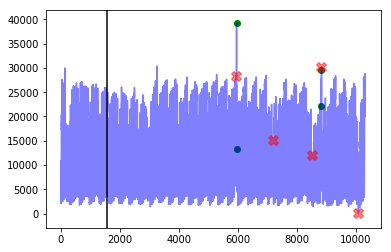




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


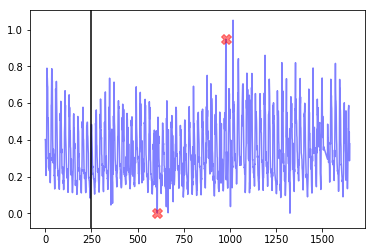




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194, 1195]


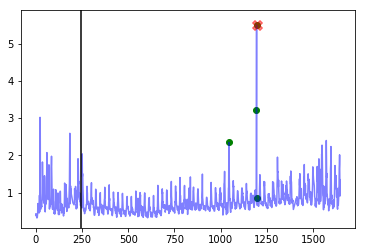




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4286, 4963, 4964, 4965, 4986, 4988, 5662, 6137, 6505, 6506, 6507]


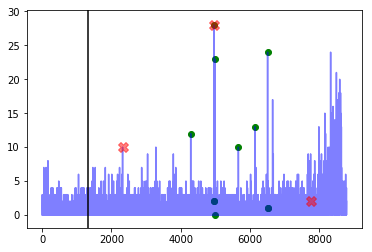




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


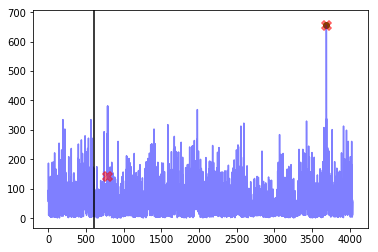




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [672, 1301, 4118]


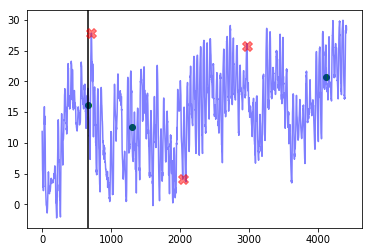




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


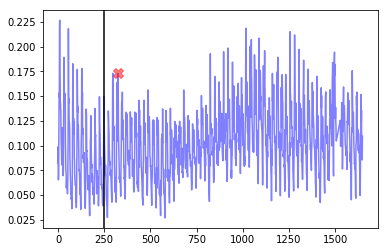




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 324, 466, 1041]


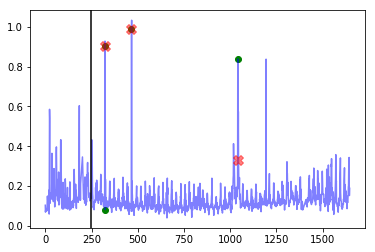




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100, 101]


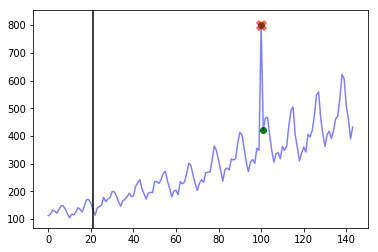




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [2518]


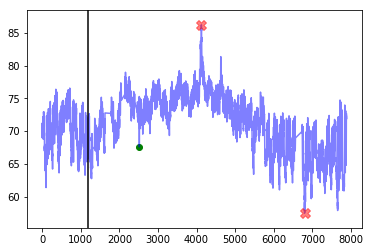

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  14.8
Best window threshold:  1.0
Corresponding window overall precision:  0.5555555555555556
Corresponding window overall recall:  0.43478260869565216
Corresponding window overall F score:  0.4878048780487805



--- nyc_taxi ---
Corresponding window precision:  1.0
Corresponding window recall:  0.4
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [5954, 5956, 8832, 8833]


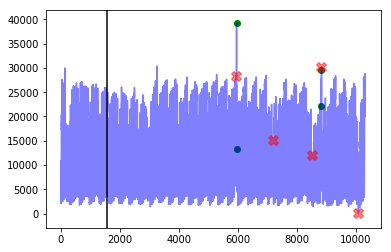




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


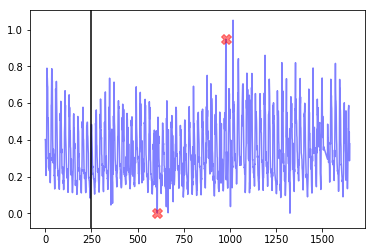




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194, 1195]


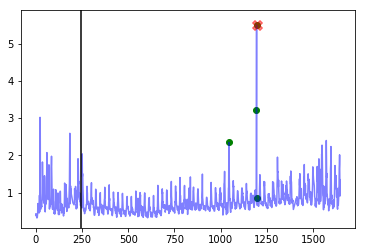




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4286, 4963, 4964, 4965, 4986, 4988, 5662, 6137, 6505, 6506, 6507]


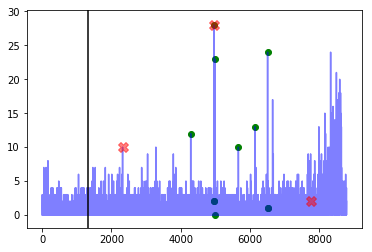




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


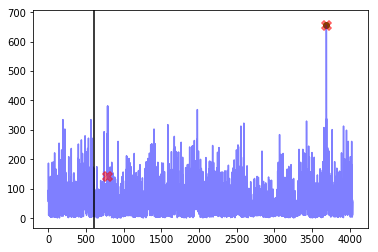




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [672, 1301, 4118]


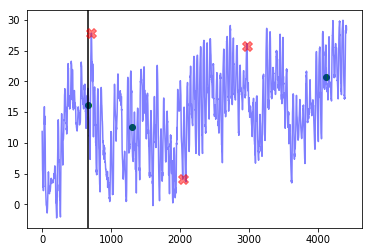




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


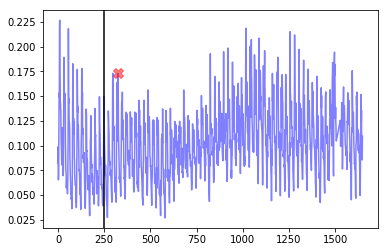




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 324, 466, 1041]


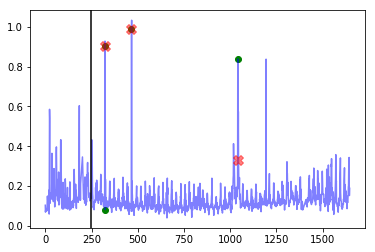




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100, 101]


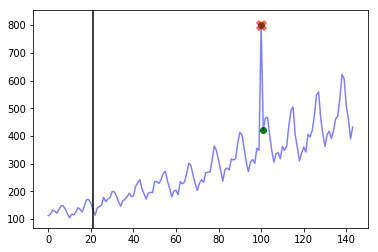




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [2518]


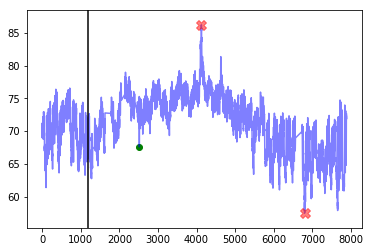

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  15.7
Best window threshold:  1.0
Corresponding window overall precision:  0.5555555555555556
Corresponding window overall recall:  0.43478260869565216
Corresponding window overall F score:  0.4878048780487805



--- nyc_taxi ---
Corresponding window precision:  1.0
Corresponding window recall:  0.4
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [5954, 5956, 8832, 8833]


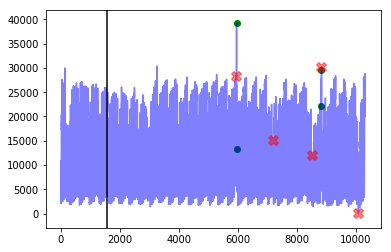




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


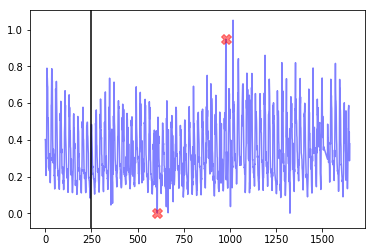




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194, 1195]


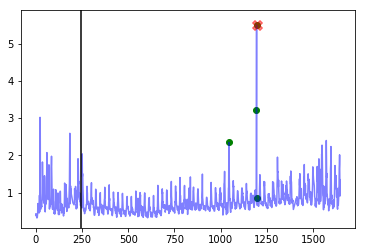




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4286, 4963, 4964, 4965, 4986, 4988, 5662, 6137, 6505, 6506, 6507]


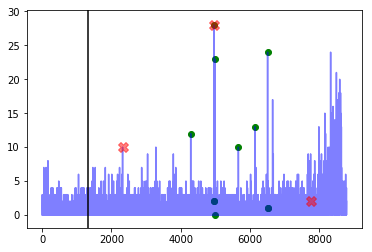




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


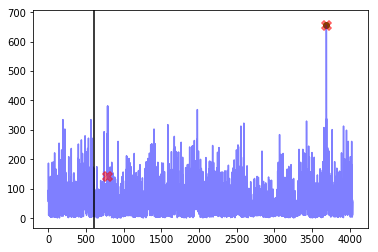




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [672, 1301, 4118]


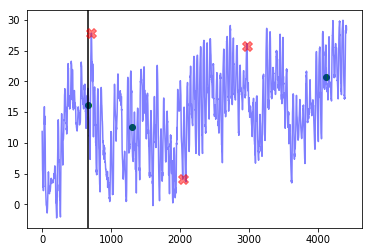




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


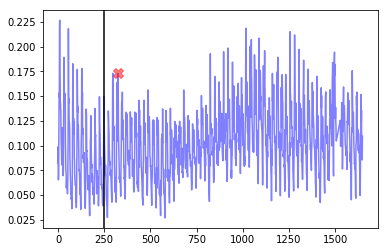




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 324, 466, 1041]


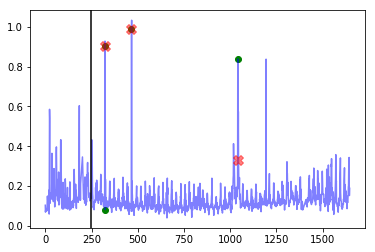




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100, 101]


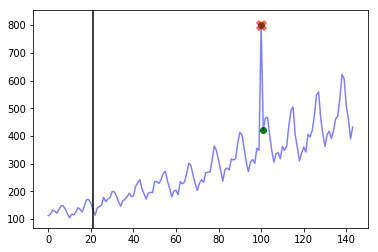




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [2518]


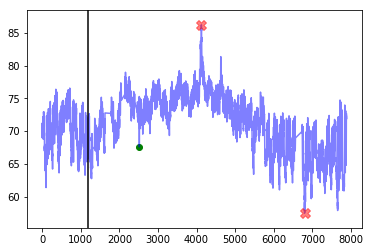

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  16.599999999999998
Best window threshold:  1.0
Corresponding window overall precision:  0.5555555555555556
Corresponding window overall recall:  0.43478260869565216
Corresponding window overall F score:  0.4878048780487805



--- nyc_taxi ---
Corresponding window precision:  1.0
Corresponding window recall:  0.4
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [5954, 5956, 8832, 8833]


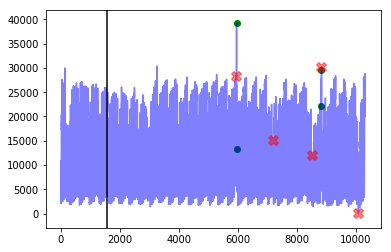




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


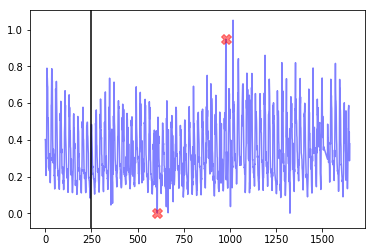




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194, 1195]


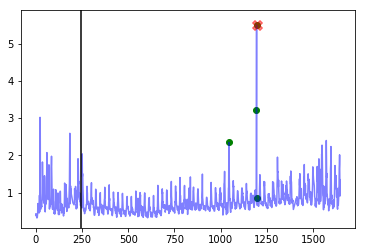




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4286, 4963, 4964, 4965, 4986, 4988, 5662, 6137, 6505, 6506, 6507]


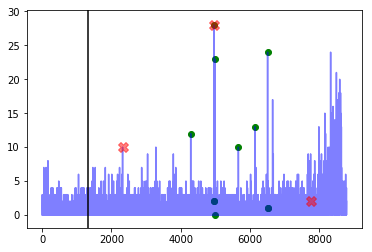




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


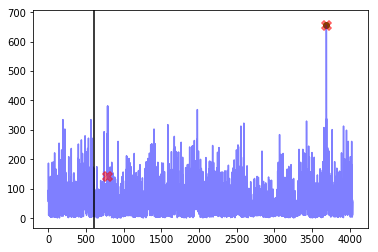




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [672, 1301, 4118]


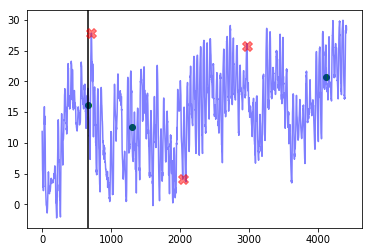




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


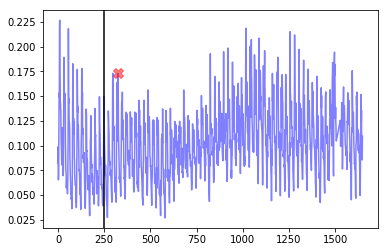




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 324, 466, 1041]


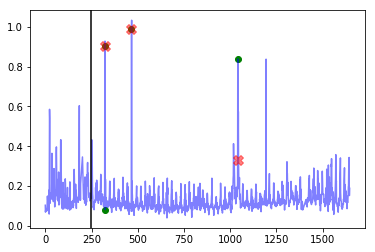




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100, 101]


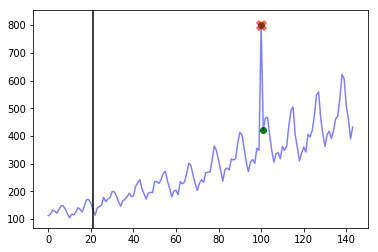




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [2518]


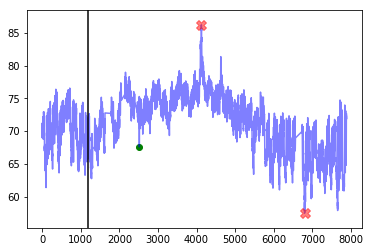

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  17.5
Best window threshold:  1.0
Corresponding window overall precision:  0.5555555555555556
Corresponding window overall recall:  0.43478260869565216
Corresponding window overall F score:  0.4878048780487805



--- nyc_taxi ---
Corresponding window precision:  1.0
Corresponding window recall:  0.4
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [5954, 5956, 8832, 8833]


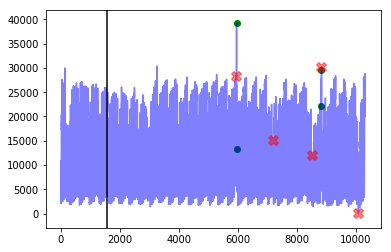




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


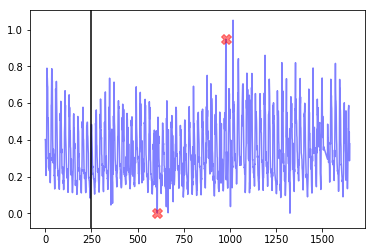




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194, 1195]


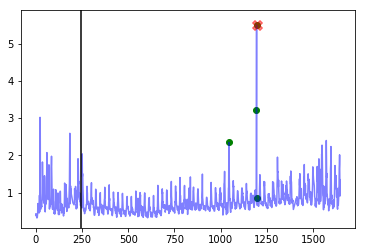




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4286, 4963, 4964, 4965, 4986, 4988, 5662, 6137, 6505, 6506, 6507]


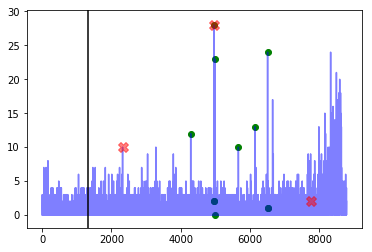




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


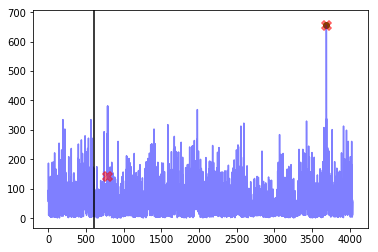




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [672, 1301, 4118]


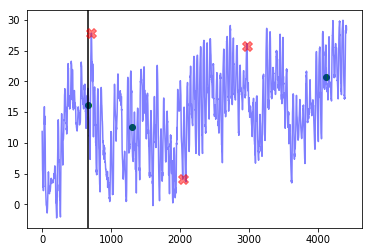




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


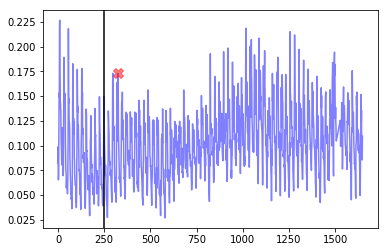




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 324, 466, 1041]


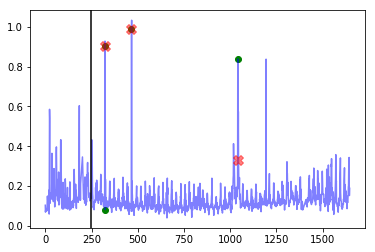




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100, 101]


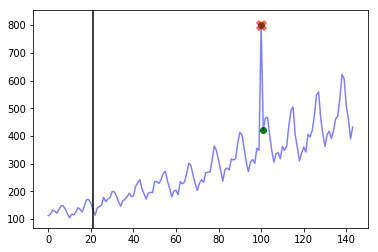




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [2518]


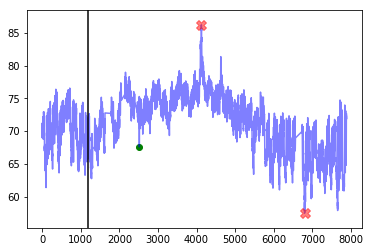

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  18.400000000000002
Best window threshold:  1.0
Corresponding window overall precision:  0.5555555555555556
Corresponding window overall recall:  0.43478260869565216
Corresponding window overall F score:  0.4878048780487805



--- nyc_taxi ---
Corresponding window precision:  1.0
Corresponding window recall:  0.4
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [5954, 5956, 8832, 8833]


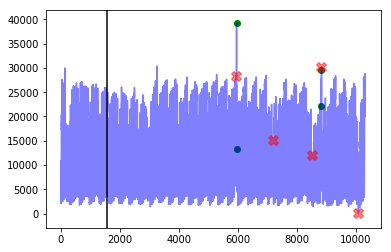




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


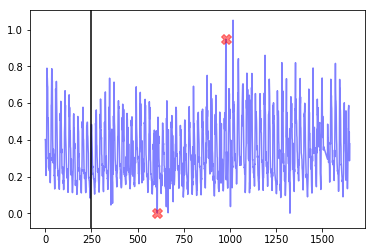




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194, 1195]


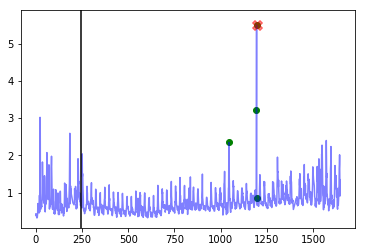




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4286, 4963, 4964, 4965, 4986, 4988, 5662, 6137, 6505, 6506, 6507]


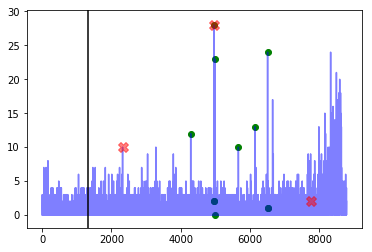




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


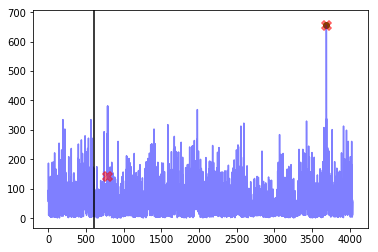




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [672, 1301, 4118]


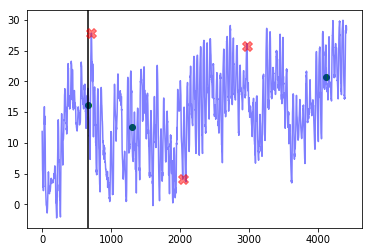




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


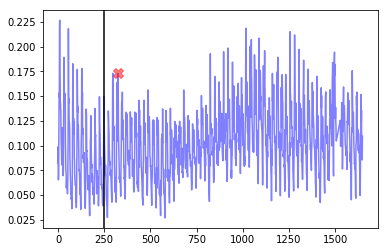




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 324, 466, 1041]


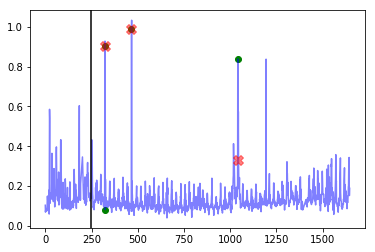




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100, 101]


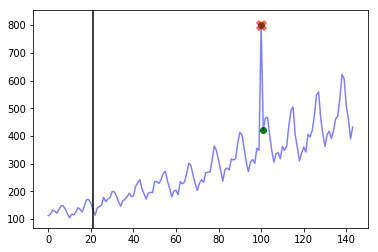




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [2518]


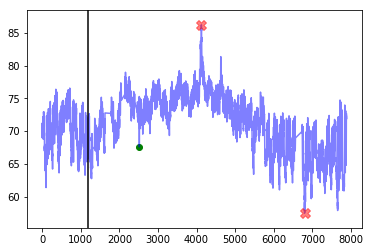

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.3
Best window threshold:  1.0
Corresponding window overall precision:  0.5555555555555556
Corresponding window overall recall:  0.43478260869565216
Corresponding window overall F score:  0.4878048780487805



--- nyc_taxi ---
Corresponding window precision:  1.0
Corresponding window recall:  0.4
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [5954, 5956, 8832, 8833]


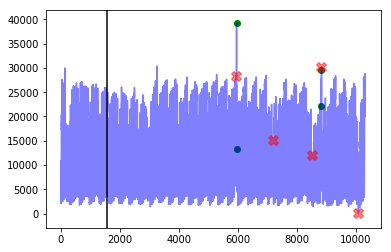




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


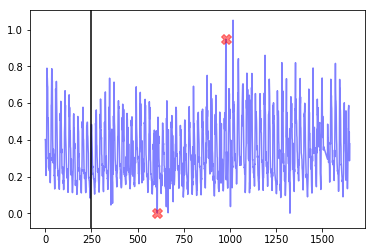




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194, 1195]


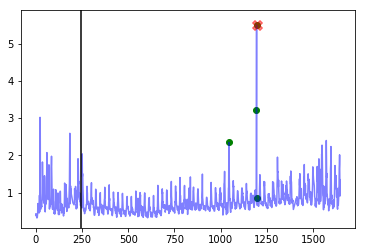




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4286, 4963, 4964, 4965, 4986, 4988, 5662, 6137, 6505, 6506, 6507]


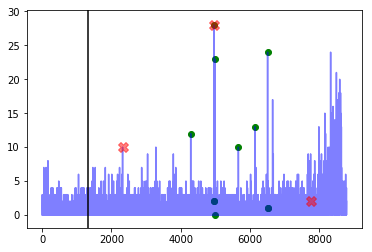




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


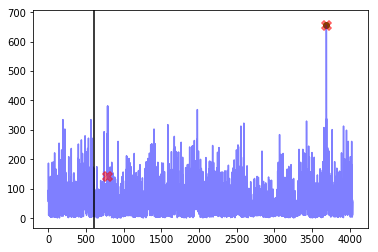




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [672, 1301, 4118]


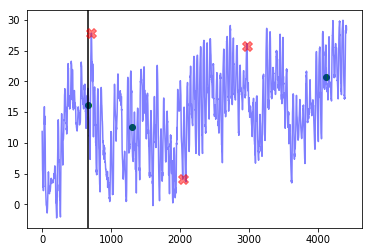




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


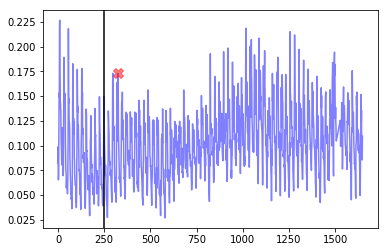




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 324, 466, 1041]


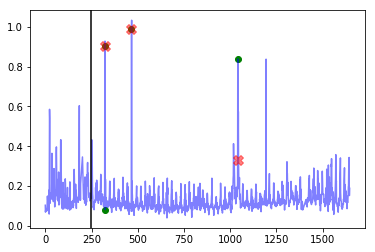




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100, 101]


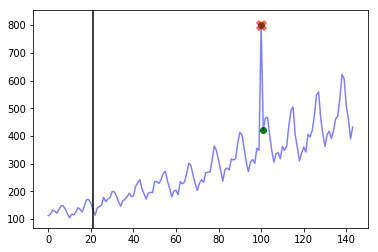




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [2518]


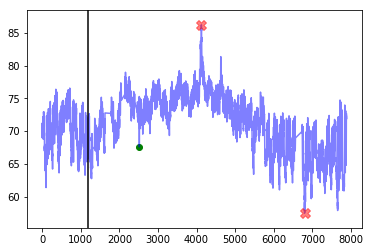

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.200000000000003
Best window threshold:  1.0
Corresponding window overall precision:  0.5555555555555556
Corresponding window overall recall:  0.43478260869565216
Corresponding window overall F score:  0.4878048780487805



--- nyc_taxi ---
Corresponding window precision:  1.0
Corresponding window recall:  0.4
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [5954, 5956, 8832, 8833]


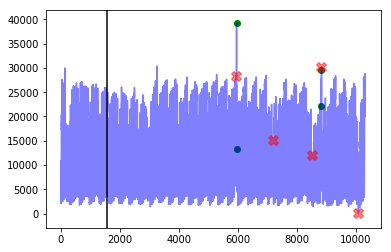




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


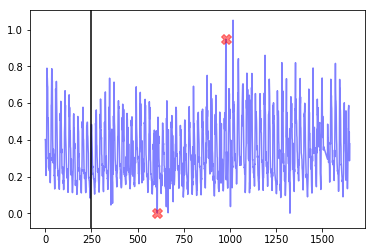




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194, 1195]


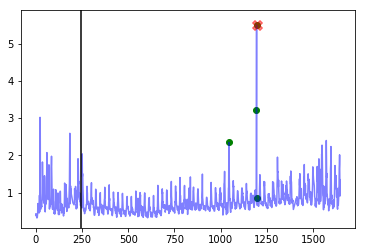




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4286, 4963, 4964, 4965, 4986, 4988, 5662, 6137, 6505, 6506, 6507]


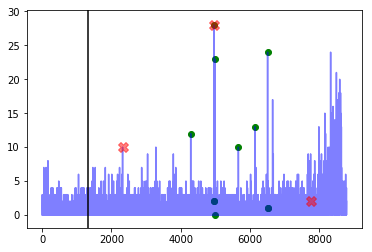




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


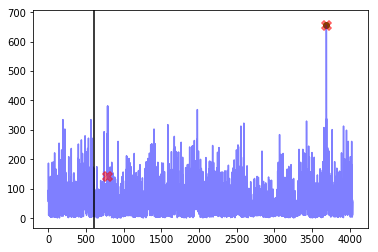




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [672, 1301, 4118]


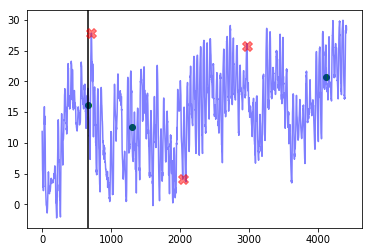




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


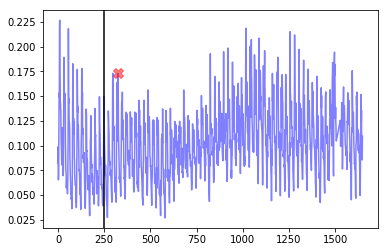




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 324, 466, 1041]


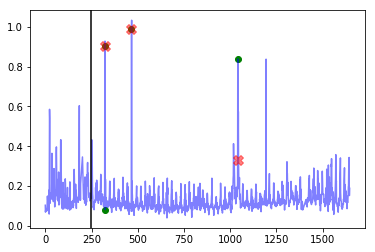




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100, 101]


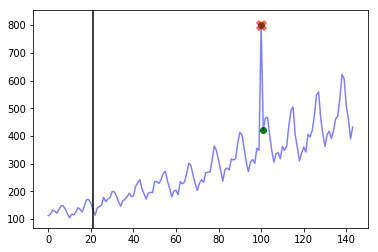




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [2518]


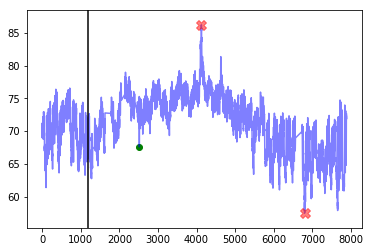

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.099999999999998
Best window threshold:  1.0
Corresponding window overall precision:  0.5555555555555556
Corresponding window overall recall:  0.43478260869565216
Corresponding window overall F score:  0.4878048780487805



--- nyc_taxi ---
Corresponding window precision:  1.0
Corresponding window recall:  0.4
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [5954, 5956, 8832, 8833]


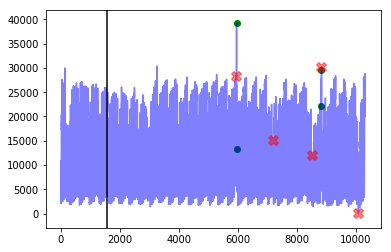




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


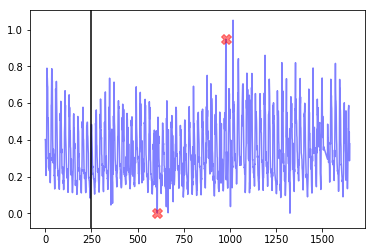




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194, 1195]


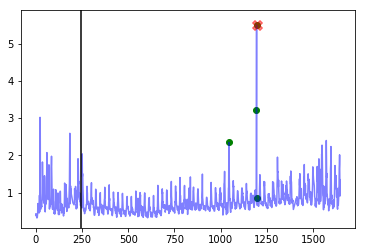




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4286, 4963, 4964, 4965, 4986, 4988, 5662, 6137, 6505, 6506, 6507]


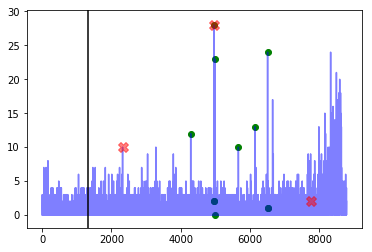




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


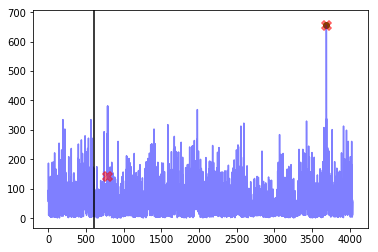




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [672, 1301, 4118]


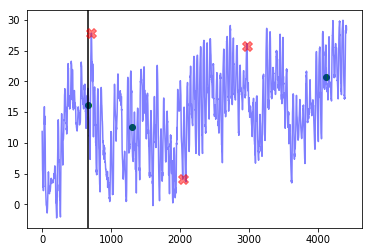




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


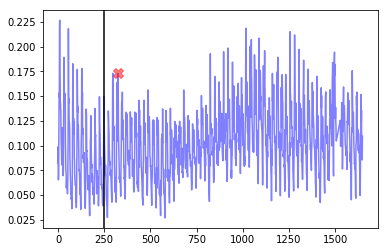




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 324, 466, 1041]


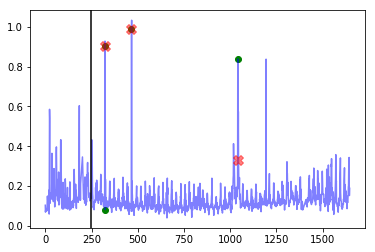




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100, 101]


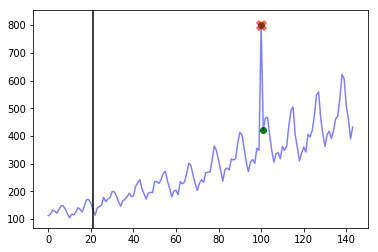




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [2518]


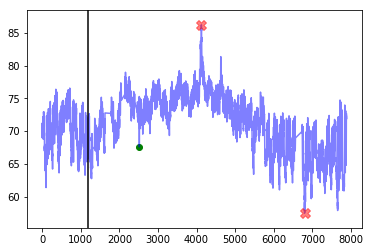

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  22.0
Best window threshold:  1.0
Corresponding window overall precision:  0.5555555555555556
Corresponding window overall recall:  0.43478260869565216
Corresponding window overall F score:  0.4878048780487805



--- nyc_taxi ---
Corresponding window precision:  1.0
Corresponding window recall:  0.4
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [5954, 5956, 8832, 8833]


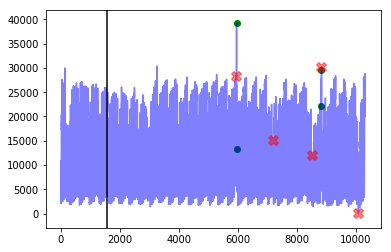




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


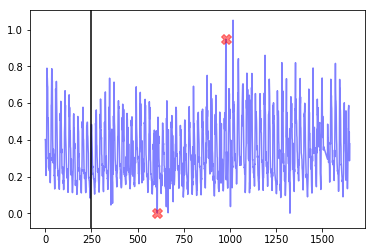




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194, 1195]


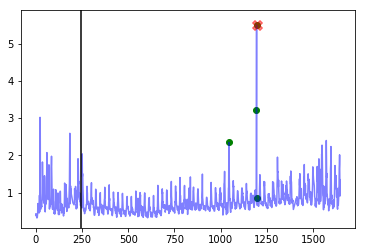




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4286, 4963, 4964, 4965, 4986, 4988, 5662, 6137, 6505, 6506, 6507]


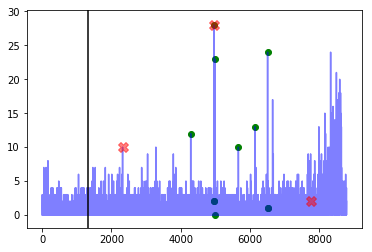




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


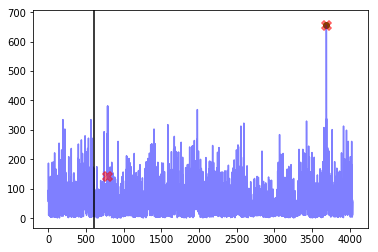




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  2
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [672, 1301, 4118]


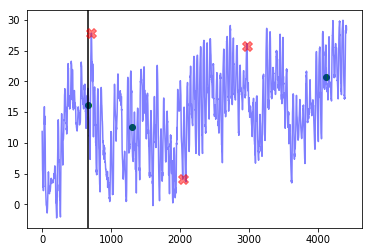




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


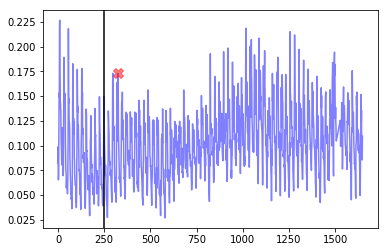




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 324, 466, 1041]


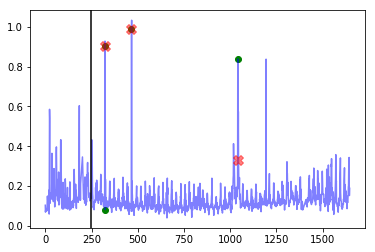




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100, 101]


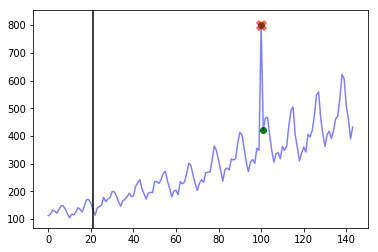




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [2518]


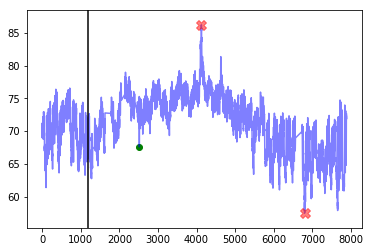

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 13.9
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.5555555555555556
	 Corresponding window overall recall : 0.43478260869565216
	 Corresponding window overall F score : 0.4878048780487805
False Positive Weight:  0.2
	 Minimum number of mistakes : 14.8
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.5555555555555556
	 Corresponding window overall recall : 0.43478260869565216
	 Corresponding window overall F score : 0.4878048780487805
False Positive Weight:  0.3
	 Minimum number of mistakes : 15.7
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.5555555555555556
	 Corresponding window overall recall : 0.43478260869565216
	 Corresponding window overall F score : 0.4878048780487805
False Positive Weight:  0.4
	 Minimum number of mistakes : 16.599999999999998
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.555555

In [18]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(sarima_ad_dict, anomaly_scores_dict, sarima_true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# Facebook Prophet Results

In [19]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_prophet = joblib.load("anomaly_scores" + window_size + "/Prophet/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_prophet["Anomaly Scores"]

In [20]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.2: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.3: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.4: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.5: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.6: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.7: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.8: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.9: {'precision': 0.1111111111111111, 'recall': 1.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  10.900000000000002
Best window threshold:  0.9999
Corresponding window overall precision:  0.1652892561983471
Corresponding window overall recall:  0.8695652173913043
Corresponding window overall F score:  0.2777777777777778



--- nyc_taxi ---
Corresponding window precision:  0.2
Corresponding window recall:  0.6
Corresponding window false positives:  12
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1584, 1585, 1586, 1587, 1588, 1589, 1590, 1591, 1592, 1924, 1925, 1926, 1927, 2595, 2596, 2597, 2598, 2599, 2600, 2896, 3600, 3601, 3602, 3603, 3604, 3605, 3606, 4226, 4271, 4272, 4273, 4274, 4275, 4276, 4277, 4278, 4279, 4613, 5280, 5281, 5282, 5283, 5284, 5285, 5286, 5617, 5618, 5619, 5620, 5621, 5906, 5907, 5908, 5909, 5910, 5911, 5912, 5954, 5955, 6288, 6289, 6290, 6291, 6292, 6293, 6294, 6295, 6623, 6624, 6625, 6626, 6627, 830

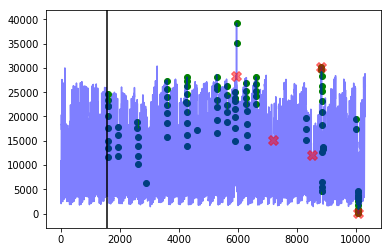




--- exchange-2_cpm_results ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  1.0
Corresponding window false positives:  7
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [360, 365, 424, 601, 664, 899, 976, 977, 978, 1016, 1280, 1522, 1523, 1524]


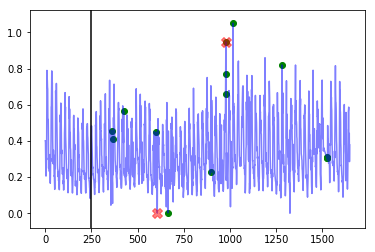




--- exchange-3_cpm_results ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [479, 480, 503, 504, 527, 599, 600, 623, 624, 836, 887, 911, 1031, 1044, 1079, 1103, 1104, 1193, 1194, 1405]


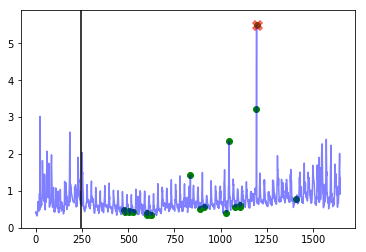




--- all_data_gift_certificates ---
Corresponding window precision:  0.125
Corresponding window recall:  1.0
Corresponding window false positives:  21
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1438, 1462, 1483, 1487, 1505, 1531, 1820, 1822, 1918, 2009, 2059, 2157, 2176, 2233, 2304, 2320, 2471, 2667, 2871, 2894, 2899, 2905, 3042, 3260, 3281, 3620, 3664, 3688, 3711, 3785, 3790, 3805, 3810, 3855, 4149, 4286, 4317, 4516, 4578, 4946, 4961, 4963, 4986, 4992, 5155, 5250, 5272, 5632, 5637, 5662, 5905, 5924, 6014, 6019, 6137, 6164, 6167, 6353, 6375, 6406, 6471, 6505, 6517, 6522, 6650, 6836, 6954, 6960, 6978, 7100, 7169, 7366, 7396, 7655, 7656, 7677, 7679, 7680, 7696, 7720, 7723, 7746, 7838, 7864, 7985, 7987, 7989, 8009, 8015, 8017, 8157, 8162, 8175, 8177, 8323, 8324, 8326, 8327]


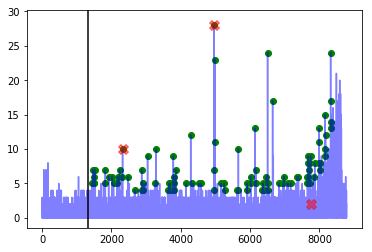




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  10
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [741, 783, 786, 790, 791, 1403, 1916, 1918, 1922, 1923, 1924, 1978, 2186, 2187, 2192, 2193, 2195, 2200, 2201, 2203, 2210, 2213, 2215, 2218, 2219, 2220, 2221, 2222, 2223, 2224, 2227, 2471, 2472, 2474, 2477, 2478, 2481, 2482, 2483, 2485, 2486, 2488, 2490, 2492, 2493, 2494, 2495, 2496, 2498, 2499, 2502, 2503, 2509, 2510, 2511, 2519, 2520, 2522, 2524, 2556, 2595, 2757, 2758, 2759, 2761, 2762, 2764, 2765, 2767, 2768, 2772, 2773, 2774, 2775, 2776, 2777, 2778, 2779, 2780, 2781, 2782, 2784, 2785, 2786, 2787, 2790, 2791, 2792, 2793, 2794, 2796, 2797, 2798, 2799, 2800, 2801, 2802, 2804, 2805, 2806, 2807, 2808, 2810, 2811, 2812, 2814, 2815, 2816, 2819, 3057, 3059, 3060, 3062, 3063, 3064, 3066, 3067, 3068, 3071, 3072, 3073, 3074, 3075, 3

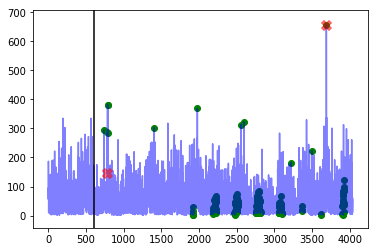




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  9
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 826, 1100, 1101, 1102, 1110, 1111, 1112, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1125, 1126, 1127, 1595, 1596, 1598, 1599, 1600, 1601, 1602, 1603, 1604, 1605, 1606, 1607, 1608, 1609, 1610, 1611, 1612, 1613, 1614, 1890, 1891, 1892, 1893, 1894, 1895, 1896, 1897, 1898, 1899, 1900, 1901, 1902, 1903, 1904, 1905, 1906, 1907, 1908, 1909, 1910, 1911, 1912, 1913, 1914, 1921, 1922, 1923, 1924, 1925, 1926, 1927, 2274, 2275, 2276, 2278, 2279, 2320, 2321, 2322, 2323, 2324, 2325, 2326, 2327, 2612, 2613, 2614, 2615, 3010, 3011, 3012, 3013, 3014, 3015, 3016, 3017, 3018, 3019, 3020, 3250, 3251, 3252, 3253, 3254, 3255, 3256, 3257, 3258, 3259, 3260, 3261, 326

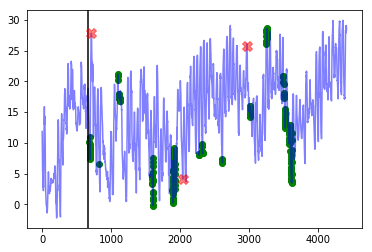




--- exchange-2_cpc_results ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [317, 325, 559, 583, 585, 607, 655, 1210, 1399, 1486, 1487]


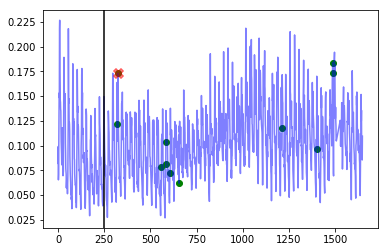




--- exchange-3_cpc_results ---
Corresponding window precision:  0.375
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 819, 836, 1011, 1012, 1014, 1015, 1016, 1017, 1018, 1019, 1020, 1022, 1023, 1024, 1025, 1027, 1041, 1043, 1044, 1193, 1194, 1473, 1498, 1522, 1531]


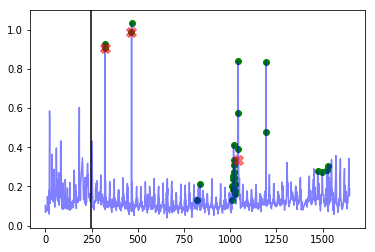




--- international-airline-passengers ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [78, 90, 100, 102, 103, 114, 115, 126, 127, 137, 138, 139]


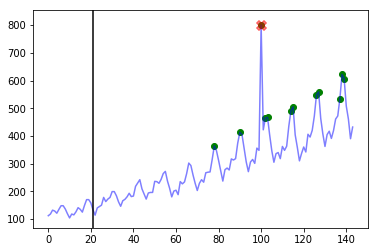




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.14285714285714285
Corresponding window recall:  1.0
Corresponding window false positives:  12
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1424, 1588, 1590, 1756, 1757, 1758, 1759, 1760, 1761, 1762, 1763, 1764, 1765, 1766, 1777, 1778, 1779, 1780, 1781, 1782, 1783, 1784, 1785, 2092, 2093, 2094, 2095, 2096, 2097, 2098, 2099, 2100, 2101, 2102, 2103, 2112, 2113, 2114, 2115, 2116, 2117, 2118, 2119, 2120, 2121, 2122, 2428, 2429, 2430, 2431, 2432, 2433, 2434, 2435, 2436, 2453, 2454, 2455, 2518, 2930, 2932, 2933, 2934, 2935, 2936, 2937, 2949, 2950, 2951, 2952, 2953, 2954, 2955, 2956, 2957, 2958, 3433, 3434, 3435, 3437, 3439, 3440, 3441, 3443, 3444, 3446, 3451, 3453, 3454, 3455, 3456, 3457, 3458, 3459, 3460, 3461, 3462, 3508, 3509, 3510, 3933, 3934, 3935, 3936, 3937, 3938, 3939, 3940, 3941, 3942, 3943, 3944, 3945, 3946, 3947, 3948, 3949, 3950, 3951, 3952, 3953

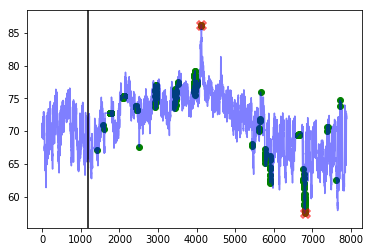

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  16.6
Best window threshold:  1.0
Corresponding window overall precision:  0.4666666666666667
Corresponding window overall recall:  0.30434782608695654
Corresponding window overall F score:  0.3684210526315789



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


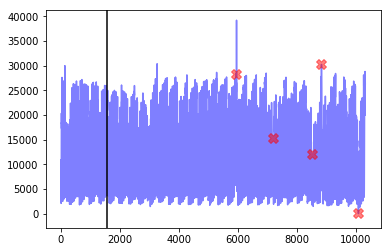




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


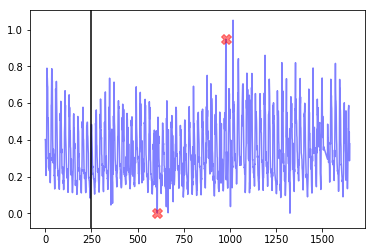




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193, 1194]


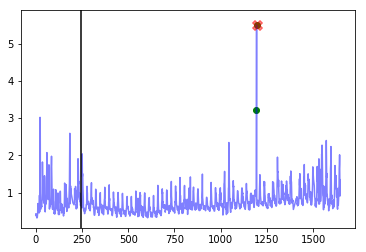




--- all_data_gift_certificates ---
Corresponding window precision:  0.3
Corresponding window recall:  1.0
Corresponding window false positives:  7
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2320, 3281, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 7677, 8324]


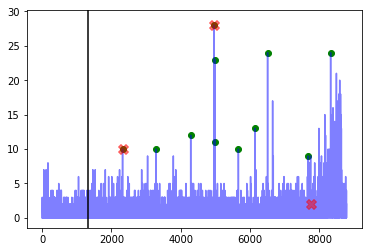




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


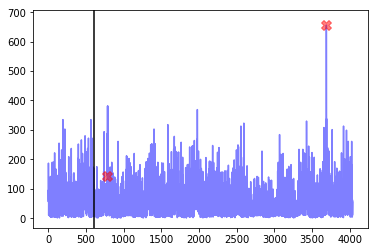




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


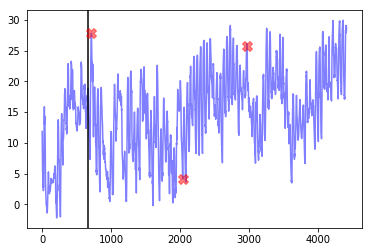




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


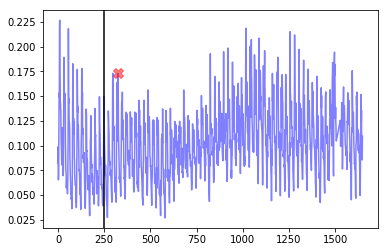




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1194]


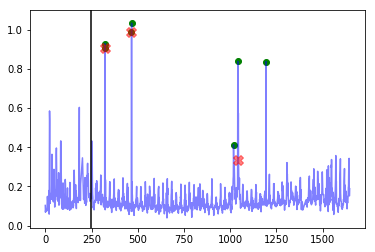




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


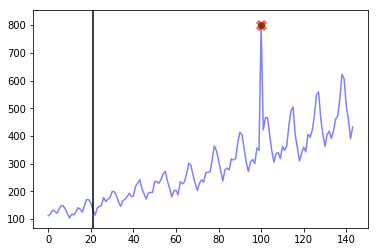




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


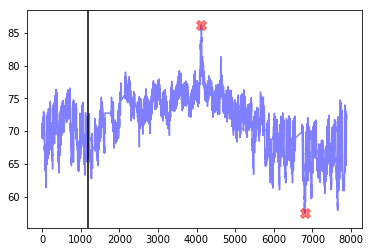

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  17.4
Best window threshold:  1.0
Corresponding window overall precision:  0.4666666666666667
Corresponding window overall recall:  0.30434782608695654
Corresponding window overall F score:  0.3684210526315789



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


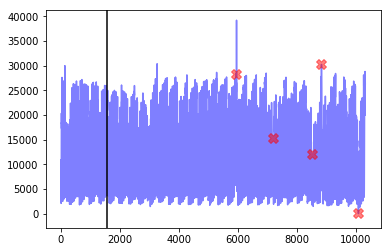




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


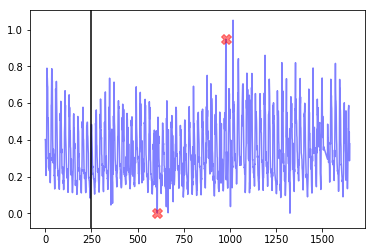




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193, 1194]


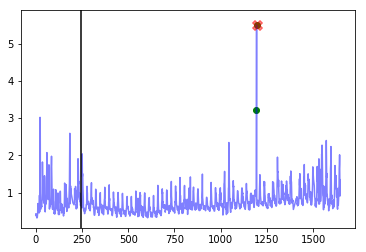




--- all_data_gift_certificates ---
Corresponding window precision:  0.3
Corresponding window recall:  1.0
Corresponding window false positives:  7
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2320, 3281, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 7677, 8324]


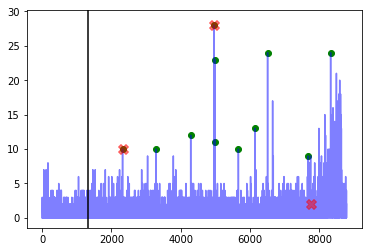




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


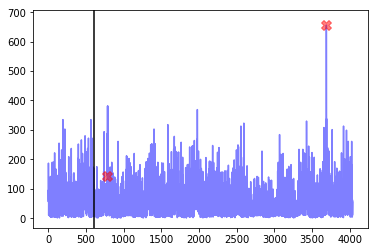




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


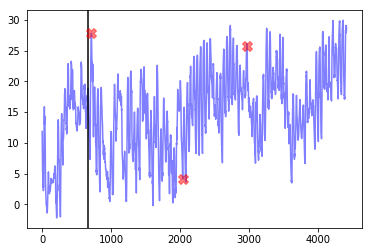




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


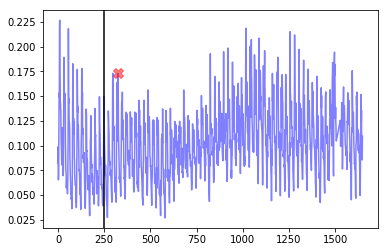




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1194]


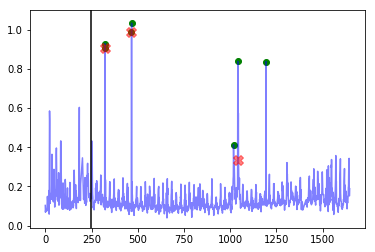




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


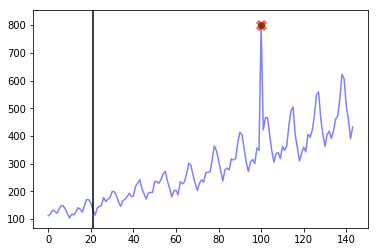




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


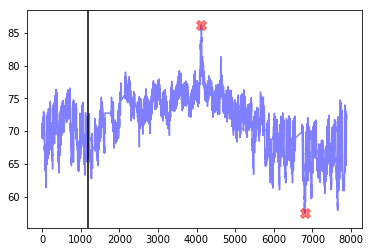

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  18.2
Best window threshold:  1.0
Corresponding window overall precision:  0.4666666666666667
Corresponding window overall recall:  0.30434782608695654
Corresponding window overall F score:  0.3684210526315789



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


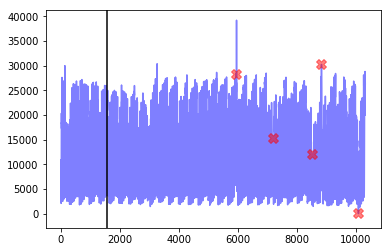




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


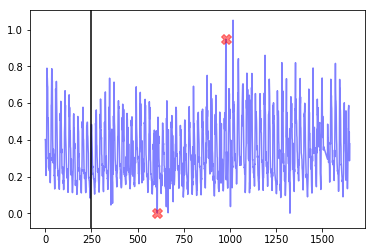




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193, 1194]


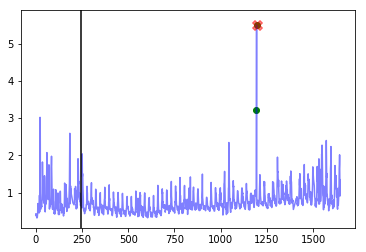




--- all_data_gift_certificates ---
Corresponding window precision:  0.3
Corresponding window recall:  1.0
Corresponding window false positives:  7
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2320, 3281, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 7677, 8324]


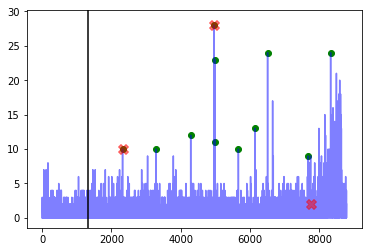




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


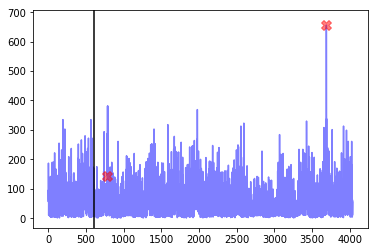




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


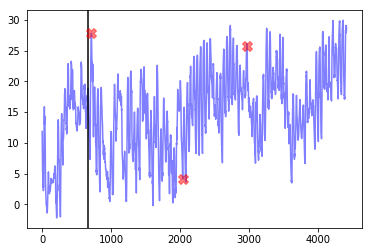




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


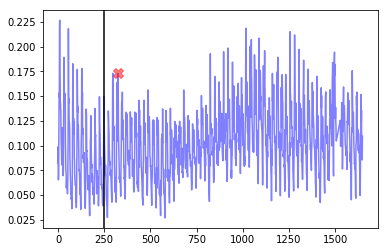




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1194]


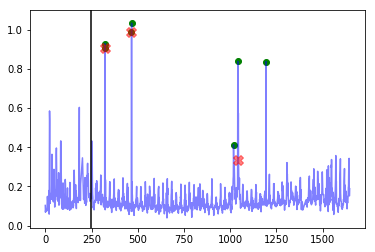




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


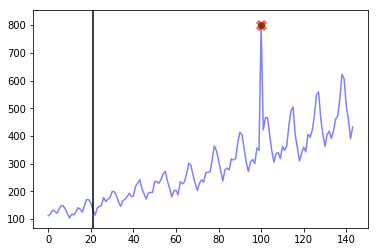




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


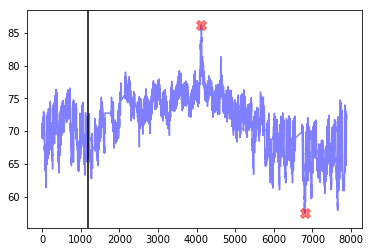

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.0
Best window threshold:  1.0
Corresponding window overall precision:  0.4666666666666667
Corresponding window overall recall:  0.30434782608695654
Corresponding window overall F score:  0.3684210526315789



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


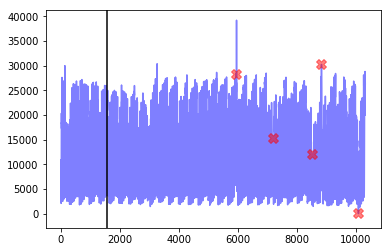




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


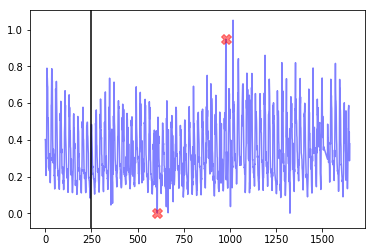




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193, 1194]


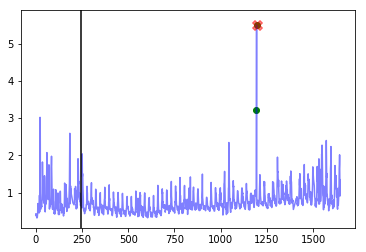




--- all_data_gift_certificates ---
Corresponding window precision:  0.3
Corresponding window recall:  1.0
Corresponding window false positives:  7
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2320, 3281, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 7677, 8324]


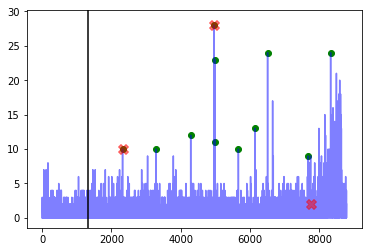




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


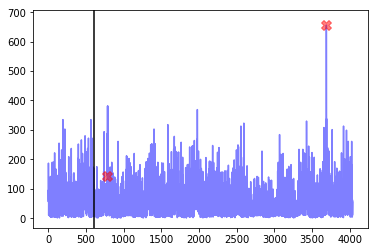




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


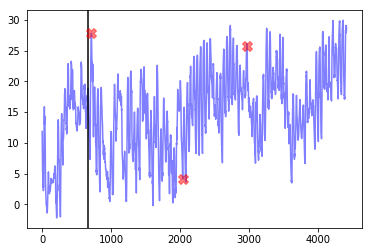




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


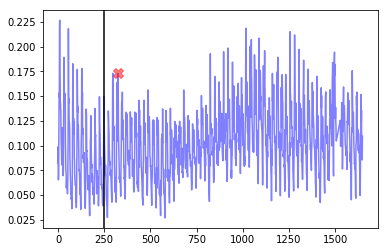




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1194]


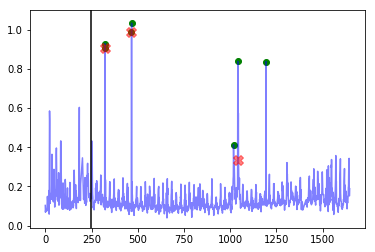




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


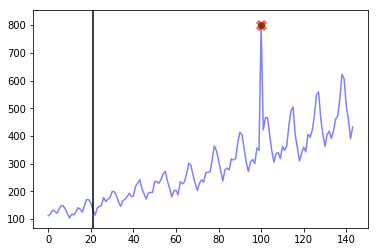




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


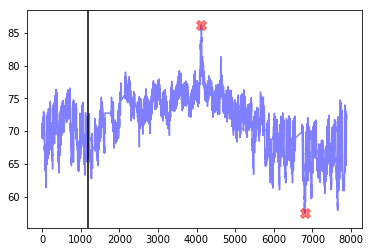

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.8
Best window threshold:  1.0
Corresponding window overall precision:  0.4666666666666667
Corresponding window overall recall:  0.30434782608695654
Corresponding window overall F score:  0.3684210526315789



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


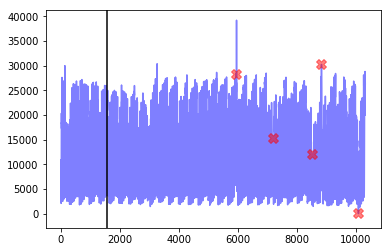




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


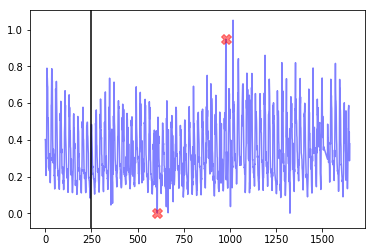




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193, 1194]


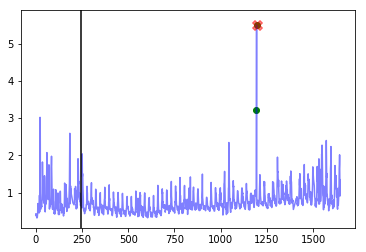




--- all_data_gift_certificates ---
Corresponding window precision:  0.3
Corresponding window recall:  1.0
Corresponding window false positives:  7
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2320, 3281, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 7677, 8324]


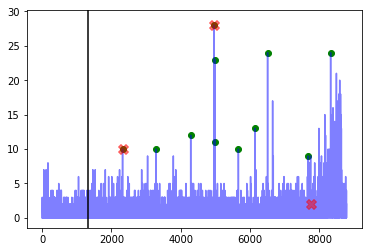




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


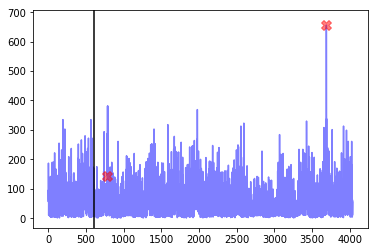




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


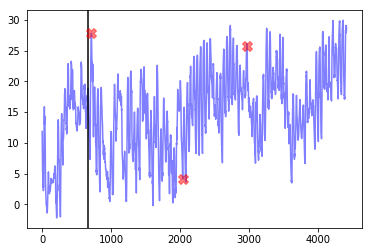




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


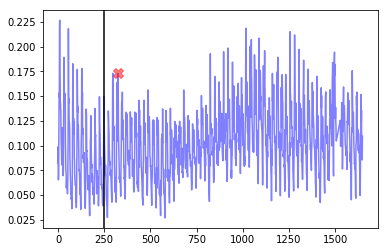




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1194]


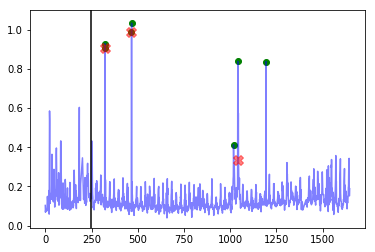




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


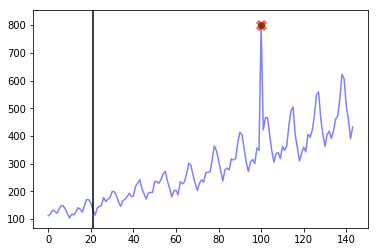




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


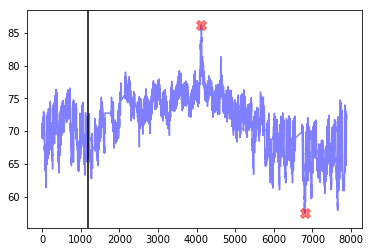

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.599999999999998
Best window threshold:  1.0
Corresponding window overall precision:  0.4666666666666667
Corresponding window overall recall:  0.30434782608695654
Corresponding window overall F score:  0.3684210526315789



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


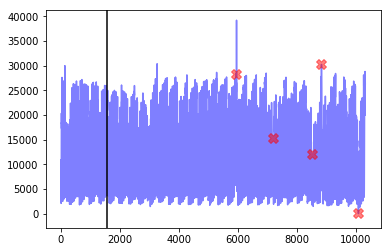




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


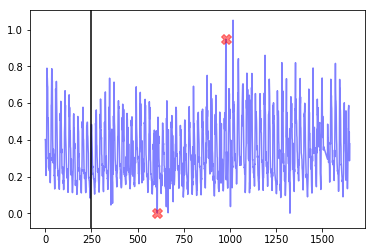




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193, 1194]


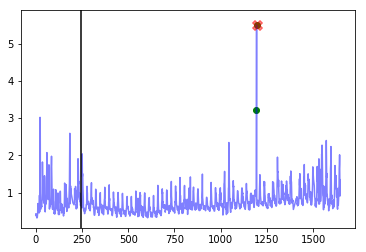




--- all_data_gift_certificates ---
Corresponding window precision:  0.3
Corresponding window recall:  1.0
Corresponding window false positives:  7
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2320, 3281, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 7677, 8324]


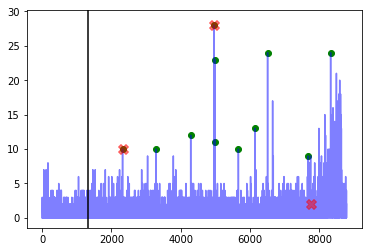




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


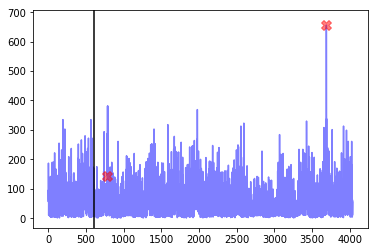




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


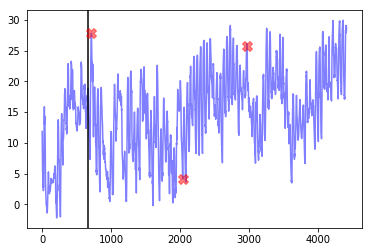




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


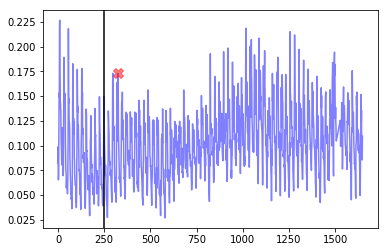




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1194]


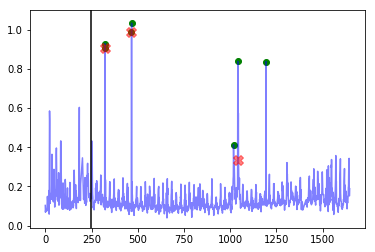




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


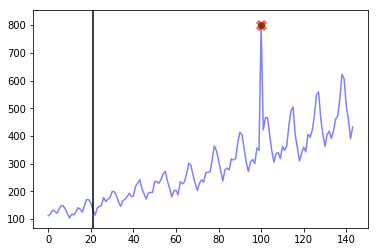




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


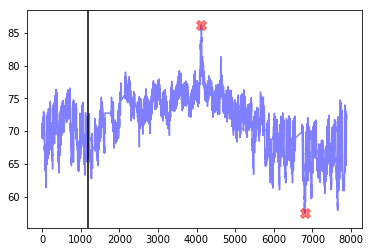

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.400000000000002
Best window threshold:  1.0
Corresponding window overall precision:  0.4666666666666667
Corresponding window overall recall:  0.30434782608695654
Corresponding window overall F score:  0.3684210526315789



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


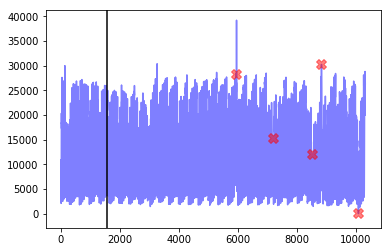




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


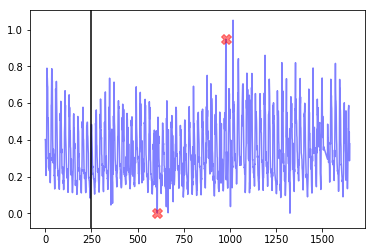




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193, 1194]


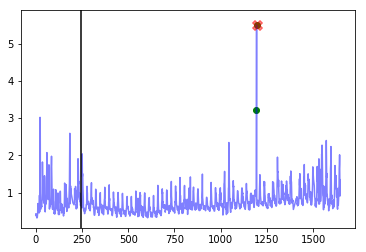




--- all_data_gift_certificates ---
Corresponding window precision:  0.3
Corresponding window recall:  1.0
Corresponding window false positives:  7
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2320, 3281, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 7677, 8324]


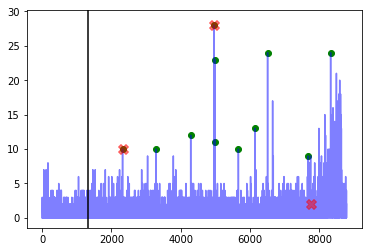




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


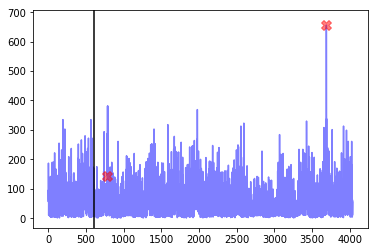




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


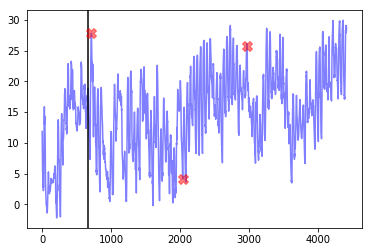




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


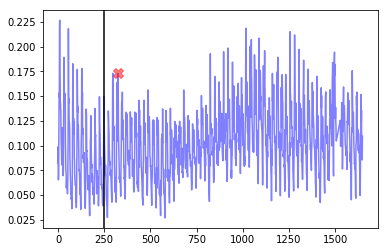




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1194]


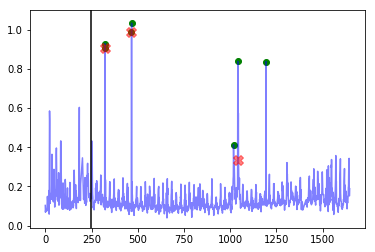




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


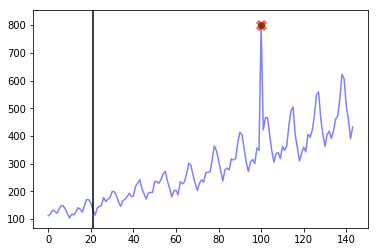




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


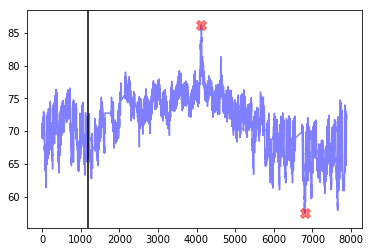

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  22.2
Best window threshold:  1.0
Corresponding window overall precision:  0.4666666666666667
Corresponding window overall recall:  0.30434782608695654
Corresponding window overall F score:  0.3684210526315789



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


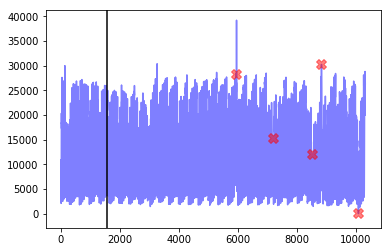




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


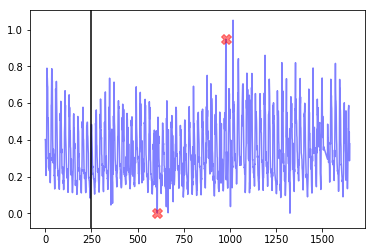




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193, 1194]


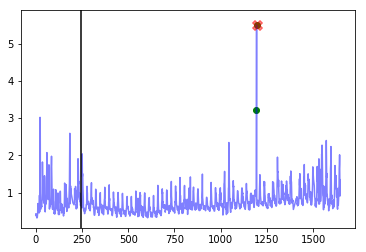




--- all_data_gift_certificates ---
Corresponding window precision:  0.3
Corresponding window recall:  1.0
Corresponding window false positives:  7
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2320, 3281, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 7677, 8324]


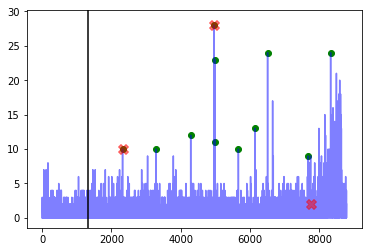




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


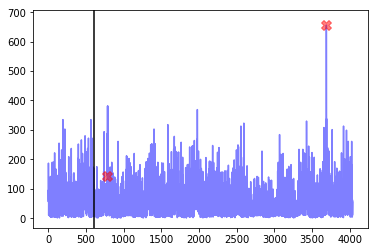




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


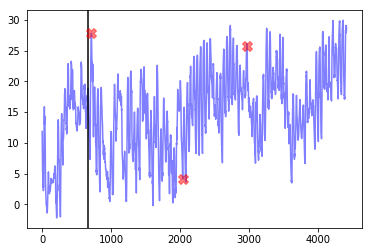




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


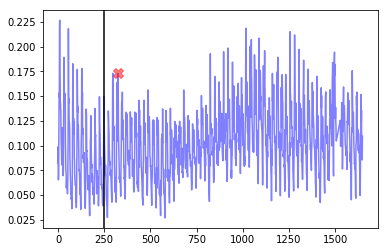




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1194]


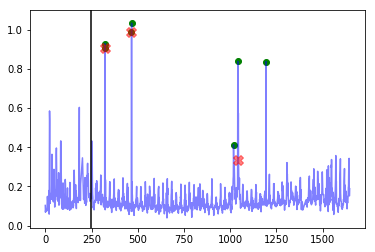




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


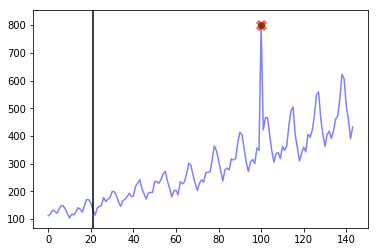




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


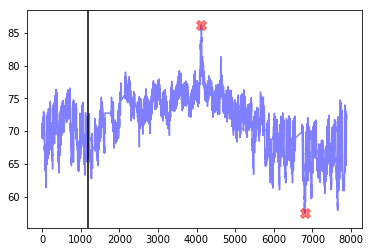

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  23.0
Best window threshold:  1.0
Corresponding window overall precision:  0.4666666666666667
Corresponding window overall recall:  0.30434782608695654
Corresponding window overall F score:  0.3684210526315789



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


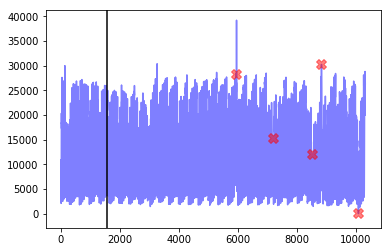




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


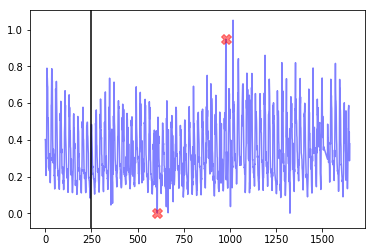




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193, 1194]


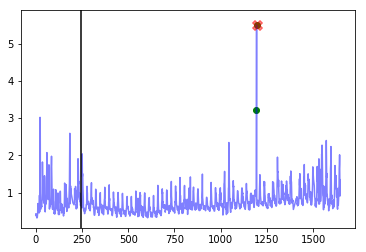




--- all_data_gift_certificates ---
Corresponding window precision:  0.3
Corresponding window recall:  1.0
Corresponding window false positives:  7
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2320, 3281, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 7677, 8324]


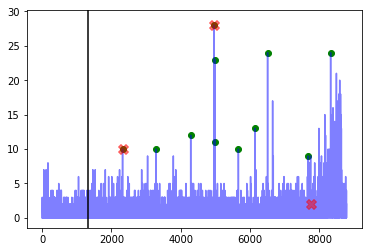




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


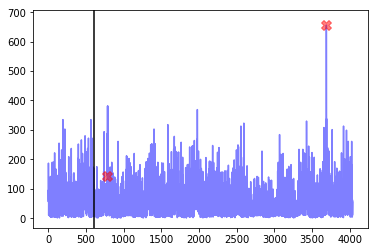




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


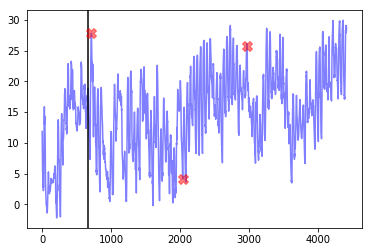




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


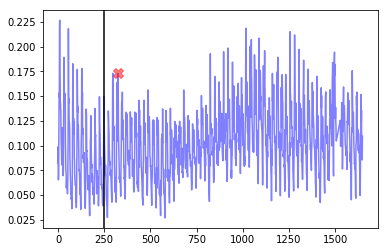




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 1018, 1041, 1194]


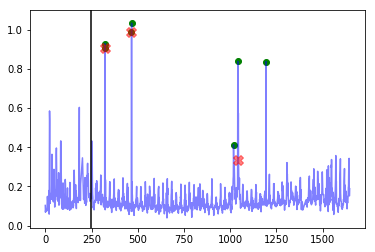




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


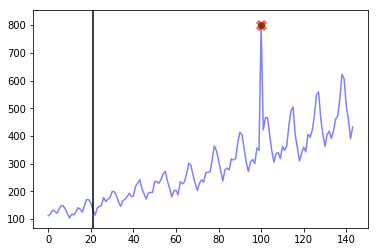




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


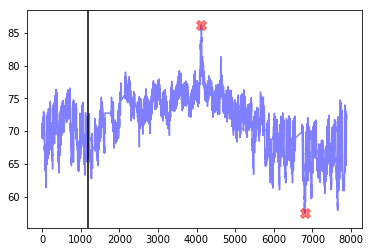

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 10.900000000000002
	 Best window threshold : 0.9999
	 Corresponding window overall precision : 0.1652892561983471
	 Corresponding window overall recall : 0.8695652173913043
	 Corresponding window overall F score : 0.2777777777777778
False Positive Weight:  0.2
	 Minimum number of mistakes : 16.6
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.4666666666666667
	 Corresponding window overall recall : 0.30434782608695654
	 Corresponding window overall F score : 0.3684210526315789
False Positive Weight:  0.3
	 Minimum number of mistakes : 17.4
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.4666666666666667
	 Corresponding window overall recall : 0.30434782608695654
	 Corresponding window overall F score : 0.3684210526315789
False Positive Weight:  0.4
	 Minimum number of mistakes : 18.2
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.4666

In [21]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# Twitter AD Results

In [15]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_twitter = joblib.load("anomaly_scores" + window_size + "/Twitter/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_twitter["Anomaly Scores"]

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  13.9
Best window threshold:  0.0001
Corresponding window overall precision:  0.5555555555555556
Corresponding window overall recall:  0.43478260869565216
Corresponding window overall F score:  0.4878048780487805



--- nyc_taxi ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [5909, 5955, 5956, 8834, 8835, 8836, 8837, 8838, 8839, 10071, 10072, 10073, 10074, 10075, 10076, 10077, 10078, 10079, 10097, 10098]


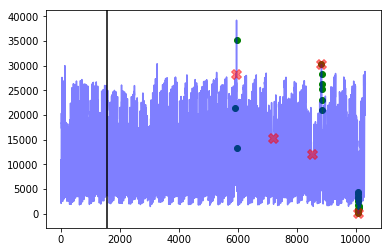




--- exchange-2_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [978, 1017, 1105]


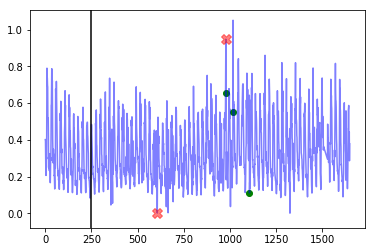




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194, 1195]


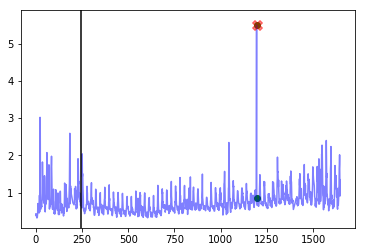




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4964, 4987, 6506, 6651, 8158, 8324, 8325, 8394, 8491, 8492, 8513, 8539, 8564, 8565, 8587, 8611, 8615]


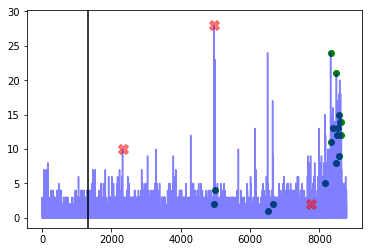




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [787, 792, 1587, 2596, 3691, 3694]


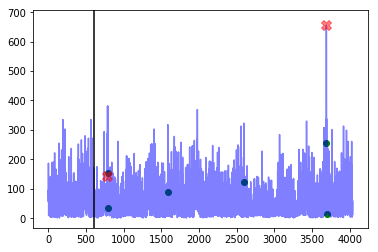




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


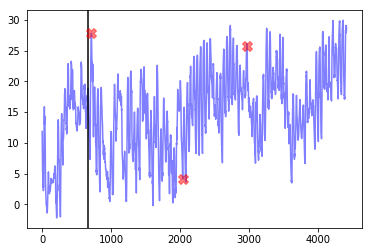




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


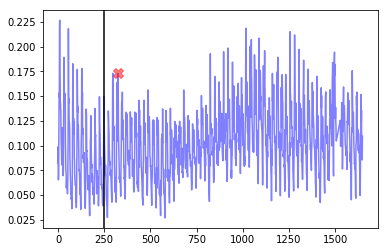




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [324, 467, 468]


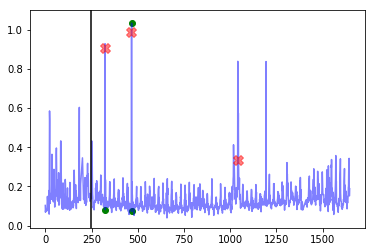




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


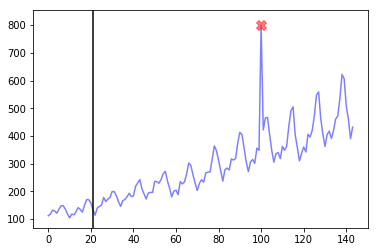




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


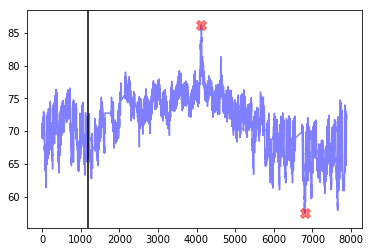

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  14.8
Best window threshold:  0.0001
Corresponding window overall precision:  0.5555555555555556
Corresponding window overall recall:  0.43478260869565216
Corresponding window overall F score:  0.4878048780487805



--- nyc_taxi ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [5909, 5955, 5956, 8834, 8835, 8836, 8837, 8838, 8839, 10071, 10072, 10073, 10074, 10075, 10076, 10077, 10078, 10079, 10097, 10098]


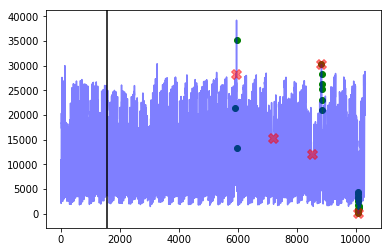




--- exchange-2_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [978, 1017, 1105]


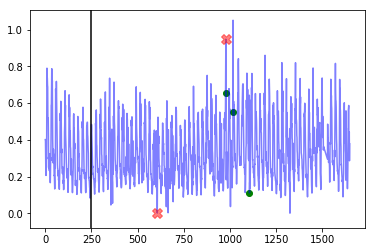




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194, 1195]


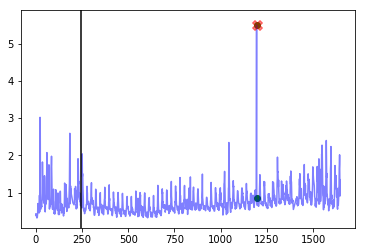




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4964, 4987, 6506, 6651, 8158, 8324, 8325, 8394, 8491, 8492, 8513, 8539, 8564, 8565, 8587, 8611, 8615]


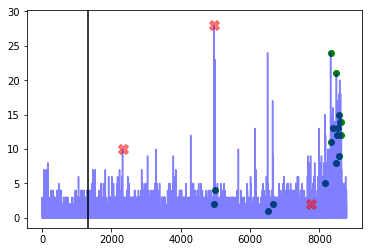




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [787, 792, 1587, 2596, 3691, 3694]


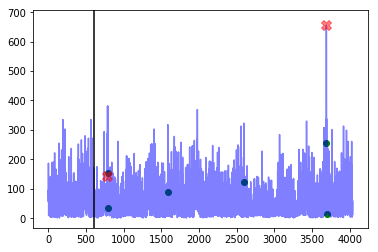




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


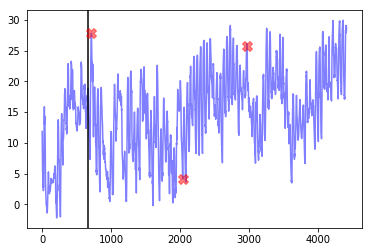




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


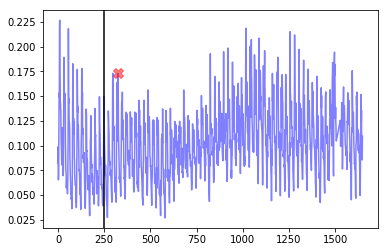




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [324, 467, 468]


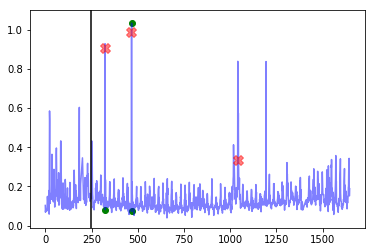




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


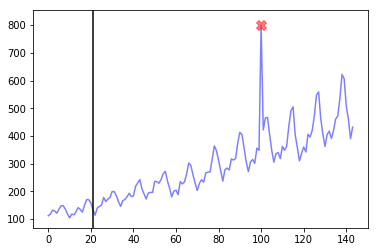




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


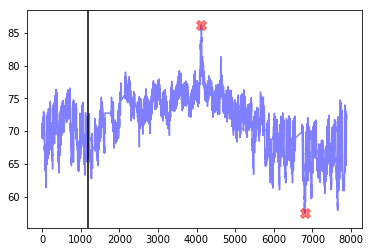

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  15.7
Best window threshold:  0.0001
Corresponding window overall precision:  0.5555555555555556
Corresponding window overall recall:  0.43478260869565216
Corresponding window overall F score:  0.4878048780487805



--- nyc_taxi ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [5909, 5955, 5956, 8834, 8835, 8836, 8837, 8838, 8839, 10071, 10072, 10073, 10074, 10075, 10076, 10077, 10078, 10079, 10097, 10098]


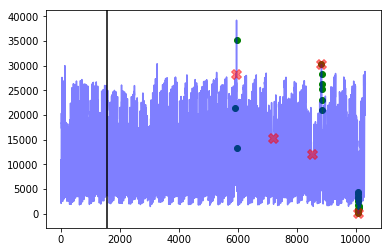




--- exchange-2_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [978, 1017, 1105]


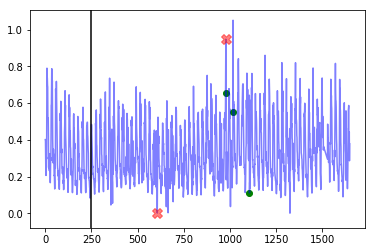




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194, 1195]


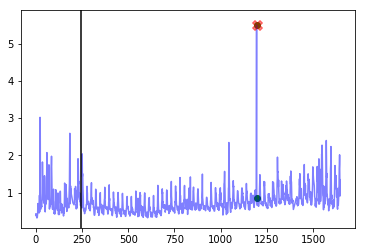




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4964, 4987, 6506, 6651, 8158, 8324, 8325, 8394, 8491, 8492, 8513, 8539, 8564, 8565, 8587, 8611, 8615]


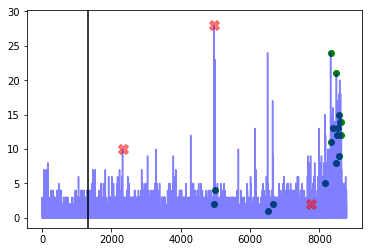




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [787, 792, 1587, 2596, 3691, 3694]


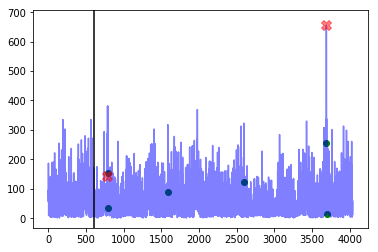




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


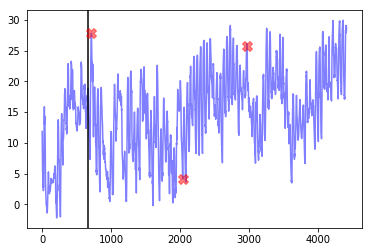




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


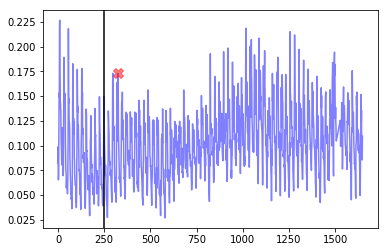




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [324, 467, 468]


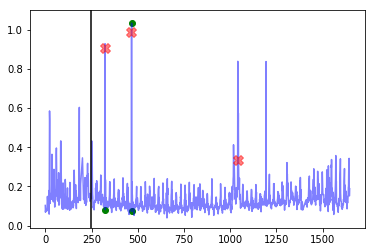




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


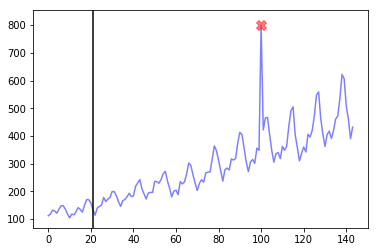




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


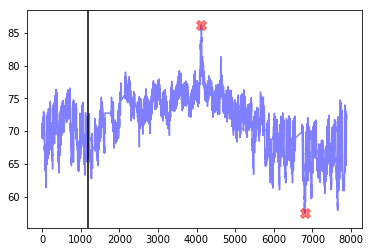

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  16.6
Best window threshold:  0.0001
Corresponding window overall precision:  0.5555555555555556
Corresponding window overall recall:  0.43478260869565216
Corresponding window overall F score:  0.4878048780487805



--- nyc_taxi ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [5909, 5955, 5956, 8834, 8835, 8836, 8837, 8838, 8839, 10071, 10072, 10073, 10074, 10075, 10076, 10077, 10078, 10079, 10097, 10098]


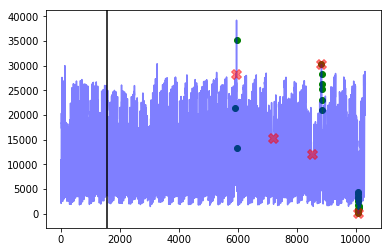




--- exchange-2_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [978, 1017, 1105]


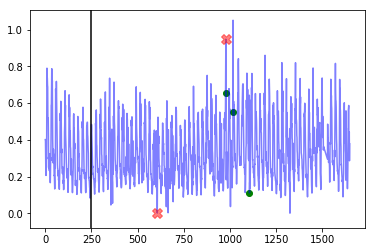




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194, 1195]


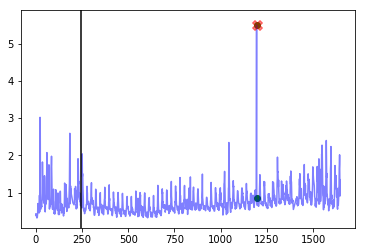




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4964, 4987, 6506, 6651, 8158, 8324, 8325, 8394, 8491, 8492, 8513, 8539, 8564, 8565, 8587, 8611, 8615]


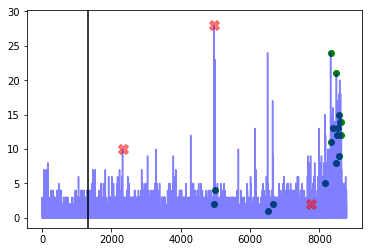




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [787, 792, 1587, 2596, 3691, 3694]


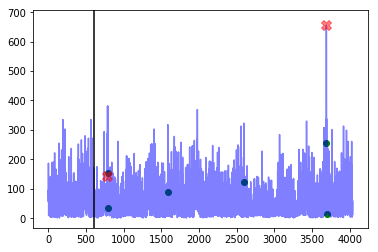




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


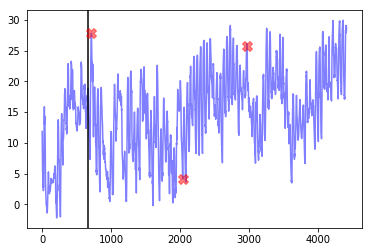




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


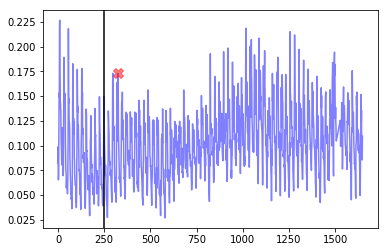




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [324, 467, 468]


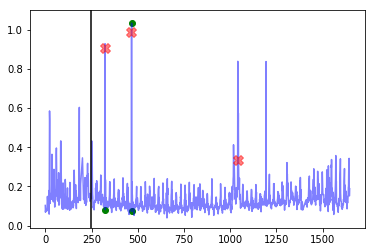




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


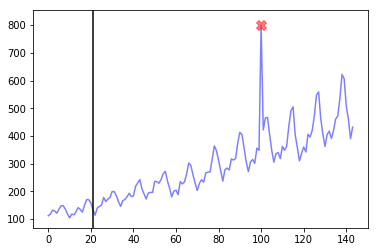




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


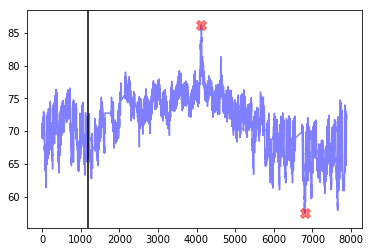

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  17.5
Best window threshold:  0.0001
Corresponding window overall precision:  0.5555555555555556
Corresponding window overall recall:  0.43478260869565216
Corresponding window overall F score:  0.4878048780487805



--- nyc_taxi ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [5909, 5955, 5956, 8834, 8835, 8836, 8837, 8838, 8839, 10071, 10072, 10073, 10074, 10075, 10076, 10077, 10078, 10079, 10097, 10098]


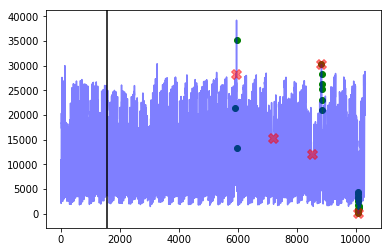




--- exchange-2_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [978, 1017, 1105]


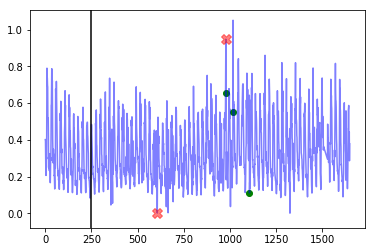




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194, 1195]


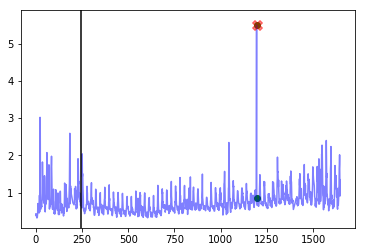




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4964, 4987, 6506, 6651, 8158, 8324, 8325, 8394, 8491, 8492, 8513, 8539, 8564, 8565, 8587, 8611, 8615]


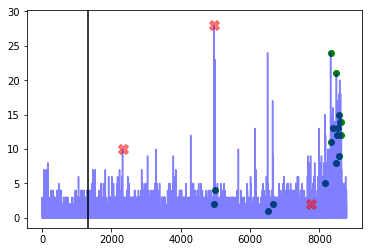




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [787, 792, 1587, 2596, 3691, 3694]


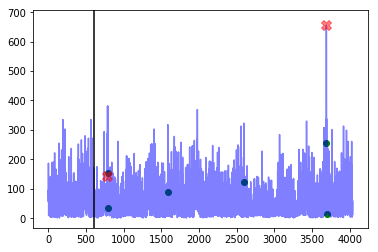




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


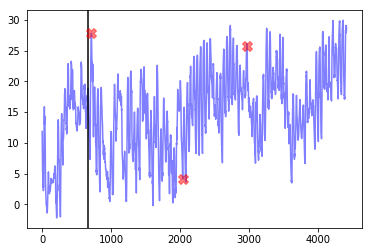




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


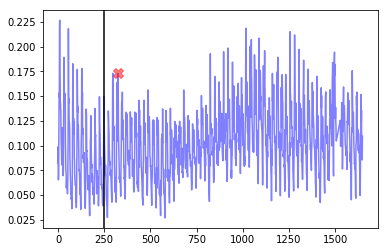




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [324, 467, 468]


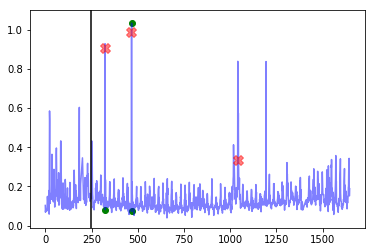




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


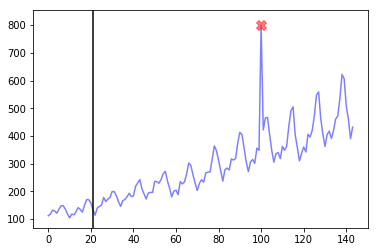




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


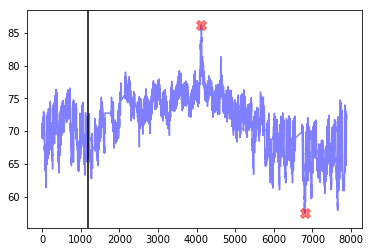

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  18.4
Best window threshold:  0.0001
Corresponding window overall precision:  0.5555555555555556
Corresponding window overall recall:  0.43478260869565216
Corresponding window overall F score:  0.4878048780487805



--- nyc_taxi ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [5909, 5955, 5956, 8834, 8835, 8836, 8837, 8838, 8839, 10071, 10072, 10073, 10074, 10075, 10076, 10077, 10078, 10079, 10097, 10098]


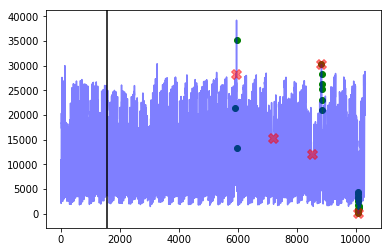




--- exchange-2_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [978, 1017, 1105]


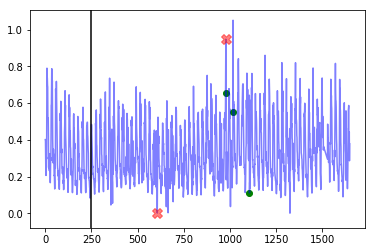




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194, 1195]


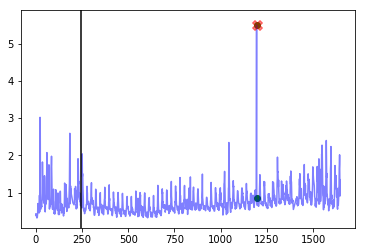




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4964, 4987, 6506, 6651, 8158, 8324, 8325, 8394, 8491, 8492, 8513, 8539, 8564, 8565, 8587, 8611, 8615]


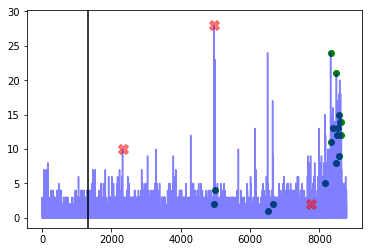




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [787, 792, 1587, 2596, 3691, 3694]


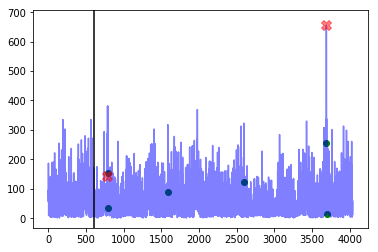




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


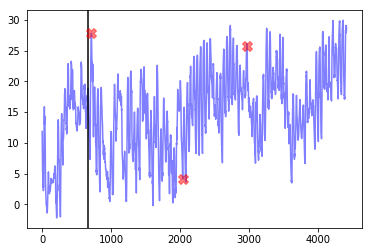




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


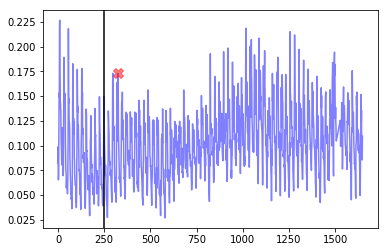




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [324, 467, 468]


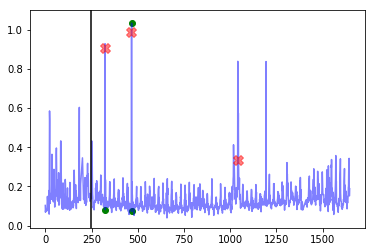




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


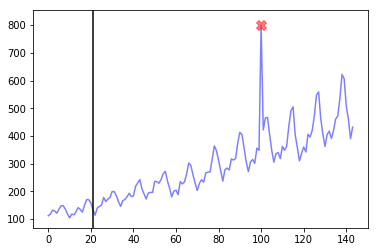




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


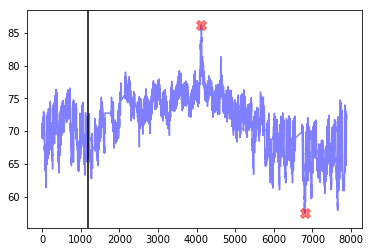

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.3
Best window threshold:  0.0001
Corresponding window overall precision:  0.5555555555555556
Corresponding window overall recall:  0.43478260869565216
Corresponding window overall F score:  0.4878048780487805



--- nyc_taxi ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [5909, 5955, 5956, 8834, 8835, 8836, 8837, 8838, 8839, 10071, 10072, 10073, 10074, 10075, 10076, 10077, 10078, 10079, 10097, 10098]


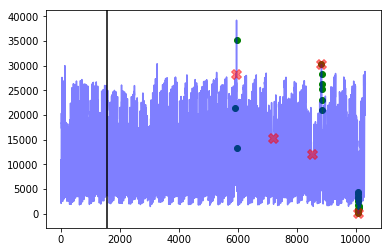




--- exchange-2_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [978, 1017, 1105]


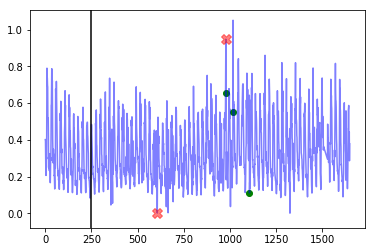




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194, 1195]


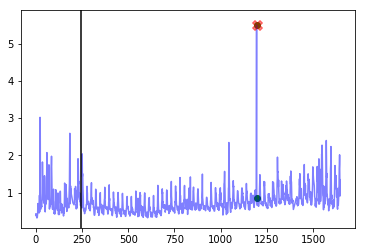




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4964, 4987, 6506, 6651, 8158, 8324, 8325, 8394, 8491, 8492, 8513, 8539, 8564, 8565, 8587, 8611, 8615]


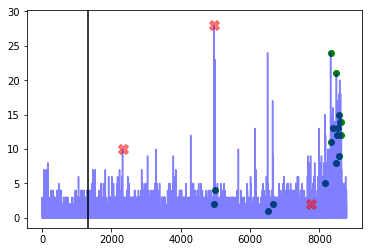




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [787, 792, 1587, 2596, 3691, 3694]


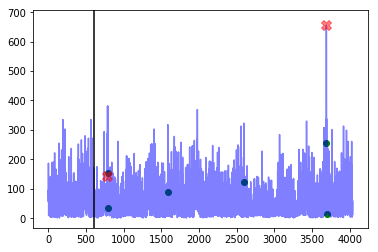




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


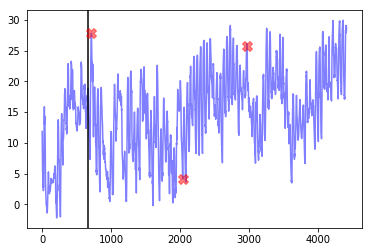




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


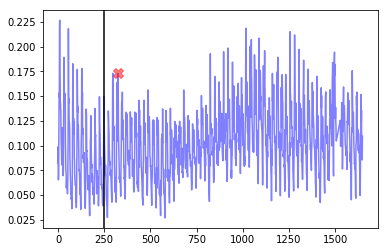




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [324, 467, 468]


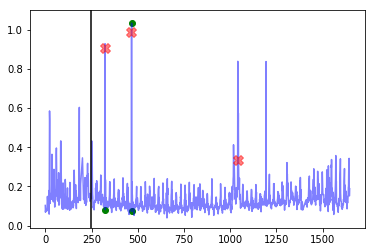




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


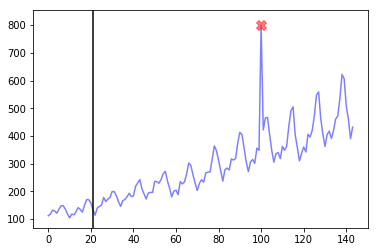




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


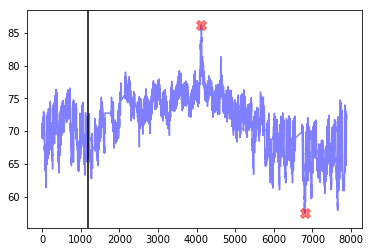

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.2
Best window threshold:  0.0001
Corresponding window overall precision:  0.5555555555555556
Corresponding window overall recall:  0.43478260869565216
Corresponding window overall F score:  0.4878048780487805



--- nyc_taxi ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [5909, 5955, 5956, 8834, 8835, 8836, 8837, 8838, 8839, 10071, 10072, 10073, 10074, 10075, 10076, 10077, 10078, 10079, 10097, 10098]


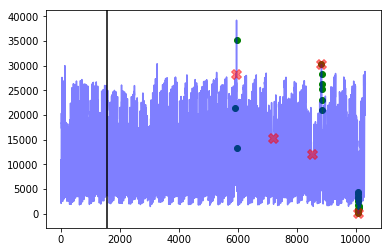




--- exchange-2_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [978, 1017, 1105]


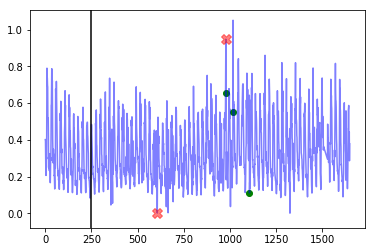




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194, 1195]


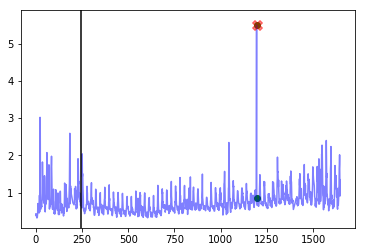




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4964, 4987, 6506, 6651, 8158, 8324, 8325, 8394, 8491, 8492, 8513, 8539, 8564, 8565, 8587, 8611, 8615]


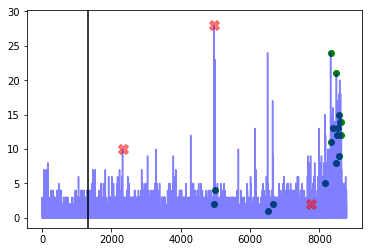




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [787, 792, 1587, 2596, 3691, 3694]


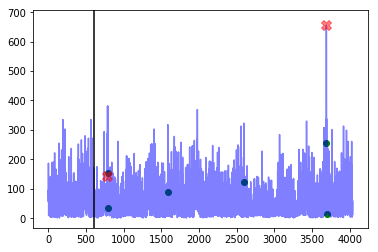




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


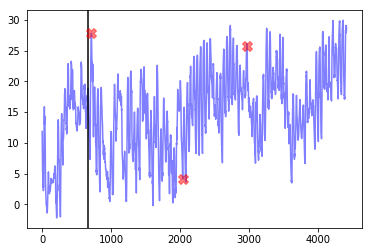




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


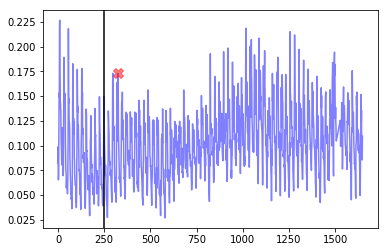




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [324, 467, 468]


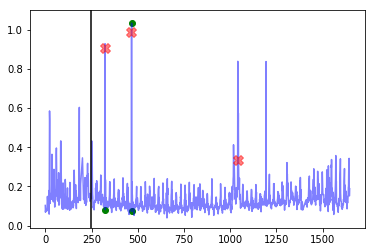




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


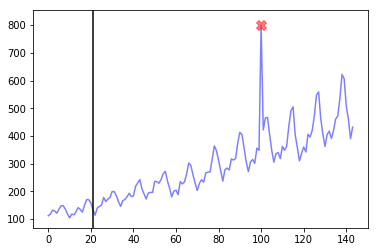




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


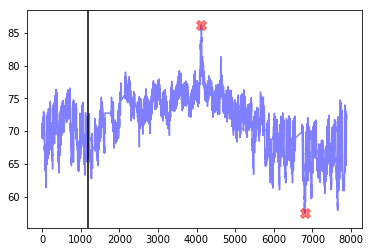

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.1
Best window threshold:  0.0001
Corresponding window overall precision:  0.5555555555555556
Corresponding window overall recall:  0.43478260869565216
Corresponding window overall F score:  0.4878048780487805



--- nyc_taxi ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [5909, 5955, 5956, 8834, 8835, 8836, 8837, 8838, 8839, 10071, 10072, 10073, 10074, 10075, 10076, 10077, 10078, 10079, 10097, 10098]


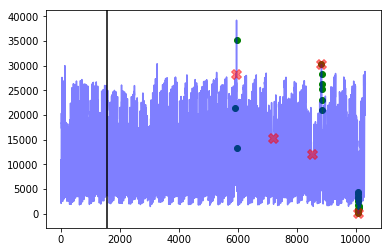




--- exchange-2_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [978, 1017, 1105]


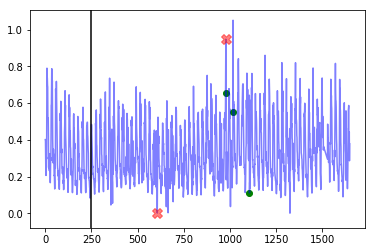




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194, 1195]


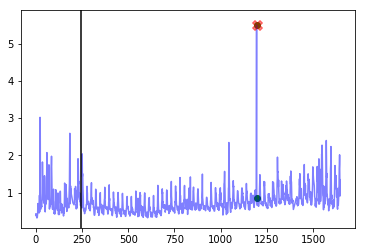




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4964, 4987, 6506, 6651, 8158, 8324, 8325, 8394, 8491, 8492, 8513, 8539, 8564, 8565, 8587, 8611, 8615]


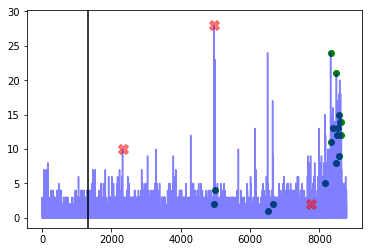




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [787, 792, 1587, 2596, 3691, 3694]


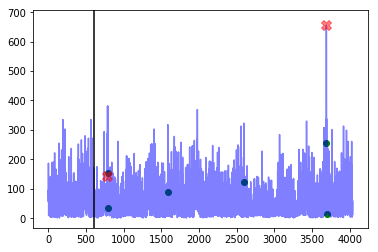




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


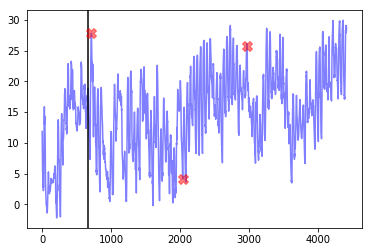




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


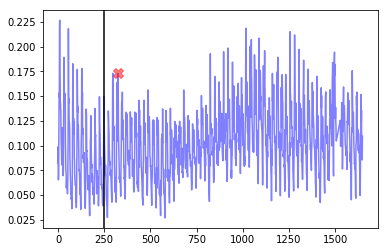




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [324, 467, 468]


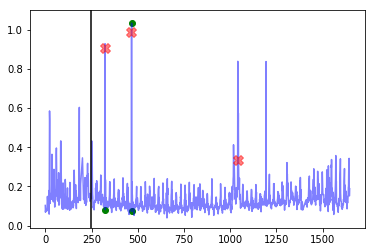




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


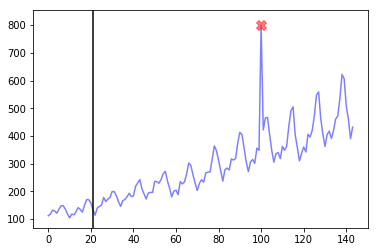




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


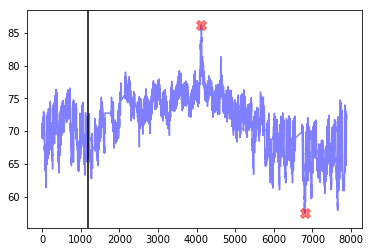

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  22.0
Best window threshold:  0.0001
Corresponding window overall precision:  0.5555555555555556
Corresponding window overall recall:  0.43478260869565216
Corresponding window overall F score:  0.4878048780487805



--- nyc_taxi ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [5909, 5955, 5956, 8834, 8835, 8836, 8837, 8838, 8839, 10071, 10072, 10073, 10074, 10075, 10076, 10077, 10078, 10079, 10097, 10098]


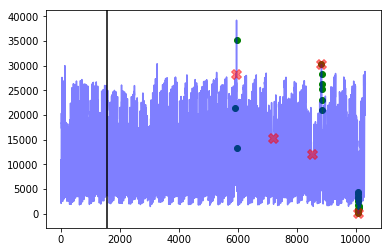




--- exchange-2_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [978, 1017, 1105]


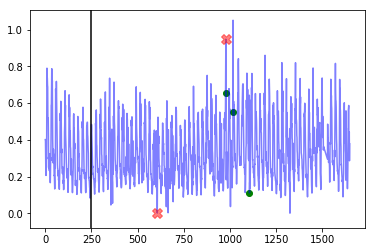




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1194, 1195]


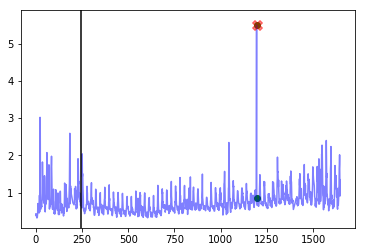




--- all_data_gift_certificates ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  5
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4964, 4987, 6506, 6651, 8158, 8324, 8325, 8394, 8491, 8492, 8513, 8539, 8564, 8565, 8587, 8611, 8615]


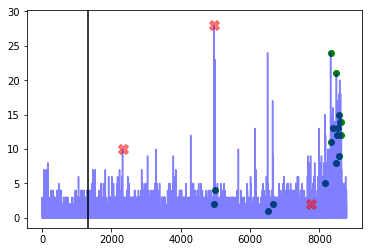




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [787, 792, 1587, 2596, 3691, 3694]


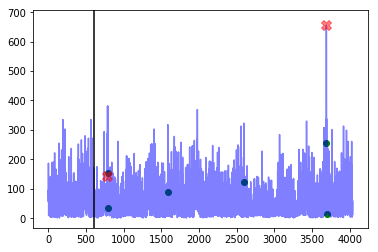




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


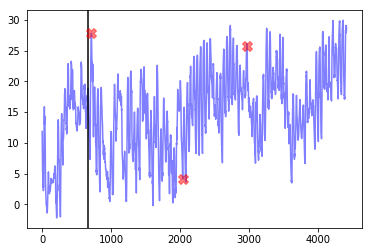




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


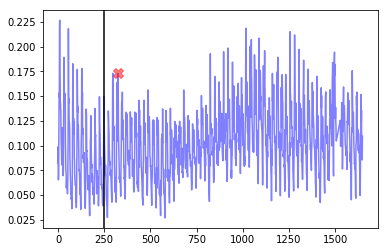




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [324, 467, 468]


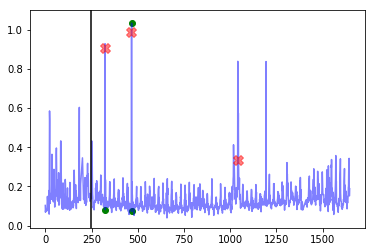




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


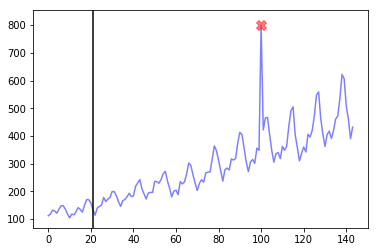




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


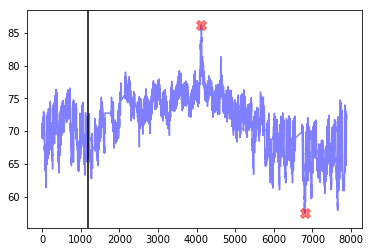

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 13.9
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.5555555555555556
	 Corresponding window overall recall : 0.43478260869565216
	 Corresponding window overall F score : 0.4878048780487805
False Positive Weight:  0.2
	 Minimum number of mistakes : 14.8
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.5555555555555556
	 Corresponding window overall recall : 0.43478260869565216
	 Corresponding window overall F score : 0.4878048780487805
False Positive Weight:  0.3
	 Minimum number of mistakes : 15.7
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.5555555555555556
	 Corresponding window overall recall : 0.43478260869565216
	 Corresponding window overall F score : 0.4878048780487805
False Positive Weight:  0.4
	 Minimum number of mistakes : 16.6
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.55555555

In [16]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# HTM Results 

everything except for international-airline-passengers

In [24]:
htm_dataset_name_list = ["nyc_taxi",
                         "exchange-2_cpm_results",
                         "exchange-3_cpm_results",
                         "all_data_gift_certificates",
                         "elb_request_count_8c0756",
                         "FARM_Bowling-Green-5-S_Warren",
                         "exchange-2_cpc_results",
                         "exchange-3_cpc_results",
                         "ambient_temperature_system_failure"]

htm_ad_dict = {}
for dataset_name in htm_dataset_name_list:
    htm_ad_dict[dataset_name] = ad_dict[dataset_name]
    
htm_true_outlier_indices_dict = {}
for dataset_name in htm_dataset_name_list:
    htm_true_outlier_indices_dict[dataset_name] = true_outlier_indices_dict[dataset_name]

In [25]:
anomaly_scores_dict = {}

for dataset_name in htm_dataset_name_list:
    output_dict_htm = joblib.load("anomaly_scores" + window_size + "/HTM/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_htm["Anomaly Scores"]

In [26]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, htm_true_outlier_indices_dict)

{0.1: {'precision': 0.13333333333333333, 'recall': 1.0},
 0.2: {'precision': 0.2, 'recall': 1.0},
 0.3: {'precision': 0.3333333333333333, 'recall': 1.0},
 0.4: {'precision': 0.3333333333333333, 'recall': 1.0},
 0.5: {'precision': 0.4, 'recall': 1.0},
 0.6: {'precision': 0.5, 'recall': 1.0},
 0.7: {'precision': 1.0, 'recall': 0.5},
 0.8: {'precision': 1.0, 'recall': 0.5},
 0.9: {'precision': 0.0, 'recall': 0.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  8.400000000000002
Best window threshold:  0.4663
Corresponding window overall precision:  0.3902439024390244
Corresponding window overall recall:  0.7272727272727273
Corresponding window overall F score:  0.5079365079365079



--- nyc_taxi ---
Corresponding window precision:  0.7142857142857143
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3250, 3251, 3263, 5929, 5955, 7193, 7608, 8523, 8835, 10062, 10105]


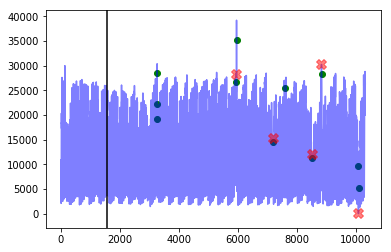




--- exchange-2_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [979, 986, 1105]


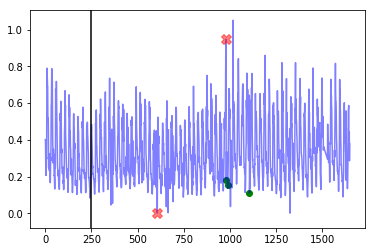




--- exchange-3_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1046, 1049, 1050, 1193, 1532, 1554, 1574, 1575, 1576, 1577, 1578]


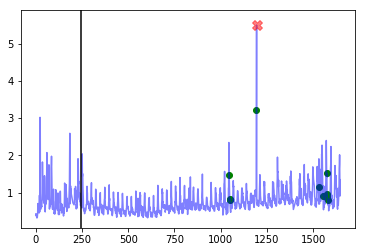




--- all_data_gift_certificates ---
Corresponding window precision:  0.23076923076923078
Corresponding window recall:  1.0
Corresponding window false positives:  10
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2321, 2872, 3043, 4287, 4962, 4987, 5663, 6138, 6506, 6651, 6670, 7680, 7687, 7872, 7986, 8016, 8065, 8157, 8180, 8324, 8346, 8347, 8376, 8378, 8598]


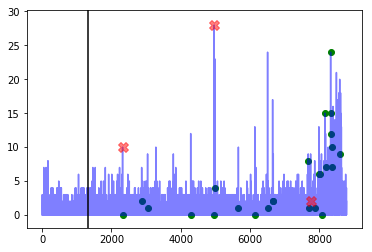




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [787, 1407, 1979, 1983, 3668, 3692, 3768]


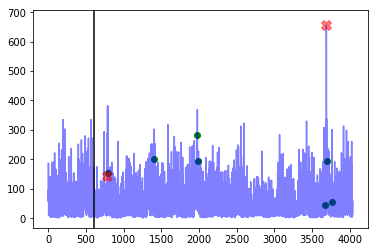




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [713, 2303]


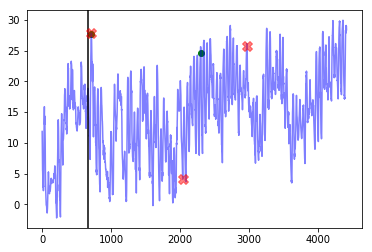




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [654, 655, 656, 1046, 1486]


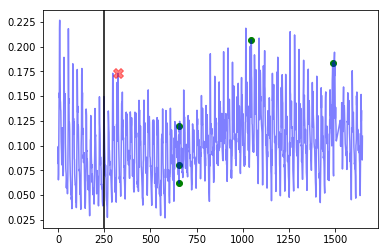




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1022, 1023, 1043]


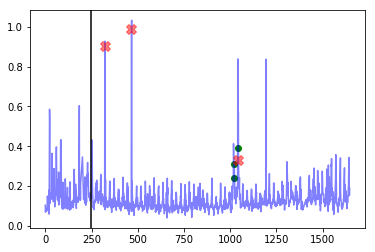




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2039, 2156, 3556, 4101, 4123, 6792, 6793, 6794, 7657]


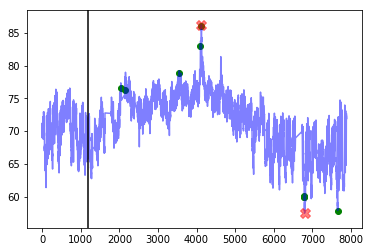

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  10.8
Best window threshold:  0.4663
Corresponding window overall precision:  0.3902439024390244
Corresponding window overall recall:  0.7272727272727273
Corresponding window overall F score:  0.5079365079365079



--- nyc_taxi ---
Corresponding window precision:  0.7142857142857143
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3250, 3251, 3263, 5929, 5955, 7193, 7608, 8523, 8835, 10062, 10105]


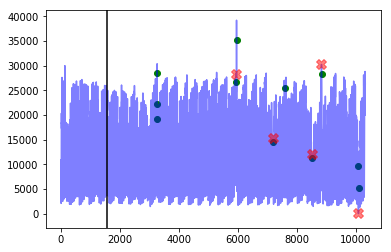




--- exchange-2_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [979, 986, 1105]


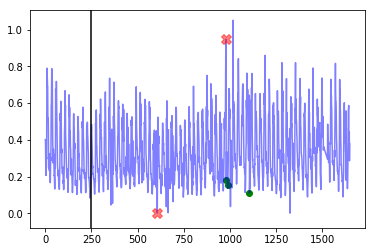




--- exchange-3_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1046, 1049, 1050, 1193, 1532, 1554, 1574, 1575, 1576, 1577, 1578]


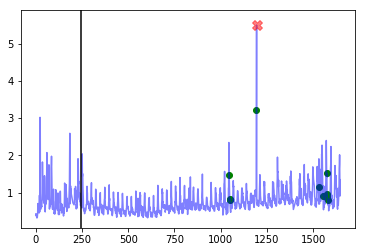




--- all_data_gift_certificates ---
Corresponding window precision:  0.23076923076923078
Corresponding window recall:  1.0
Corresponding window false positives:  10
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2321, 2872, 3043, 4287, 4962, 4987, 5663, 6138, 6506, 6651, 6670, 7680, 7687, 7872, 7986, 8016, 8065, 8157, 8180, 8324, 8346, 8347, 8376, 8378, 8598]


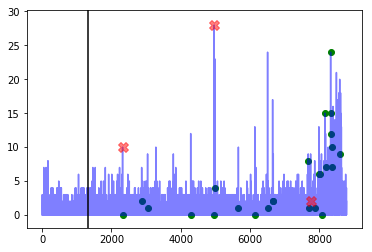




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [787, 1407, 1979, 1983, 3668, 3692, 3768]


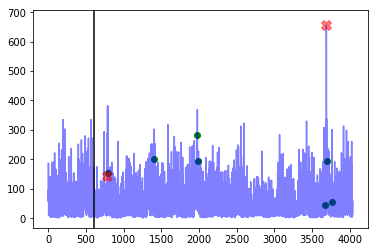




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [713, 2303]


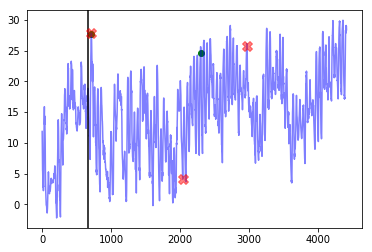




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [654, 655, 656, 1046, 1486]


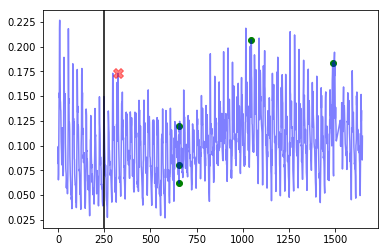




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1022, 1023, 1043]


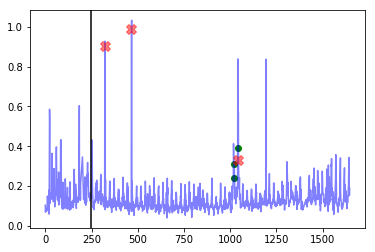




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2039, 2156, 3556, 4101, 4123, 6792, 6793, 6794, 7657]


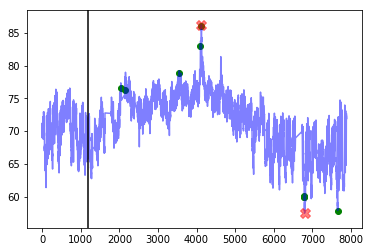

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  13.2
Best window threshold:  0.4663
Corresponding window overall precision:  0.3902439024390244
Corresponding window overall recall:  0.7272727272727273
Corresponding window overall F score:  0.5079365079365079



--- nyc_taxi ---
Corresponding window precision:  0.7142857142857143
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3250, 3251, 3263, 5929, 5955, 7193, 7608, 8523, 8835, 10062, 10105]


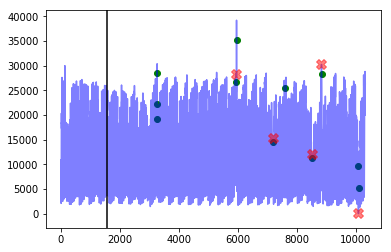




--- exchange-2_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [979, 986, 1105]


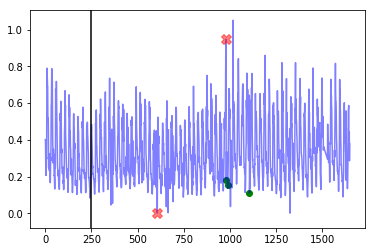




--- exchange-3_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1046, 1049, 1050, 1193, 1532, 1554, 1574, 1575, 1576, 1577, 1578]


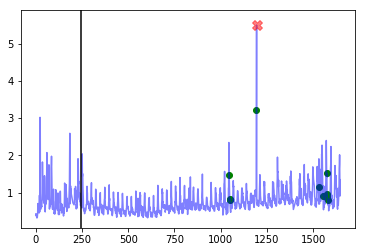




--- all_data_gift_certificates ---
Corresponding window precision:  0.23076923076923078
Corresponding window recall:  1.0
Corresponding window false positives:  10
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2321, 2872, 3043, 4287, 4962, 4987, 5663, 6138, 6506, 6651, 6670, 7680, 7687, 7872, 7986, 8016, 8065, 8157, 8180, 8324, 8346, 8347, 8376, 8378, 8598]


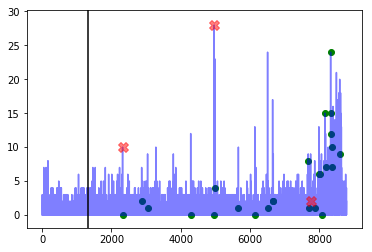




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [787, 1407, 1979, 1983, 3668, 3692, 3768]


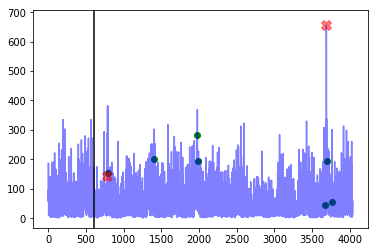




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [713, 2303]


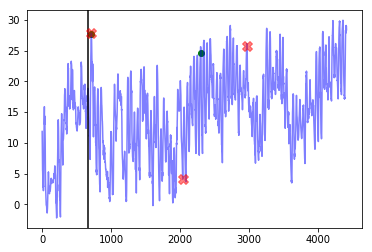




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [654, 655, 656, 1046, 1486]


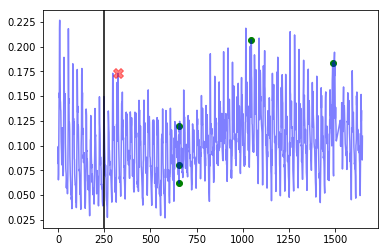




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1022, 1023, 1043]


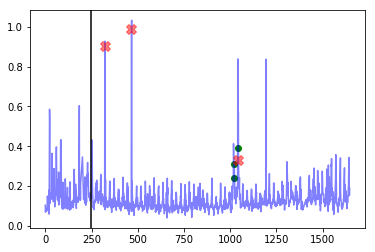




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2039, 2156, 3556, 4101, 4123, 6792, 6793, 6794, 7657]


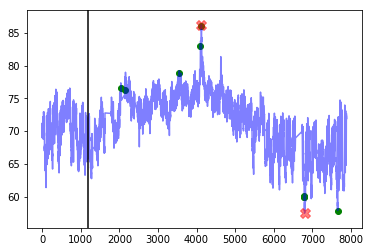

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  15.599999999999998
Best window threshold:  0.4663
Corresponding window overall precision:  0.3902439024390244
Corresponding window overall recall:  0.7272727272727273
Corresponding window overall F score:  0.5079365079365079



--- nyc_taxi ---
Corresponding window precision:  0.7142857142857143
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3250, 3251, 3263, 5929, 5955, 7193, 7608, 8523, 8835, 10062, 10105]


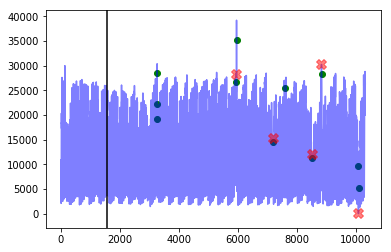




--- exchange-2_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [979, 986, 1105]


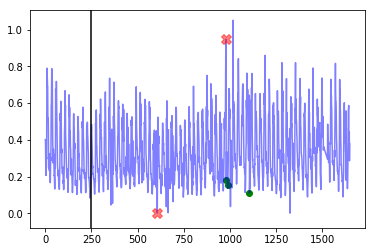




--- exchange-3_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1046, 1049, 1050, 1193, 1532, 1554, 1574, 1575, 1576, 1577, 1578]


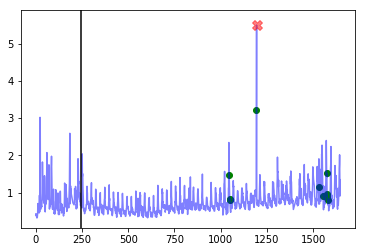




--- all_data_gift_certificates ---
Corresponding window precision:  0.23076923076923078
Corresponding window recall:  1.0
Corresponding window false positives:  10
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2321, 2872, 3043, 4287, 4962, 4987, 5663, 6138, 6506, 6651, 6670, 7680, 7687, 7872, 7986, 8016, 8065, 8157, 8180, 8324, 8346, 8347, 8376, 8378, 8598]


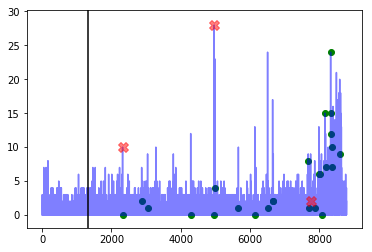




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [787, 1407, 1979, 1983, 3668, 3692, 3768]


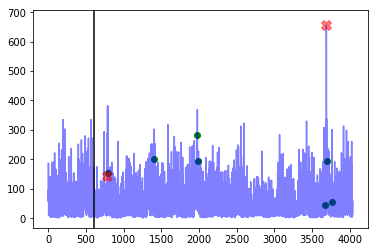




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [713, 2303]


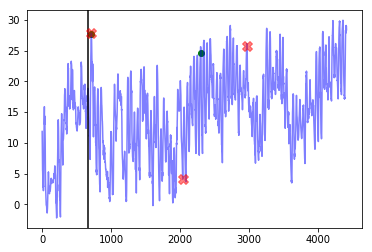




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [654, 655, 656, 1046, 1486]


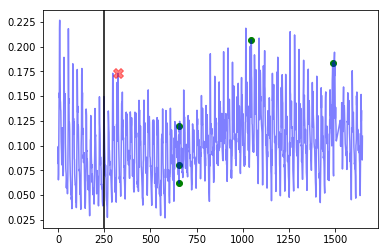




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1022, 1023, 1043]


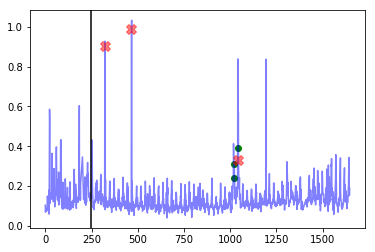




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2039, 2156, 3556, 4101, 4123, 6792, 6793, 6794, 7657]


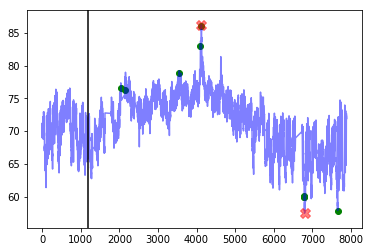

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  18.0
Best window threshold:  0.4663
Corresponding window overall precision:  0.3902439024390244
Corresponding window overall recall:  0.7272727272727273
Corresponding window overall F score:  0.5079365079365079



--- nyc_taxi ---
Corresponding window precision:  0.7142857142857143
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [3250, 3251, 3263, 5929, 5955, 7193, 7608, 8523, 8835, 10062, 10105]


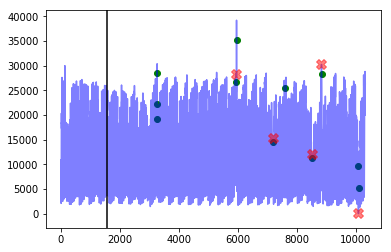




--- exchange-2_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [979, 986, 1105]


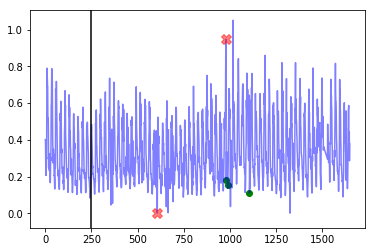




--- exchange-3_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1046, 1049, 1050, 1193, 1532, 1554, 1574, 1575, 1576, 1577, 1578]


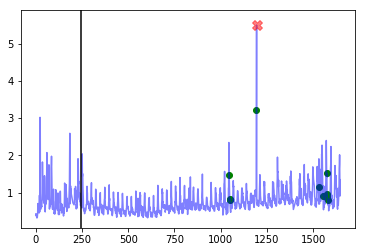




--- all_data_gift_certificates ---
Corresponding window precision:  0.23076923076923078
Corresponding window recall:  1.0
Corresponding window false positives:  10
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2321, 2872, 3043, 4287, 4962, 4987, 5663, 6138, 6506, 6651, 6670, 7680, 7687, 7872, 7986, 8016, 8065, 8157, 8180, 8324, 8346, 8347, 8376, 8378, 8598]


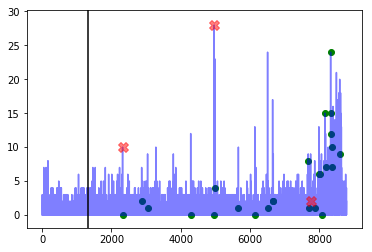




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [787, 1407, 1979, 1983, 3668, 3692, 3768]


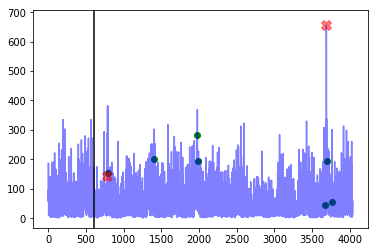




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [713, 2303]


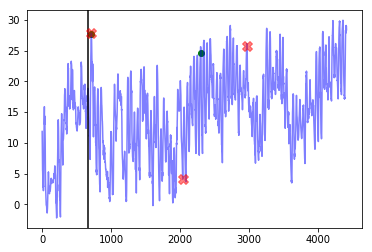




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [654, 655, 656, 1046, 1486]


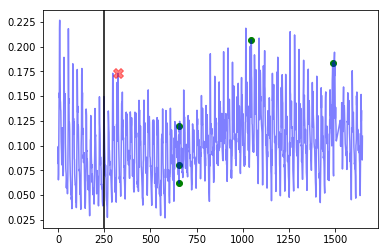




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1022, 1023, 1043]


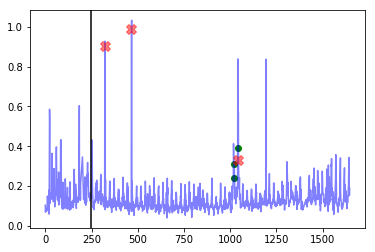




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.4
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2039, 2156, 3556, 4101, 4123, 6792, 6793, 6794, 7657]


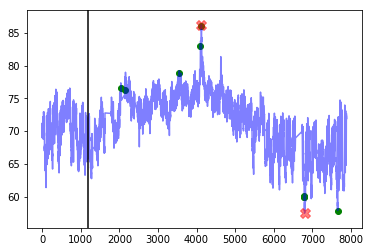

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.6
Best window threshold:  0.8455
Corresponding window overall precision:  0.75
Corresponding window overall recall:  0.13636363636363635
Corresponding window overall F score:  0.23076923076923075



--- nyc_taxi ---
Corresponding window precision:  0.75
Corresponding window recall:  0.6
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [5955, 7608, 8523, 8835]


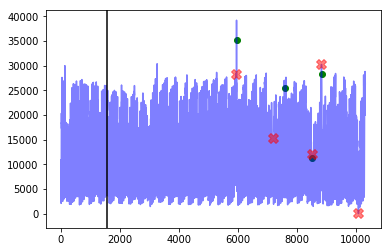




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


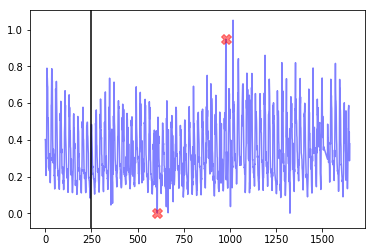




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


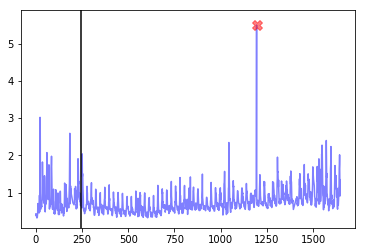




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


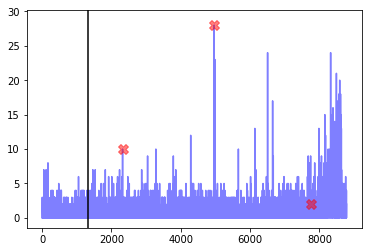




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


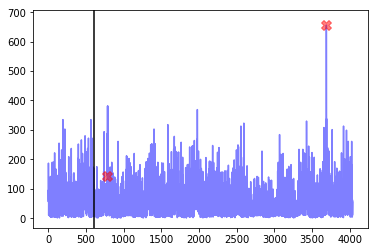




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


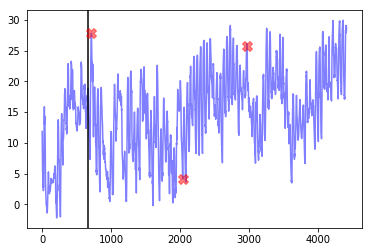




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


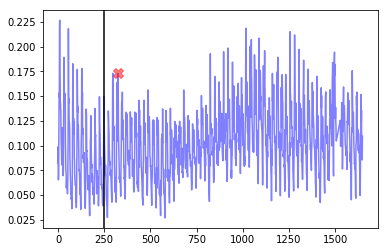




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


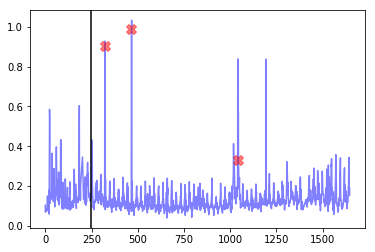




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


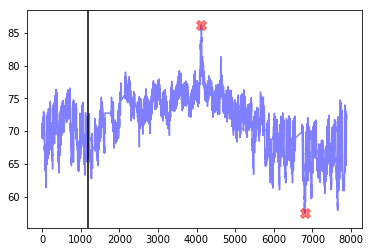

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.7
Best window threshold:  0.8455
Corresponding window overall precision:  0.75
Corresponding window overall recall:  0.13636363636363635
Corresponding window overall F score:  0.23076923076923075



--- nyc_taxi ---
Corresponding window precision:  0.75
Corresponding window recall:  0.6
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [5955, 7608, 8523, 8835]


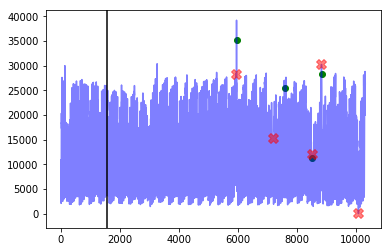




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


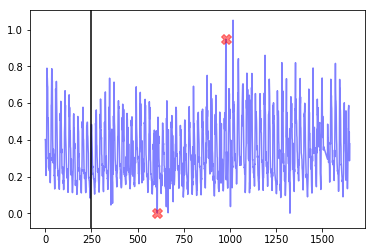




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


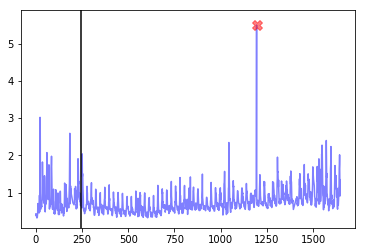




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


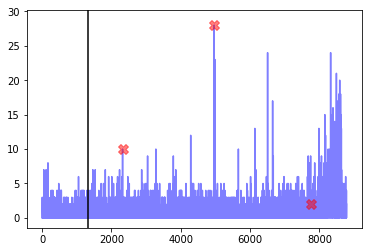




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


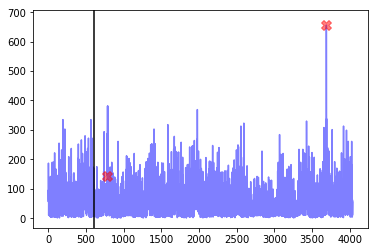




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


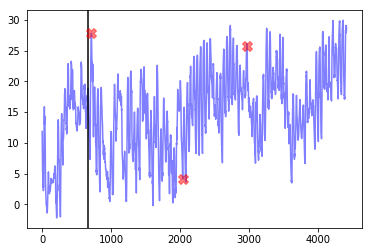




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


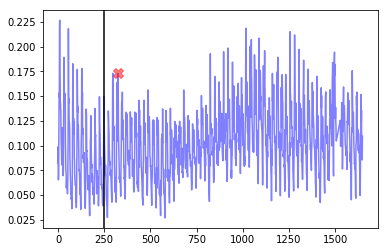




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


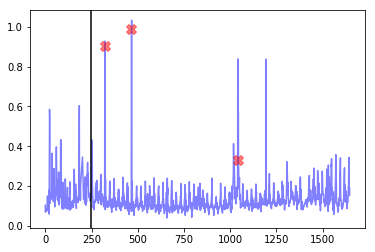




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


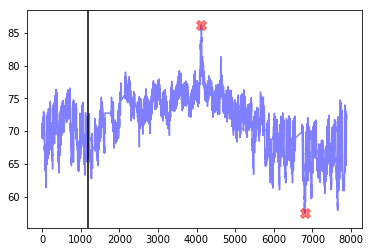

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.8
Best window threshold:  0.8455
Corresponding window overall precision:  0.75
Corresponding window overall recall:  0.13636363636363635
Corresponding window overall F score:  0.23076923076923075



--- nyc_taxi ---
Corresponding window precision:  0.75
Corresponding window recall:  0.6
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [5955, 7608, 8523, 8835]


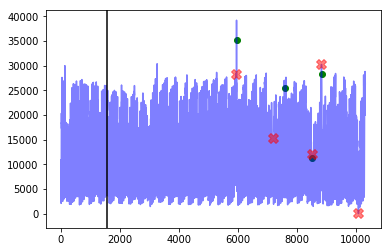




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


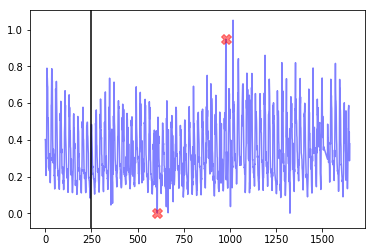




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


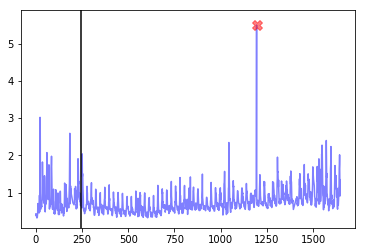




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


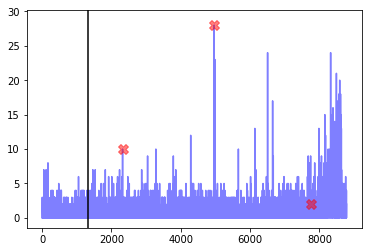




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


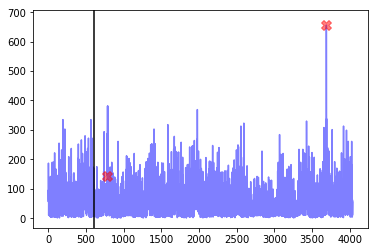




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


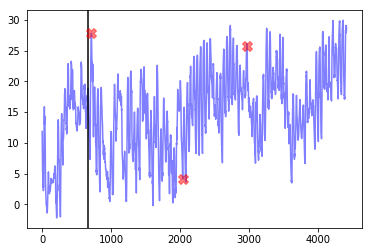




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


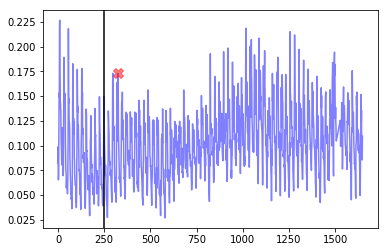




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


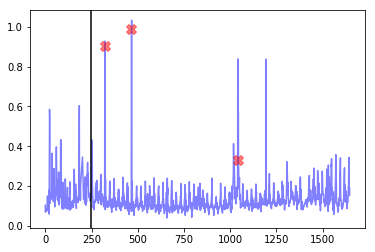




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


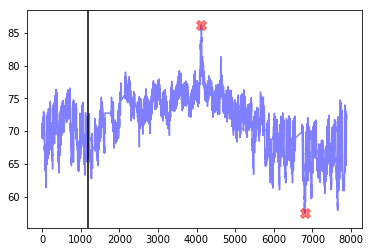

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.9
Best window threshold:  0.8455
Corresponding window overall precision:  0.75
Corresponding window overall recall:  0.13636363636363635
Corresponding window overall F score:  0.23076923076923075



--- nyc_taxi ---
Corresponding window precision:  0.75
Corresponding window recall:  0.6
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [5955, 7608, 8523, 8835]


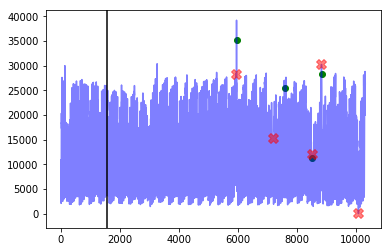




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


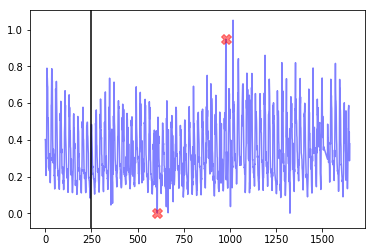




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


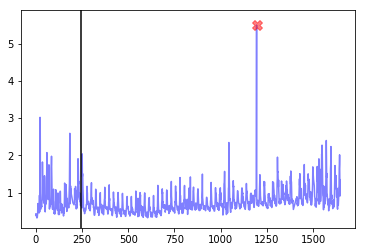




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


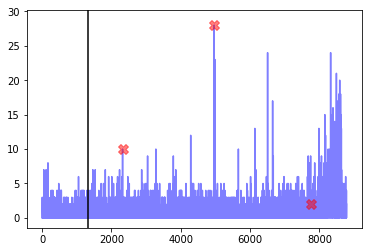




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


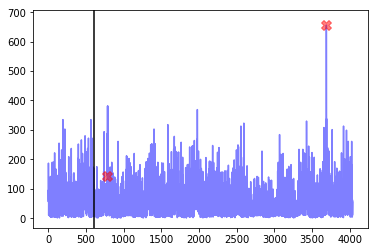




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


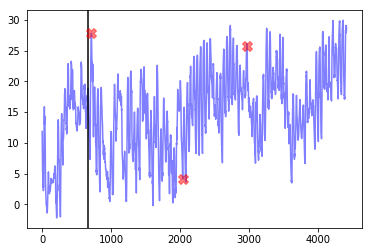




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


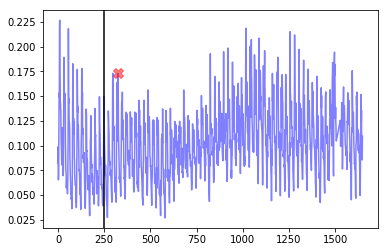




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


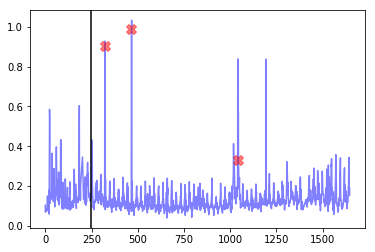




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


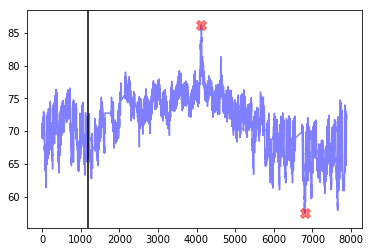

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.0
Best window threshold:  0.8455
Corresponding window overall precision:  0.75
Corresponding window overall recall:  0.13636363636363635
Corresponding window overall F score:  0.23076923076923075



--- nyc_taxi ---
Corresponding window precision:  0.75
Corresponding window recall:  0.6
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [5955, 7608, 8523, 8835]


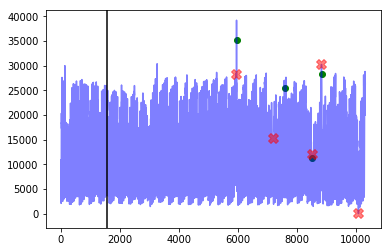




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


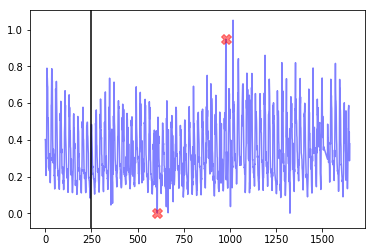




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


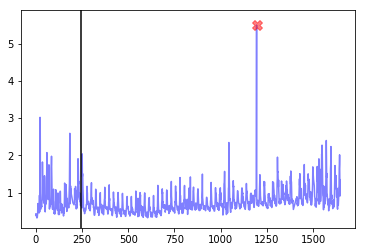




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


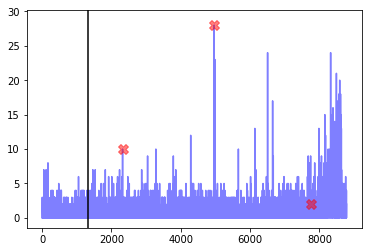




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


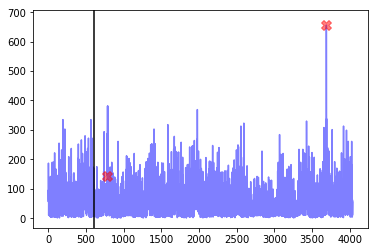




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


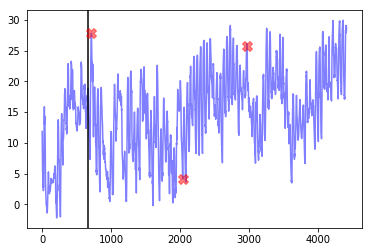




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


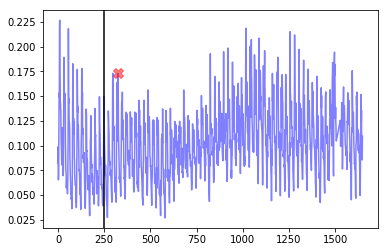




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


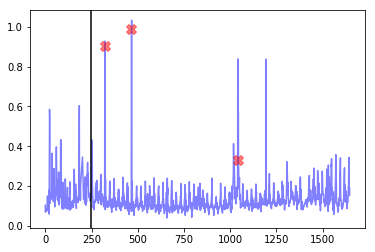




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


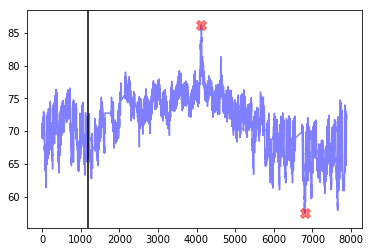

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 8.400000000000002
	 Best window threshold : 0.4663
	 Corresponding window overall precision : 0.3902439024390244
	 Corresponding window overall recall : 0.7272727272727273
	 Corresponding window overall F score : 0.5079365079365079
False Positive Weight:  0.2
	 Minimum number of mistakes : 10.8
	 Best window threshold : 0.4663
	 Corresponding window overall precision : 0.3902439024390244
	 Corresponding window overall recall : 0.7272727272727273
	 Corresponding window overall F score : 0.5079365079365079
False Positive Weight:  0.3
	 Minimum number of mistakes : 13.2
	 Best window threshold : 0.4663
	 Corresponding window overall precision : 0.3902439024390244
	 Corresponding window overall recall : 0.7272727272727273
	 Corresponding window overall F score : 0.5079365079365079
False Positive Weight:  0.4
	 Minimum number of mistakes : 15.599999999999998
	 Best window threshold : 0.4663
	 Corresponding window overal

In [27]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(htm_ad_dict, anomaly_scores_dict, htm_true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# STL Residual Results

In [28]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_htm = joblib.load("anomaly_scores" + window_size + "/stl/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_htm["Anomaly Scores"]

In [29]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.2: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.3: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.4: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.5: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.6: {'precision': 0.0, 'recall': 0.0},
 0.7: {'precision': 0.0, 'recall': 0.0},
 0.8: {'precision': 0.0, 'recall': 0.0},
 0.9: {'precision': 0.0, 'recall': 0.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  17.800000000000004
Best window threshold:  0.0
Corresponding window overall precision:  0.11330049261083744
Corresponding window overall recall:  1.0
Corresponding window overall F score:  0.20353982300884957



--- nyc_taxi ---
Corresponding window precision:  0.11627906976744186
Corresponding window recall:  1.0
Corresponding window false positives:  38
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1548, 1549, 1550, 1551, 1552, 1553, 1554, 1555, 1556, 1557, 1558, 1559, 1560, 1561, 1562, 1563, 1564, 1565, 1566, 1567, 1568, 1569, 1570, 1571, 1572, 1573, 1574, 1575, 1576, 1577, 1578, 1579, 1580, 1581, 1582, 1583, 1584, 1585, 1586, 1587, 1588, 1589, 1590, 1591, 1592, 1593, 1594, 1595, 1596, 1597, 1598, 1599, 1600, 1601, 1602, 1603, 1604, 1605, 1606, 1607, 1608, 1609, 1610, 1611, 1612, 1613, 1614, 1615, 1616, 1617, 1618, 1619, 162

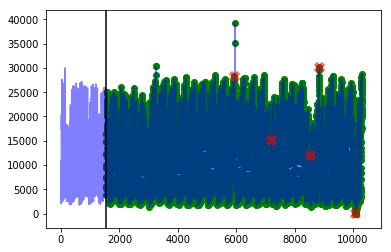




--- exchange-2_cpm_results ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  16
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 39

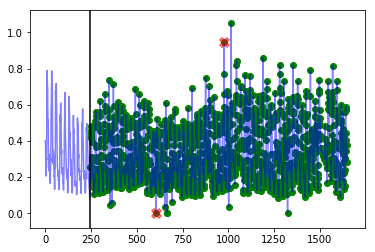




--- exchange-3_cpm_results ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394

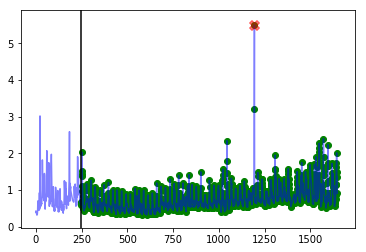




--- all_data_gift_certificates ---
Corresponding window precision:  0.11538461538461539
Corresponding window recall:  1.0
Corresponding window false positives:  23
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1317, 1318, 1319, 1320, 1321, 1322, 1323, 1324, 1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332, 1333, 1334, 1335, 1336, 1337, 1338, 1339, 1340, 1341, 1342, 1343, 1344, 1345, 1346, 1347, 1348, 1349, 1350, 1351, 1352, 1353, 1354, 1355, 1356, 1357, 1358, 1359, 1360, 1361, 1362, 1363, 1364, 1365, 1366, 1367, 1368, 1369, 1370, 1371, 1372, 1373, 1374, 1375, 1376, 1377, 1378, 1379, 1380, 1381, 1382, 1383, 1384, 1385, 1386, 1387, 1388, 1389, 1390, 1391, 1392, 1393, 1394, 1395, 1396, 1397, 1398, 1399, 1400, 1401, 1402, 1403, 1404, 1405, 1406, 1407, 1408, 1409, 1410, 1411, 1412, 1413, 1414, 1415, 1416, 1417, 1418, 1419, 1420, 1421, 1422, 1423, 1424, 1425, 1426, 1427, 1428, 1429, 1430, 1431, 1432, 1433, 1434, 1435, 1436, 1437, 1438, 

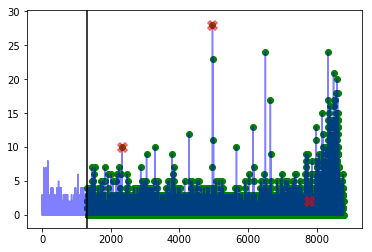




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.11764705882352941
Corresponding window recall:  1.0
Corresponding window false positives:  15
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [606, 607, 608, 609, 610, 611, 612, 613, 614, 615, 616, 617, 618, 619, 620, 621, 622, 623, 624, 625, 626, 627, 628, 629, 630, 631, 632, 633, 634, 635, 636, 637, 638, 639, 640, 641, 642, 643, 644, 645, 646, 647, 648, 649, 650, 651, 652, 653, 654, 655, 656, 657, 658, 659, 660, 661, 662, 663, 664, 665, 666, 667, 668, 669, 670, 671, 672, 673, 674, 675, 676, 677, 678, 679, 680, 681, 682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752,

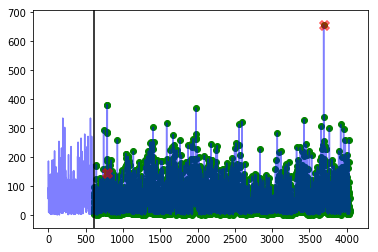




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.11538461538461539
Corresponding window recall:  1.0
Corresponding window false positives:  23
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [662, 663, 664, 665, 666, 667, 668, 669, 670, 671, 672, 673, 674, 675, 676, 677, 678, 679, 680, 681, 682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 756, 757, 758, 759, 760, 761, 762, 763, 764, 765, 766, 767, 768, 769, 770, 771, 772, 773, 774, 775, 776, 777, 778, 779, 780, 781, 782, 783, 784, 785, 786, 787, 788, 789, 790, 791, 792, 793, 794, 795, 796, 797, 798, 799, 800, 801, 802, 803, 804, 805, 806, 807,

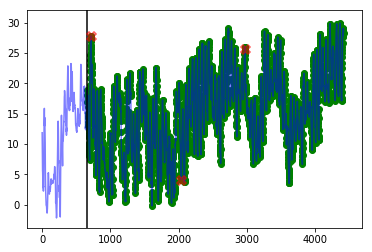




--- exchange-2_cpc_results ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394

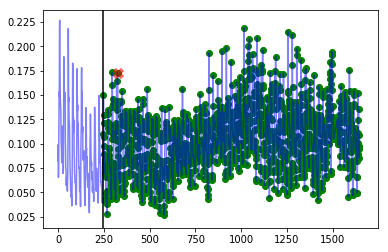




--- exchange-3_cpc_results ---
Corresponding window precision:  0.11538461538461539
Corresponding window recall:  1.0
Corresponding window false positives:  23
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 3

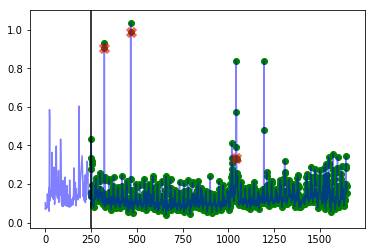




--- international-airline-passengers ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143]


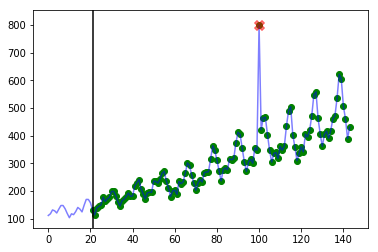




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  16
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1183, 1184, 1185, 1186, 1187, 1188, 1189, 1190, 1191, 1192, 1193, 1194, 1195, 1196, 1197, 1198, 1199, 1200, 1201, 1202, 1203, 1204, 1205, 1206, 1207, 1208, 1209, 1210, 1211, 1212, 1213, 1214, 1215, 1216, 1217, 1218, 1219, 1220, 1221, 1222, 1223, 1224, 1225, 1226, 1227, 1228, 1229, 1230, 1231, 1232, 1233, 1234, 1235, 1236, 1237, 1238, 1239, 1240, 1241, 1242, 1243, 1244, 1245, 1246, 1247, 1248, 1249, 1250, 1251, 1252, 1253, 1254, 1255, 1256, 1257, 1258, 1259, 1260, 1261, 1262, 1263, 1264, 1265, 1266, 1267, 1268, 1269, 1270, 1271, 1272, 1273, 1274, 1275, 1276, 1277, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 1285, 1286, 1287, 1288, 1289, 1290, 1291, 1292, 1293, 1294, 1295, 1296, 1297, 1298, 1299, 1300, 1301, 1302, 1303,

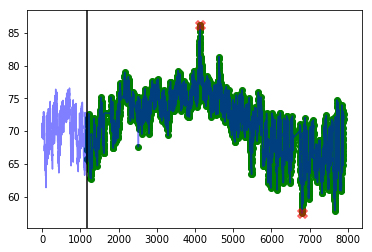

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  24.999999999999996
Best window threshold:  0.5285
Corresponding window overall precision:  0.1111111111111111
Corresponding window overall recall:  0.043478260869565216
Corresponding window overall F score:  0.0625



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  [10318, 10319]


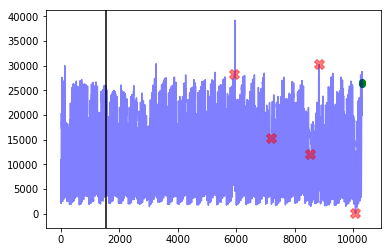




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1646, 1647]


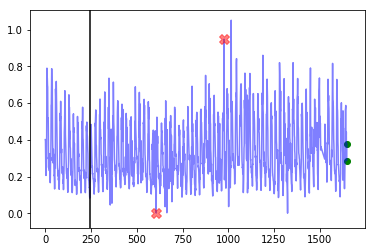




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1645, 1646]


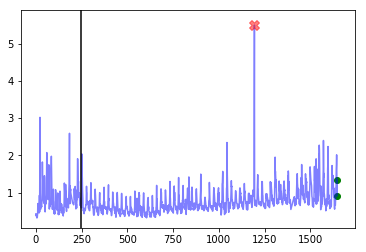




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [8782, 8783]


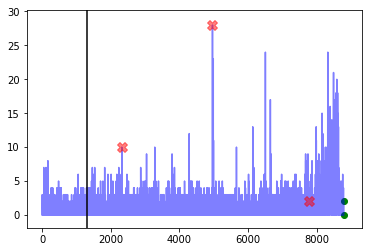




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4038, 4039]


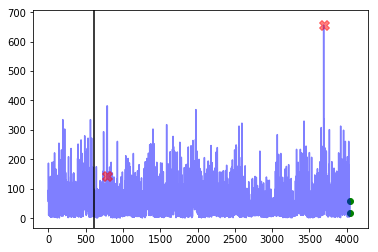




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4414, 4415]


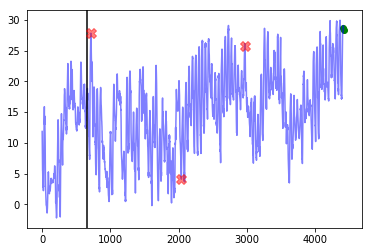




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1646, 1647]


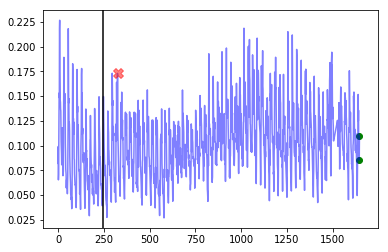




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1645, 1646]


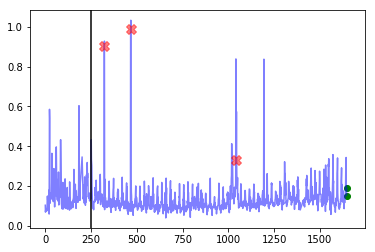




--- international-airline-passengers ---
Corresponding window precision:  0.14285714285714285
Corresponding window recall:  1.0
Corresponding window false positives:  6
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 142, 143]


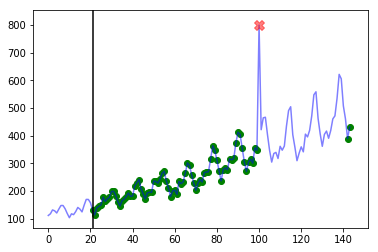




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [7886, 7887]


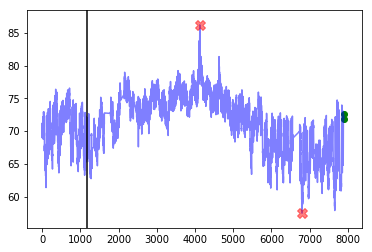

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  26.000000000000004
Best window threshold:  0.5624
Corresponding window overall precision:  0.1111111111111111
Corresponding window overall recall:  0.043478260869565216
Corresponding window overall F score:  0.0625



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  [10318, 10319]


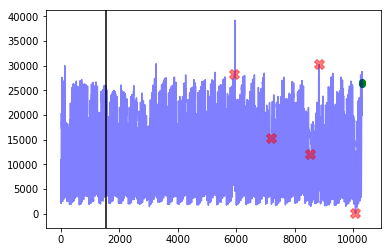




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1646, 1647]


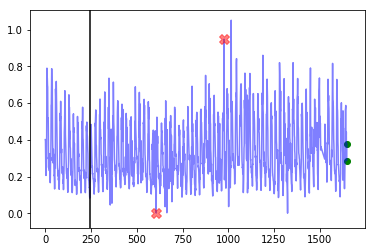




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1645, 1646]


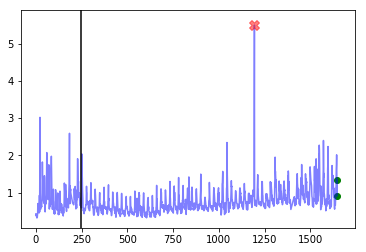




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [8782, 8783]


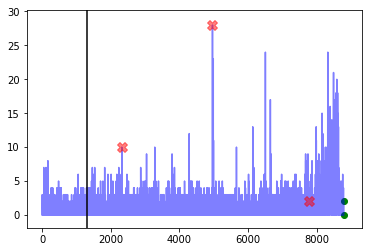




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4038, 4039]


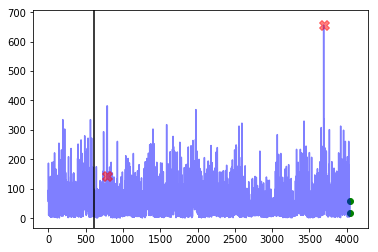




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4414, 4415]


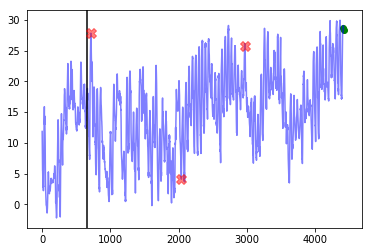




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1646, 1647]


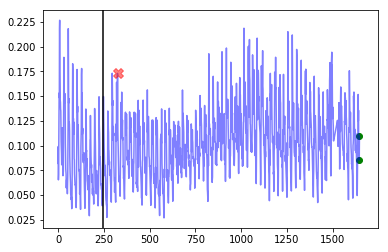




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1645, 1646]


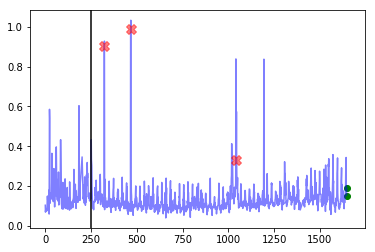




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [142, 143]


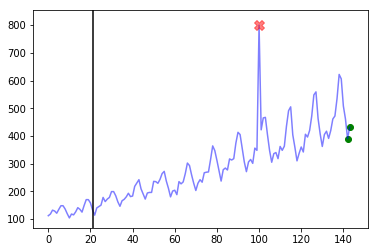




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [7886, 7887]


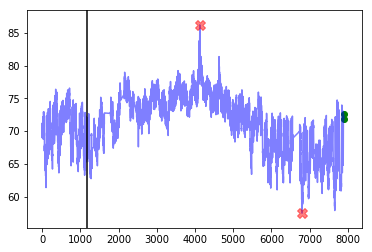

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  26.999999999999996
Best window threshold:  0.5624
Corresponding window overall precision:  0.1111111111111111
Corresponding window overall recall:  0.043478260869565216
Corresponding window overall F score:  0.0625



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  [10318, 10319]


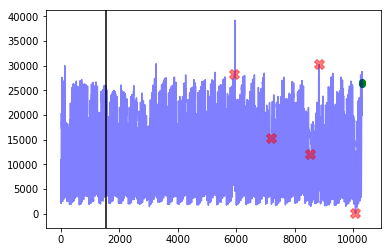




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1646, 1647]


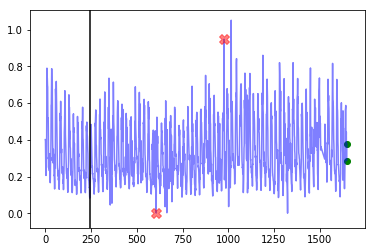




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1645, 1646]


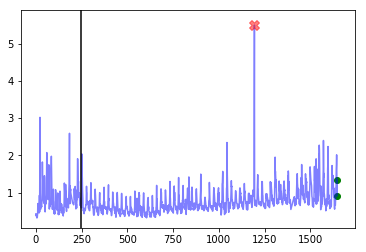




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [8782, 8783]


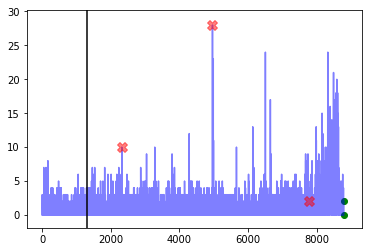




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4038, 4039]


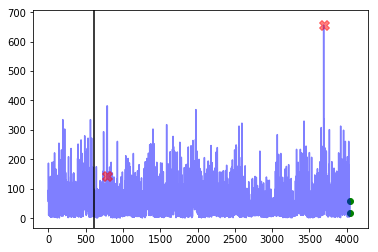




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4414, 4415]


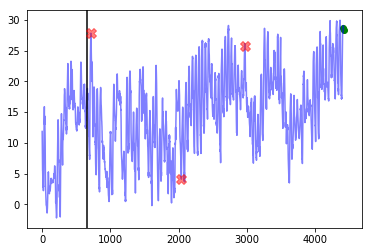




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1646, 1647]


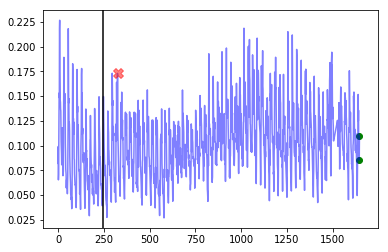




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1645, 1646]


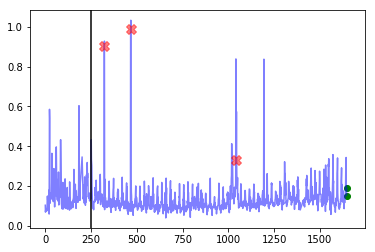




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [142, 143]


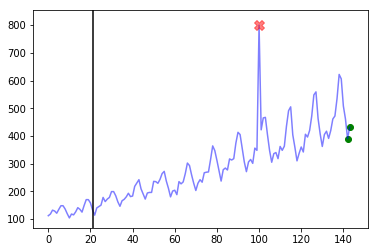




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [7886, 7887]


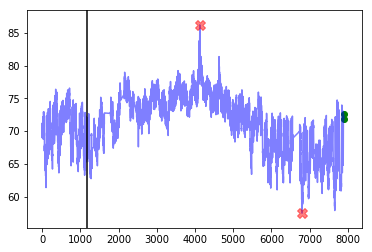

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  28.0
Best window threshold:  0.5624
Corresponding window overall precision:  0.1111111111111111
Corresponding window overall recall:  0.043478260869565216
Corresponding window overall F score:  0.0625



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  [10318, 10319]


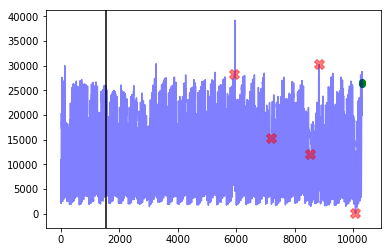




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1646, 1647]


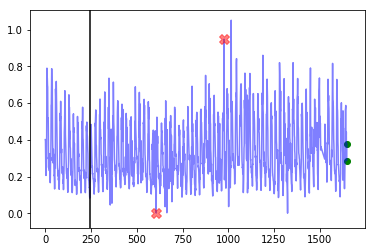




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1645, 1646]


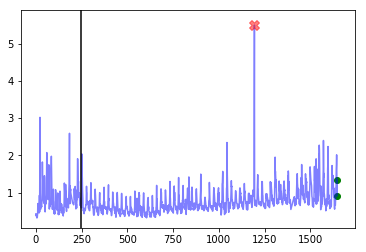




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [8782, 8783]


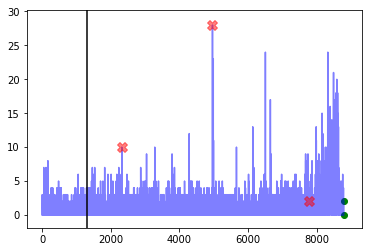




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4038, 4039]


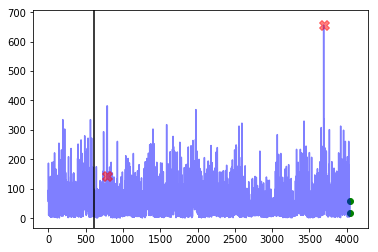




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4414, 4415]


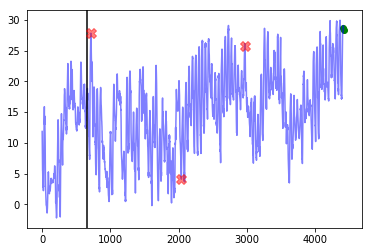




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1646, 1647]


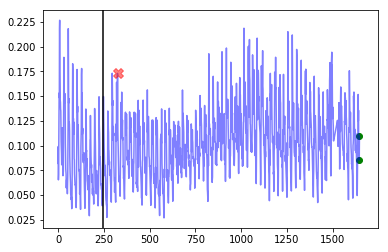




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1645, 1646]


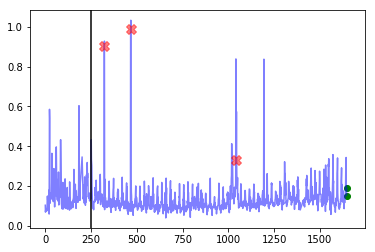




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [142, 143]


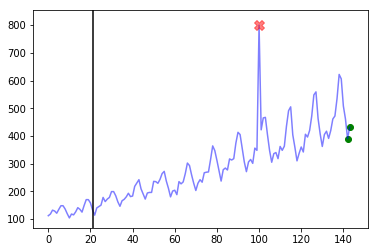




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [7886, 7887]


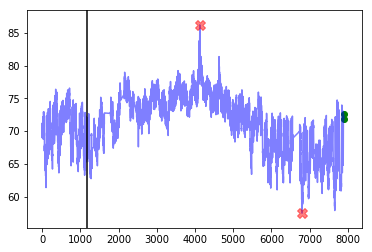

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  29.000000000000004
Best window threshold:  0.5624
Corresponding window overall precision:  0.1111111111111111
Corresponding window overall recall:  0.043478260869565216
Corresponding window overall F score:  0.0625



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  [10318, 10319]


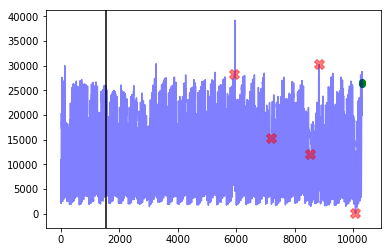




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1646, 1647]


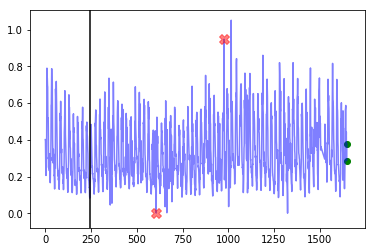




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1645, 1646]


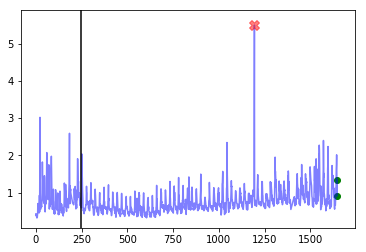




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [8782, 8783]


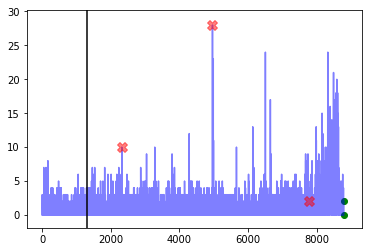




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4038, 4039]


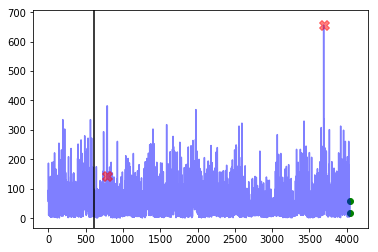




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4414, 4415]


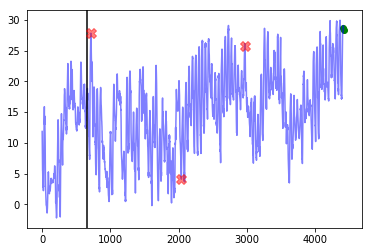




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1646, 1647]


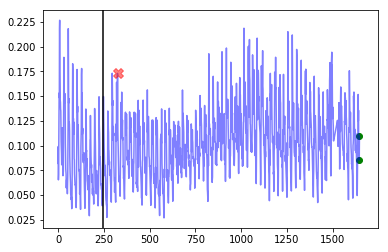




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1645, 1646]


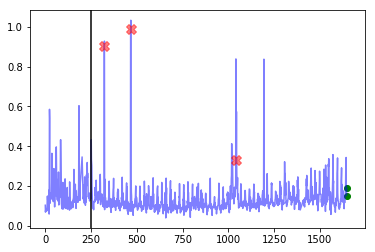




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [142, 143]


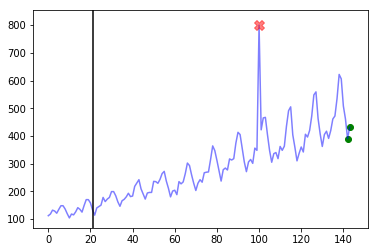




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [7886, 7887]


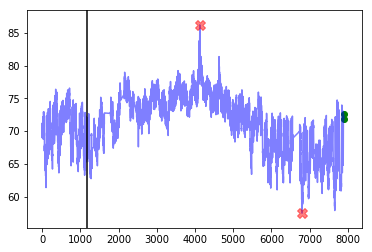

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  29.999999999999996
Best window threshold:  0.5624
Corresponding window overall precision:  0.1111111111111111
Corresponding window overall recall:  0.043478260869565216
Corresponding window overall F score:  0.0625



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  [10318, 10319]


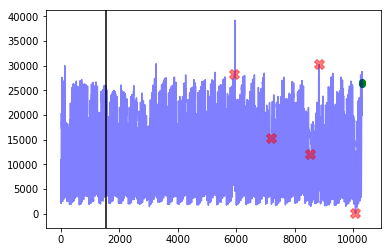




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1646, 1647]


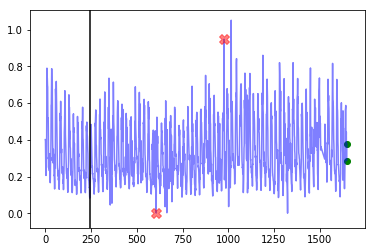




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1645, 1646]


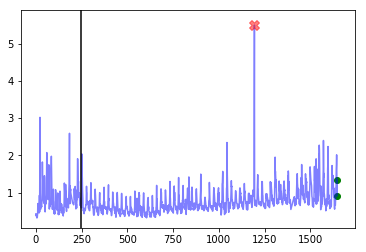




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [8782, 8783]


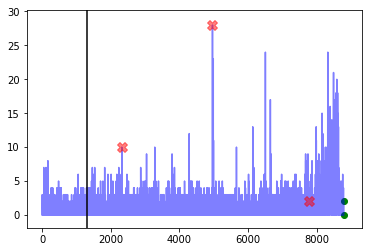




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4038, 4039]


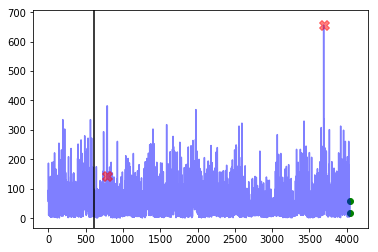




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4414, 4415]


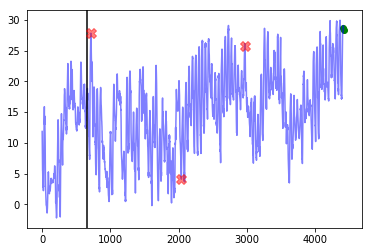




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1646, 1647]


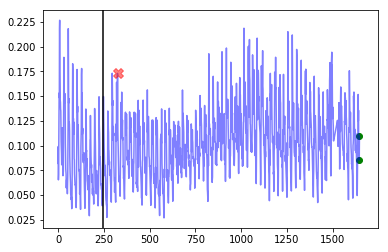




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1645, 1646]


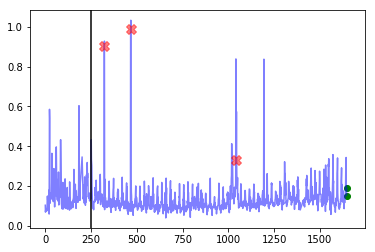




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [142, 143]


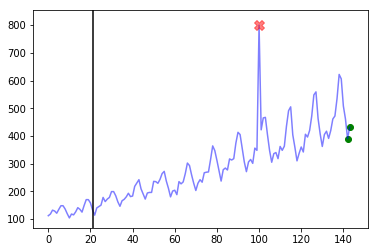




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [7886, 7887]


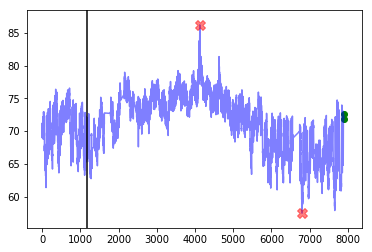

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  31.000000000000004
Best window threshold:  0.5624
Corresponding window overall precision:  0.1111111111111111
Corresponding window overall recall:  0.043478260869565216
Corresponding window overall F score:  0.0625



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  [10318, 10319]


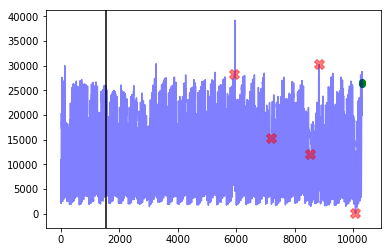




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1646, 1647]


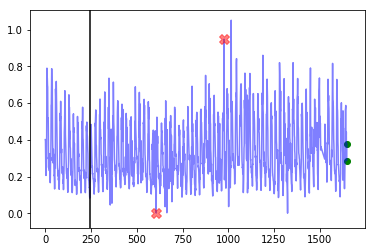




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1645, 1646]


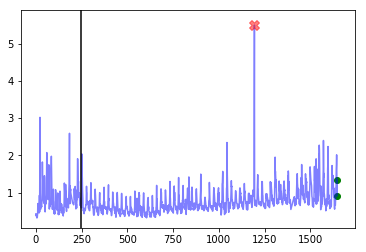




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [8782, 8783]


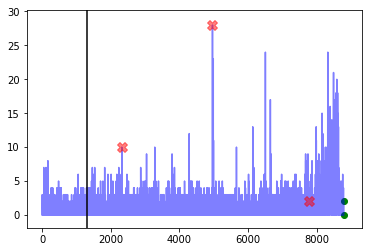




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4038, 4039]


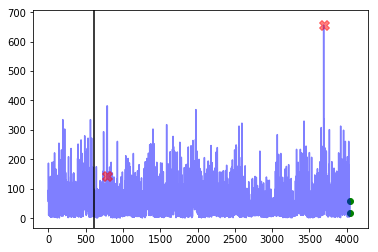




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4414, 4415]


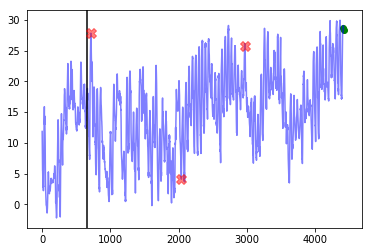




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1646, 1647]


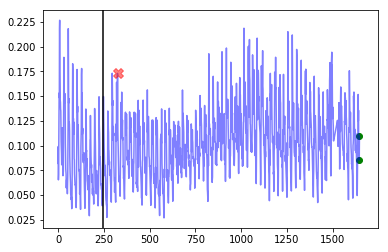




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1645, 1646]


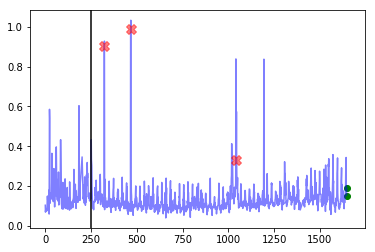




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [142, 143]


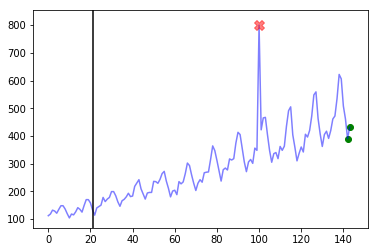




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [7886, 7887]


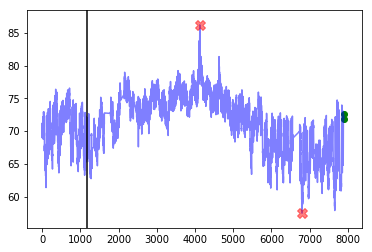

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  31.999999999999993
Best window threshold:  0.5624
Corresponding window overall precision:  0.1111111111111111
Corresponding window overall recall:  0.043478260869565216
Corresponding window overall F score:  0.0625



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  [10318, 10319]


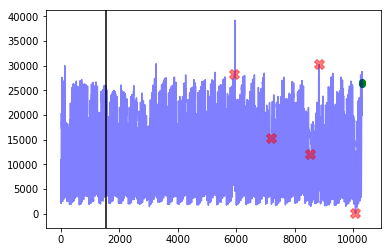




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1646, 1647]


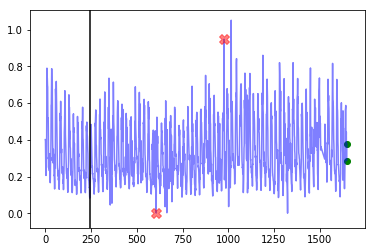




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1645, 1646]


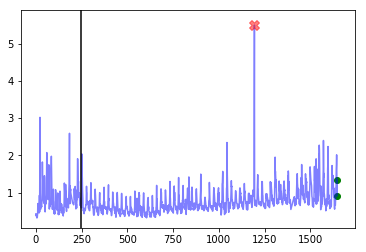




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [8782, 8783]


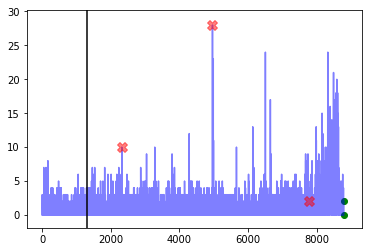




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4038, 4039]


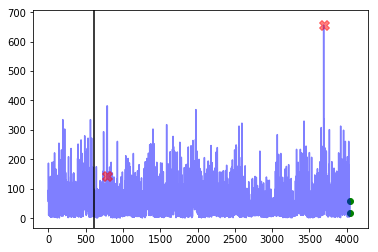




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4414, 4415]


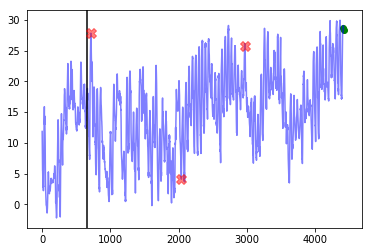




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1646, 1647]


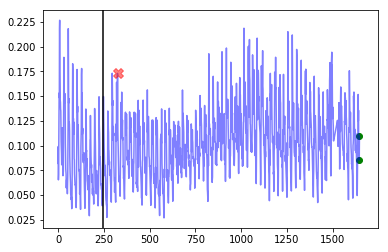




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1645, 1646]


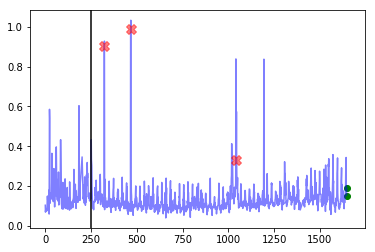




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [142, 143]


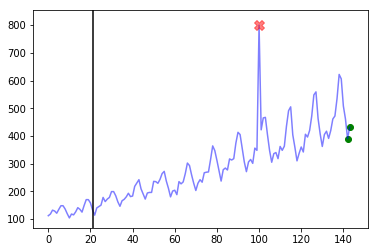




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [7886, 7887]


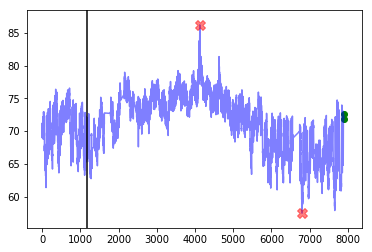

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  33.0
Best window threshold:  0.5624
Corresponding window overall precision:  0.1111111111111111
Corresponding window overall recall:  0.043478260869565216
Corresponding window overall F score:  0.0625



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  [10318, 10319]


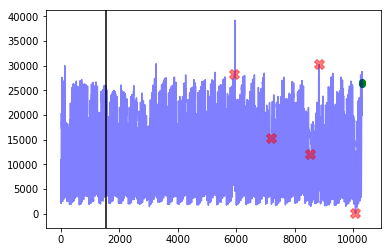




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1646, 1647]


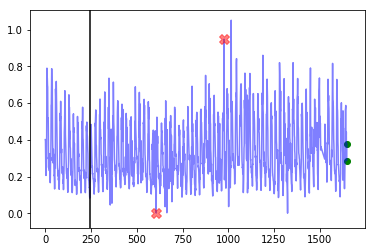




--- exchange-3_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1645, 1646]


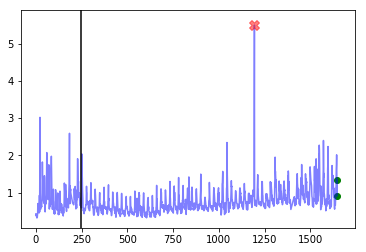




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [8782, 8783]


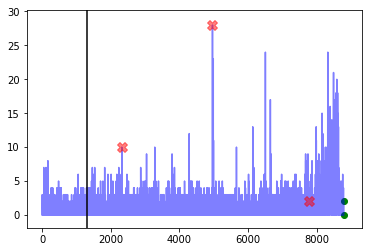




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [4038, 4039]


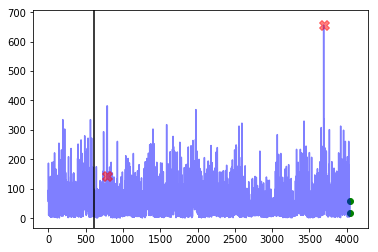




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4414, 4415]


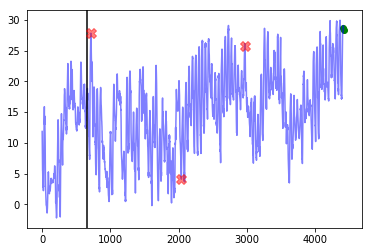




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1646, 1647]


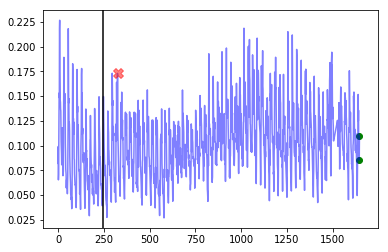




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1645, 1646]


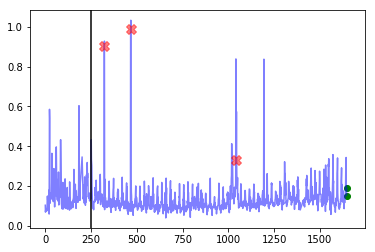




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [142, 143]


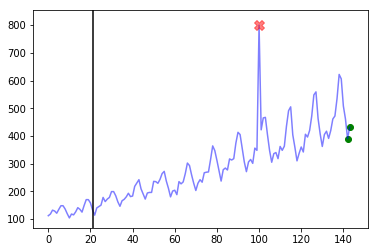




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [7886, 7887]


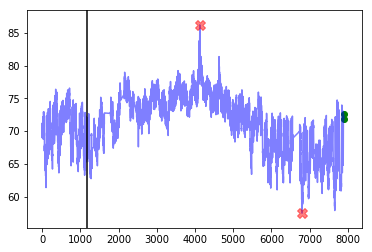

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 17.800000000000004
	 Best window threshold : 0.0
	 Corresponding window overall precision : 0.11330049261083744
	 Corresponding window overall recall : 1.0
	 Corresponding window overall F score : 0.20353982300884957
False Positive Weight:  0.2
	 Minimum number of mistakes : 24.999999999999996
	 Best window threshold : 0.5285
	 Corresponding window overall precision : 0.1111111111111111
	 Corresponding window overall recall : 0.043478260869565216
	 Corresponding window overall F score : 0.0625
False Positive Weight:  0.3
	 Minimum number of mistakes : 26.000000000000004
	 Best window threshold : 0.5624
	 Corresponding window overall precision : 0.1111111111111111
	 Corresponding window overall recall : 0.043478260869565216
	 Corresponding window overall F score : 0.0625
False Positive Weight:  0.4
	 Minimum number of mistakes : 26.999999999999996
	 Best window threshold : 0.5624
	 Corresponding window overall preci

In [30]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# windowed gaussian Results

In [31]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_htm = joblib.load("anomaly_scores" + window_size + "/windowed_gaussian/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_htm["Anomaly Scores"]

In [32]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.2: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.3: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.4: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.5: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.6: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.7: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.8: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.9: {'precision': 0.1111111111111111, 'recall': 1.0},
 1.0: {'precision': 0.5, 'recall': 0.5}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  14.000000000000004
Best window threshold:  0.9997
Corresponding window overall precision:  0.15151515151515152
Corresponding window overall recall:  0.6521739130434783
Corresponding window overall F score:  0.2459016393442623



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


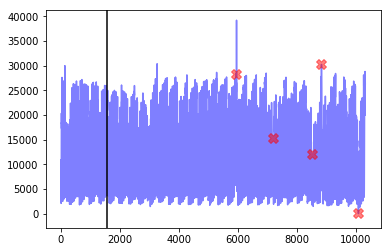




--- exchange-2_cpm_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.5
Corresponding window false positives:  2
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [876, 977, 1016]


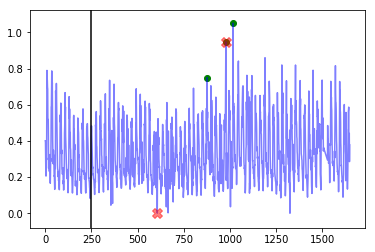




--- exchange-3_cpm_results ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [660, 733, 780, 836, 901, 1020, 1021, 1044, 1045, 1046, 1193, 1194, 1307, 1531, 1546, 1547, 1548, 1549, 1571, 1572, 1596, 1643]


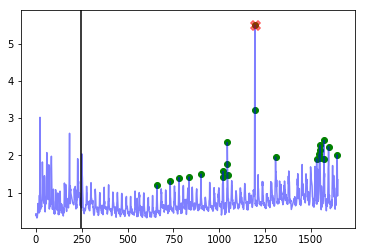




--- all_data_gift_certificates ---
Corresponding window precision:  0.125
Corresponding window recall:  1.0
Corresponding window false positives:  21
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1318, 1438, 1462, 1483, 1487, 1505, 1531, 1702, 1770, 1820, 1822, 1918, 2009, 2059, 2157, 2176, 2233, 2276, 2304, 2320, 2443, 2469, 2471, 2488, 2491, 2514, 2851, 2871, 2894, 2899, 2905, 2949, 2974, 3014, 3016, 3024, 3042, 3053, 3123, 3281, 3664, 3688, 3785, 3790, 3805, 3810, 3841, 3842, 3855, 3867, 3963, 3988, 4002, 4006, 4023, 4286, 4341, 4367, 4516, 4578, 4946, 4961, 4963, 4986, 4987, 4989, 4992, 5008, 5009, 5013, 5055, 5058, 5155, 5206, 5632, 5637, 5662, 5733, 5905, 5924, 6014, 6019, 6137, 6164, 6167, 6353, 6375, 6406, 6471, 6505, 6522, 6650, 6666, 6669, 7073, 7100, 7169, 7317, 7318, 7366, 7396, 7505, 7655, 7656, 7677, 7679, 7680, 7696, 7720, 7723, 7746, 7818, 7823, 7838, 7864, 7871, 7985, 7987, 7989, 8009, 8010, 8015, 8017, 8059, 80

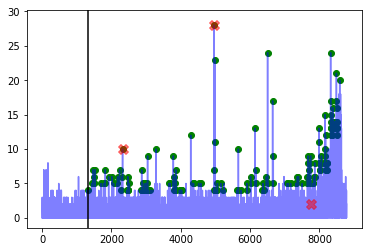




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  10
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [741, 783, 786, 790, 791, 1359, 1374, 1388, 1403, 1418, 1586, 1672, 1978, 1979, 2551, 2556, 2595, 2836, 3069, 3087, 3116, 3327, 3349, 3378, 3395, 3419, 3427, 3455, 3658, 3677, 3690, 3691, 3693, 3703, 3707, 3918]


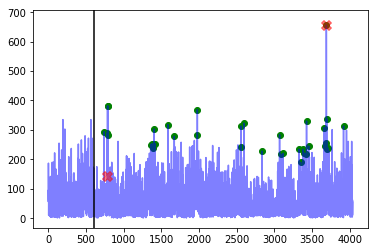




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.42857142857142855
Corresponding window recall:  1.0
Corresponding window false positives:  4
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [710, 711, 712, 713, 714, 715, 716, 717, 1042, 1043, 1044, 1045, 1046, 1047, 1048, 1049, 1050, 1051, 1052, 1053, 1054, 1055, 1056, 1057, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1104, 1105, 1106, 1107, 1108, 1109, 1110, 1111, 1112, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1125, 1126, 1127, 2004, 2005, 3088, 3091, 3092, 3093, 3094, 3095, 3252, 3253, 3254, 3255, 3256, 3257, 3258, 3259, 3260, 3261, 3262, 3301, 3302, 3303, 3304, 3305, 3306, 3307, 3308, 3309, 3310, 3605, 3606, 3607, 3608, 3609, 3610, 3611, 3612, 3613, 3614, 3615, 3616, 3617, 3618, 3619, 3620, 3621, 3622, 3623, 3624]


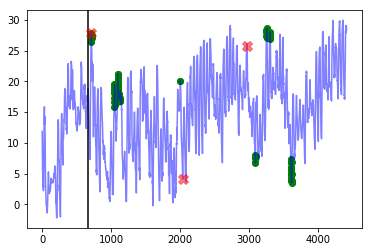




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [824, 896, 920, 1016]


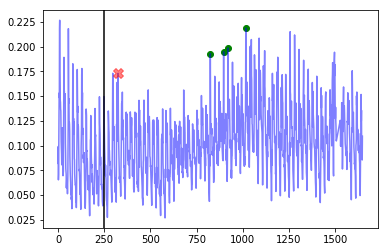




--- exchange-3_cpc_results ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  9
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [251, 322, 323, 466, 467, 660, 901, 1016, 1017, 1018, 1019, 1020, 1022, 1023, 1041, 1042, 1043, 1044, 1045, 1194, 1452, 1531, 1546, 1548, 1549, 1571, 1596]


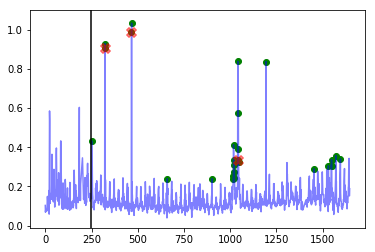




--- international-airline-passengers ---
Corresponding window precision:  0.25
Corresponding window recall:  1.0
Corresponding window false positives:  3
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100, 114, 115, 125, 126, 127, 136, 137, 138, 139, 140]


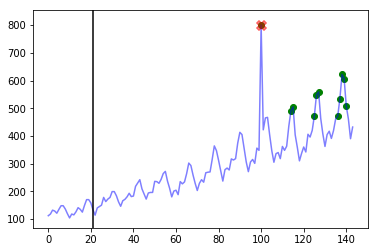




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.125
Corresponding window recall:  1.0
Corresponding window false positives:  14
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1505, 1507, 1828, 1830, 1832, 1833, 1834, 1854, 1855, 1856, 1857, 1858, 1859, 1860, 1861, 1862, 1863, 1864, 1865, 1866, 1867, 1868, 1869, 1870, 1871, 1872, 1873, 1874, 1875, 1876, 1877, 1878, 1879, 1880, 1881, 1882, 1883, 1884, 1885, 1886, 1887, 1888, 1889, 1890, 1891, 1894, 1896, 1897, 1898, 1899, 1900, 1901, 1902, 1903, 1904, 1905, 1906, 1907, 1908, 1909, 1910, 1911, 1912, 1913, 1914, 1915, 1916, 1917, 1918, 1919, 1920, 1921, 1922, 1923, 1924, 1925, 1926, 1927, 2159, 2308, 2309, 2310, 2314, 2316, 2317, 2518, 2526, 2527, 2606, 2686, 2879, 2881, 2883, 2886, 2887, 2925, 3108, 3109, 3297, 3355, 3357, 3358, 3359, 3360, 3552, 3555, 3557, 3631, 3933, 3936, 3938, 3956, 3959, 3960, 3961, 3962, 3963, 3964, 4100, 4101, 4102, 4103, 4104, 

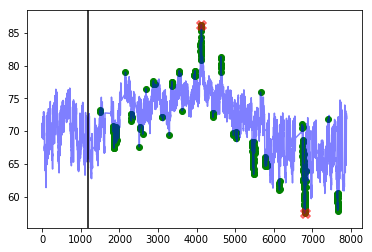

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  17.2
Best window threshold:  1.0
Corresponding window overall precision:  0.4
Corresponding window overall recall:  0.34782608695652173
Corresponding window overall F score:  0.37209302325581395



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


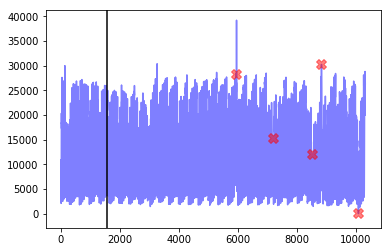




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


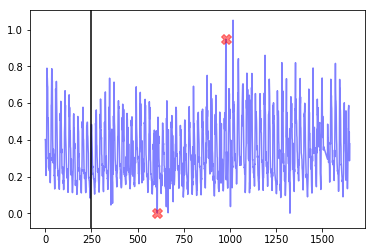




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


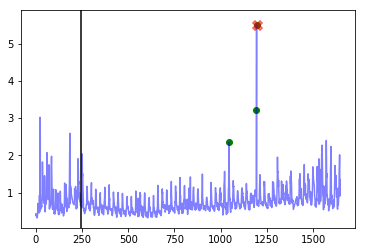




--- all_data_gift_certificates ---
Corresponding window precision:  0.18181818181818182
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 3042, 3785, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 8157, 8324]


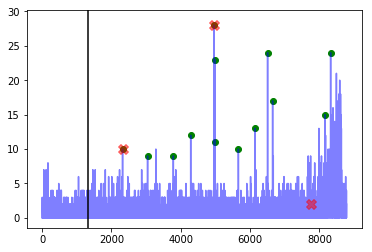




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


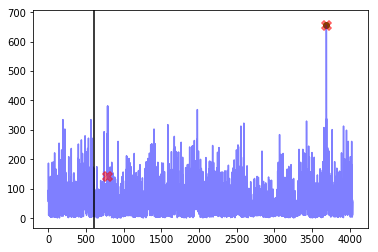




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


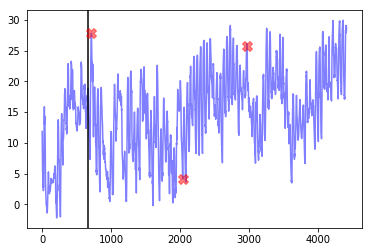




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


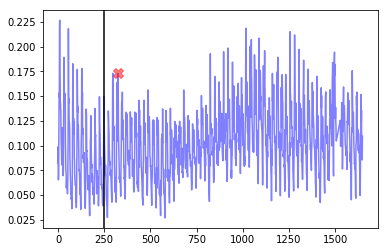




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 467, 1018, 1041]


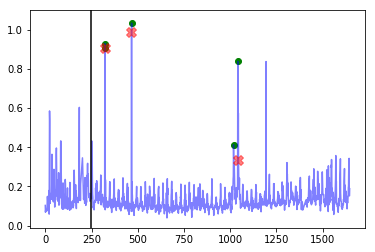




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


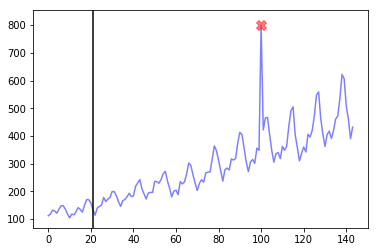




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1858, 1859, 1860, 1861, 1863, 1866, 6743, 6744, 6745, 6746, 6747, 6748, 6749, 6750, 6751, 6752, 6753, 6754, 6755, 6767, 6769, 6770, 6771, 6772, 6773, 6774, 6775, 6776, 6777, 6778, 6779, 6780, 6781, 6782, 6783, 6784, 6785, 6786, 6787, 6788, 6789, 6790, 6791, 6792, 6793, 6794, 6795, 6796, 6797, 6798, 6799, 6800, 6801, 6802, 6803, 6804, 6805, 6806, 6807, 6808, 6809, 6810, 6811, 6812, 6813, 6814, 6815, 6816, 6817, 6818, 6819, 6820, 6821, 6822, 6823, 6824, 6825, 6826, 6827]


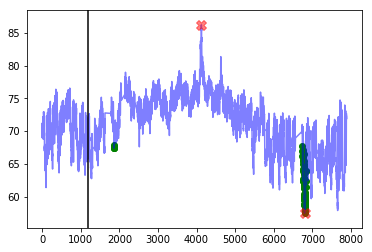

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  18.3
Best window threshold:  1.0
Corresponding window overall precision:  0.4
Corresponding window overall recall:  0.34782608695652173
Corresponding window overall F score:  0.37209302325581395



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


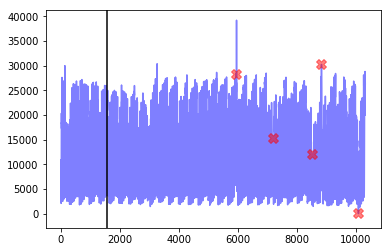




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


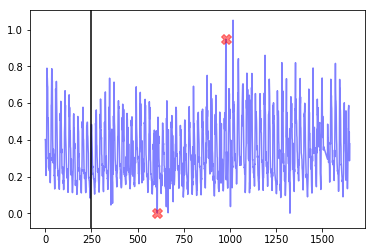




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


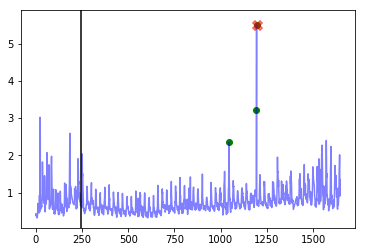




--- all_data_gift_certificates ---
Corresponding window precision:  0.18181818181818182
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 3042, 3785, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 8157, 8324]


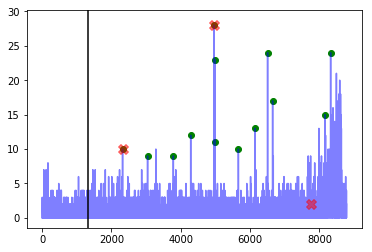




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


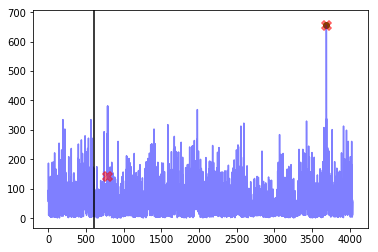




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


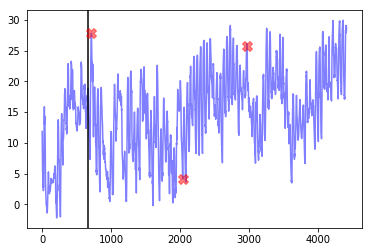




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


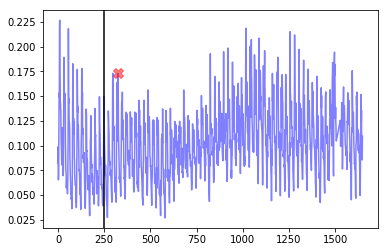




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 467, 1018, 1041]


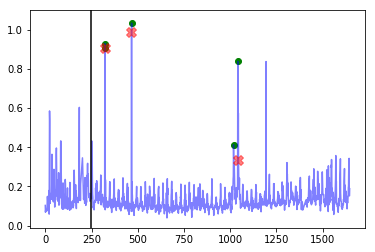




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


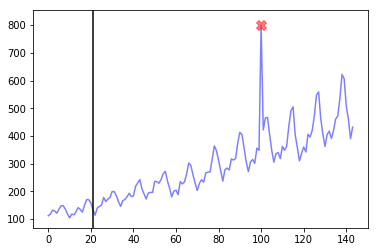




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1858, 1859, 1860, 1861, 1863, 1866, 6743, 6744, 6745, 6746, 6747, 6748, 6749, 6750, 6751, 6752, 6753, 6754, 6755, 6767, 6769, 6770, 6771, 6772, 6773, 6774, 6775, 6776, 6777, 6778, 6779, 6780, 6781, 6782, 6783, 6784, 6785, 6786, 6787, 6788, 6789, 6790, 6791, 6792, 6793, 6794, 6795, 6796, 6797, 6798, 6799, 6800, 6801, 6802, 6803, 6804, 6805, 6806, 6807, 6808, 6809, 6810, 6811, 6812, 6813, 6814, 6815, 6816, 6817, 6818, 6819, 6820, 6821, 6822, 6823, 6824, 6825, 6826, 6827]


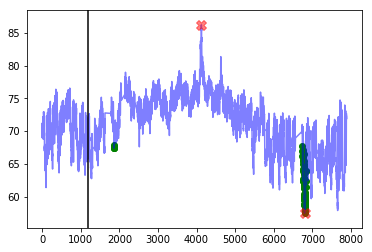

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.4
Best window threshold:  1.0
Corresponding window overall precision:  0.4
Corresponding window overall recall:  0.34782608695652173
Corresponding window overall F score:  0.37209302325581395



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


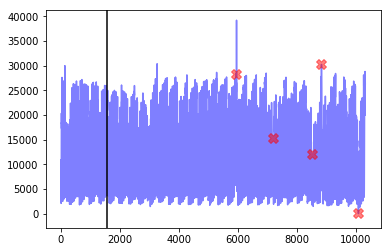




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


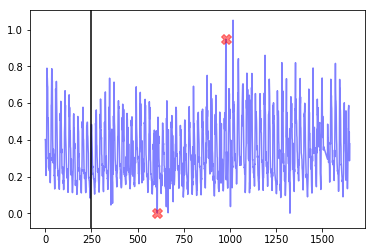




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


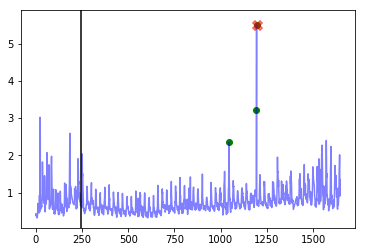




--- all_data_gift_certificates ---
Corresponding window precision:  0.18181818181818182
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 3042, 3785, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 8157, 8324]


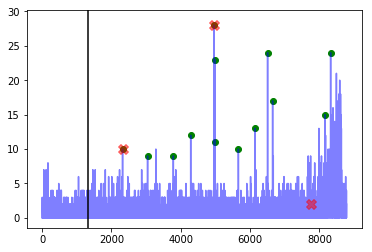




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


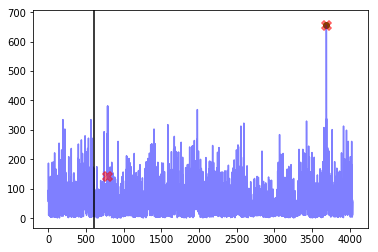




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


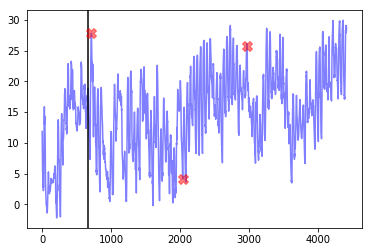




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


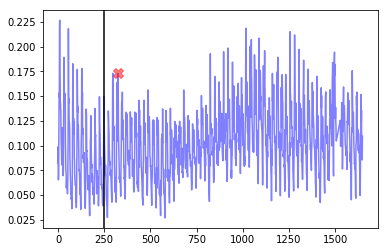




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 467, 1018, 1041]


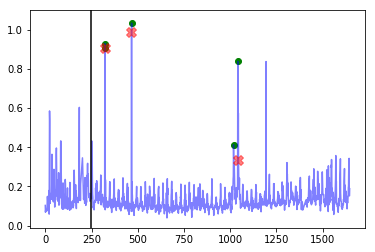




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


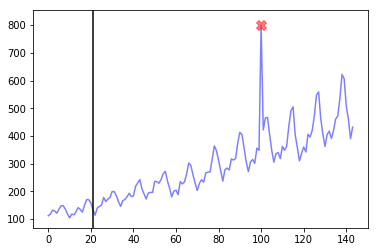




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1858, 1859, 1860, 1861, 1863, 1866, 6743, 6744, 6745, 6746, 6747, 6748, 6749, 6750, 6751, 6752, 6753, 6754, 6755, 6767, 6769, 6770, 6771, 6772, 6773, 6774, 6775, 6776, 6777, 6778, 6779, 6780, 6781, 6782, 6783, 6784, 6785, 6786, 6787, 6788, 6789, 6790, 6791, 6792, 6793, 6794, 6795, 6796, 6797, 6798, 6799, 6800, 6801, 6802, 6803, 6804, 6805, 6806, 6807, 6808, 6809, 6810, 6811, 6812, 6813, 6814, 6815, 6816, 6817, 6818, 6819, 6820, 6821, 6822, 6823, 6824, 6825, 6826, 6827]


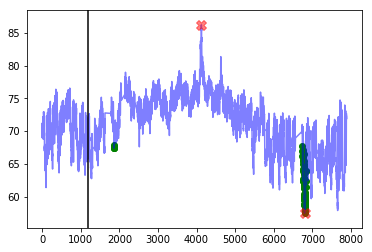

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.5
Best window threshold:  1.0
Corresponding window overall precision:  0.4
Corresponding window overall recall:  0.34782608695652173
Corresponding window overall F score:  0.37209302325581395



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


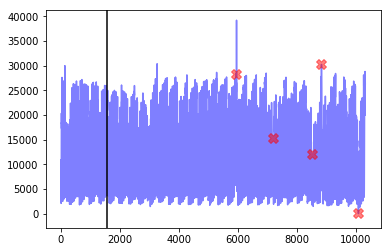




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


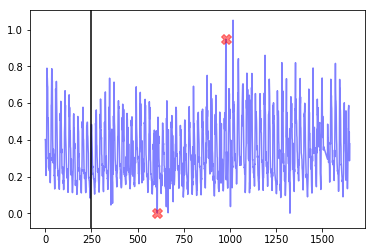




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


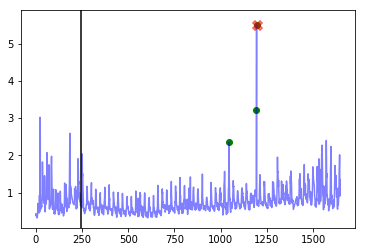




--- all_data_gift_certificates ---
Corresponding window precision:  0.18181818181818182
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 3042, 3785, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 8157, 8324]


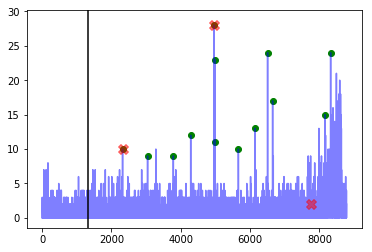




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


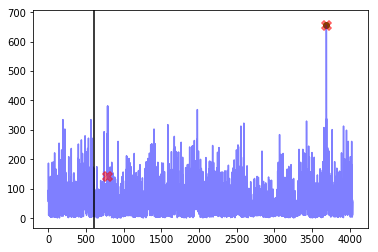




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


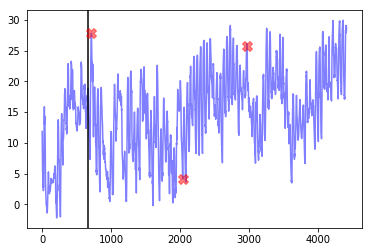




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


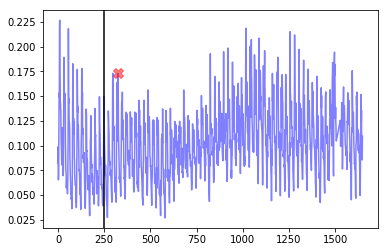




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 467, 1018, 1041]


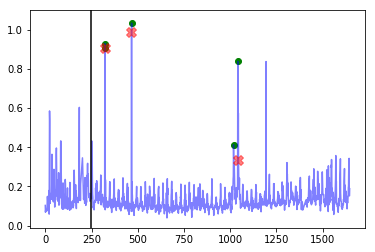




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


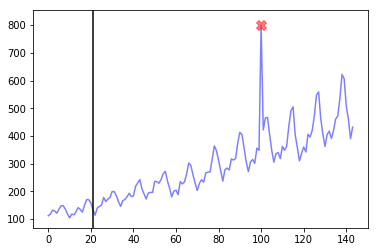




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1858, 1859, 1860, 1861, 1863, 1866, 6743, 6744, 6745, 6746, 6747, 6748, 6749, 6750, 6751, 6752, 6753, 6754, 6755, 6767, 6769, 6770, 6771, 6772, 6773, 6774, 6775, 6776, 6777, 6778, 6779, 6780, 6781, 6782, 6783, 6784, 6785, 6786, 6787, 6788, 6789, 6790, 6791, 6792, 6793, 6794, 6795, 6796, 6797, 6798, 6799, 6800, 6801, 6802, 6803, 6804, 6805, 6806, 6807, 6808, 6809, 6810, 6811, 6812, 6813, 6814, 6815, 6816, 6817, 6818, 6819, 6820, 6821, 6822, 6823, 6824, 6825, 6826, 6827]


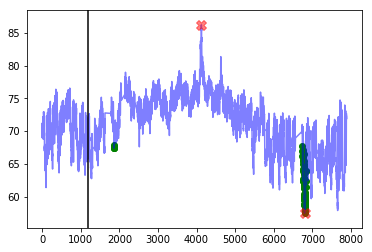

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.6
Best window threshold:  1.0
Corresponding window overall precision:  0.4
Corresponding window overall recall:  0.34782608695652173
Corresponding window overall F score:  0.37209302325581395



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


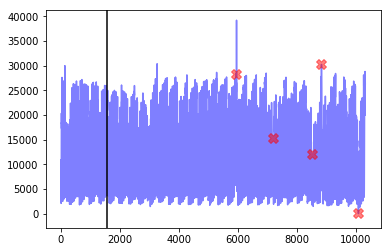




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


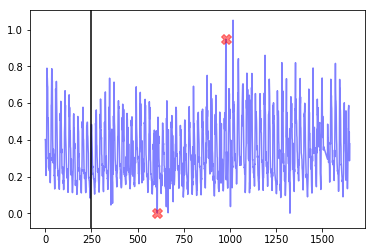




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


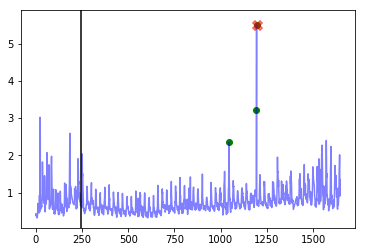




--- all_data_gift_certificates ---
Corresponding window precision:  0.18181818181818182
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 3042, 3785, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 8157, 8324]


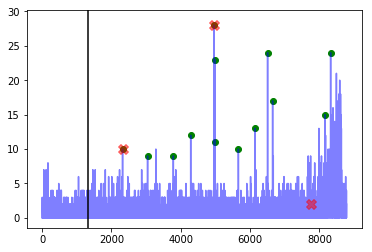




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


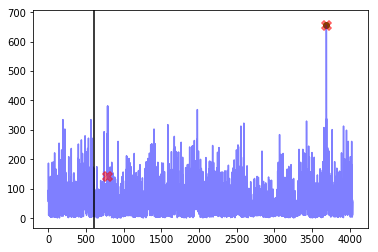




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


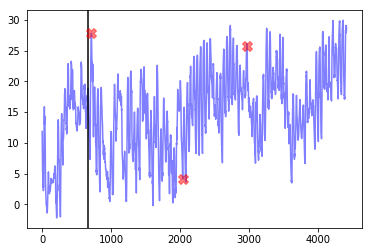




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


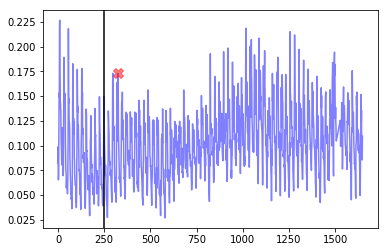




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 467, 1018, 1041]


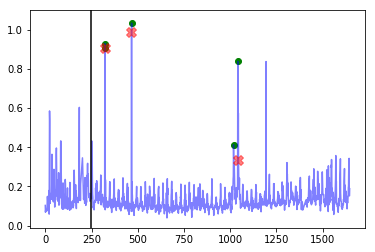




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


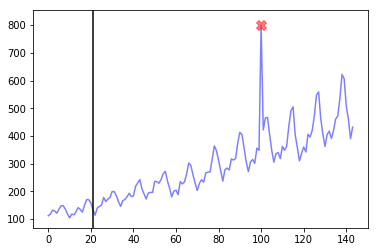




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1858, 1859, 1860, 1861, 1863, 1866, 6743, 6744, 6745, 6746, 6747, 6748, 6749, 6750, 6751, 6752, 6753, 6754, 6755, 6767, 6769, 6770, 6771, 6772, 6773, 6774, 6775, 6776, 6777, 6778, 6779, 6780, 6781, 6782, 6783, 6784, 6785, 6786, 6787, 6788, 6789, 6790, 6791, 6792, 6793, 6794, 6795, 6796, 6797, 6798, 6799, 6800, 6801, 6802, 6803, 6804, 6805, 6806, 6807, 6808, 6809, 6810, 6811, 6812, 6813, 6814, 6815, 6816, 6817, 6818, 6819, 6820, 6821, 6822, 6823, 6824, 6825, 6826, 6827]


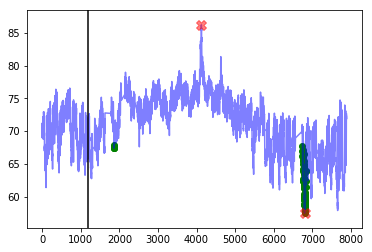

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  22.7
Best window threshold:  1.0
Corresponding window overall precision:  0.4
Corresponding window overall recall:  0.34782608695652173
Corresponding window overall F score:  0.37209302325581395



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


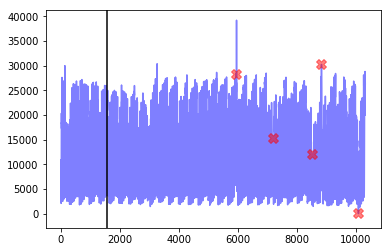




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


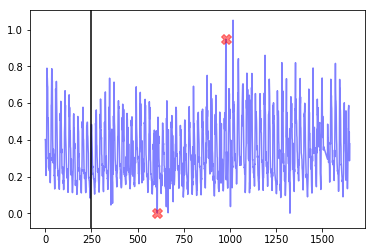




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


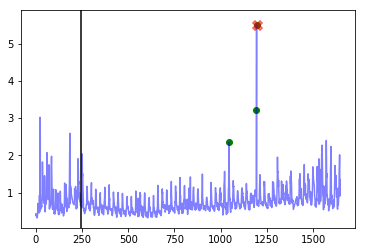




--- all_data_gift_certificates ---
Corresponding window precision:  0.18181818181818182
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 3042, 3785, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 8157, 8324]


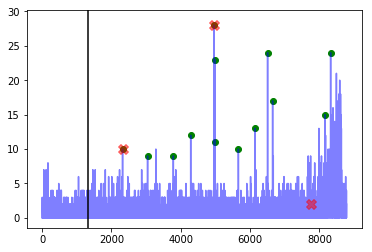




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


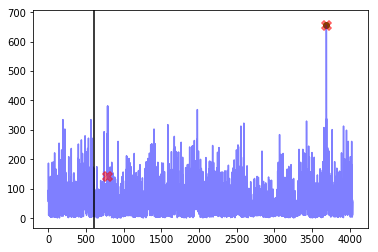




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


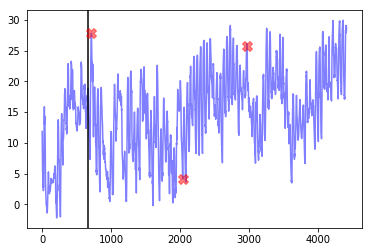




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


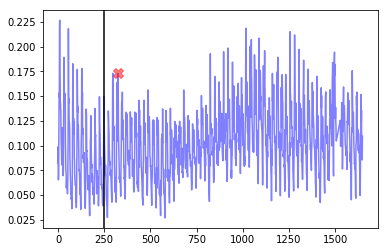




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 467, 1018, 1041]


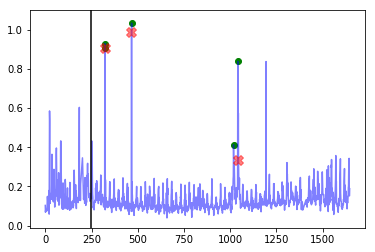




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


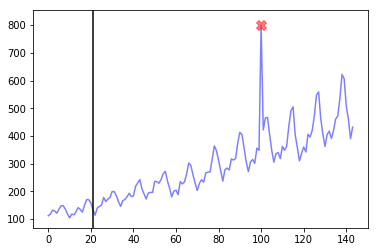




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1858, 1859, 1860, 1861, 1863, 1866, 6743, 6744, 6745, 6746, 6747, 6748, 6749, 6750, 6751, 6752, 6753, 6754, 6755, 6767, 6769, 6770, 6771, 6772, 6773, 6774, 6775, 6776, 6777, 6778, 6779, 6780, 6781, 6782, 6783, 6784, 6785, 6786, 6787, 6788, 6789, 6790, 6791, 6792, 6793, 6794, 6795, 6796, 6797, 6798, 6799, 6800, 6801, 6802, 6803, 6804, 6805, 6806, 6807, 6808, 6809, 6810, 6811, 6812, 6813, 6814, 6815, 6816, 6817, 6818, 6819, 6820, 6821, 6822, 6823, 6824, 6825, 6826, 6827]


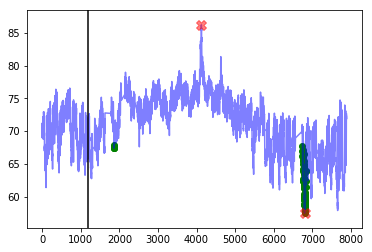

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  23.8
Best window threshold:  1.0
Corresponding window overall precision:  0.4
Corresponding window overall recall:  0.34782608695652173
Corresponding window overall F score:  0.37209302325581395



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


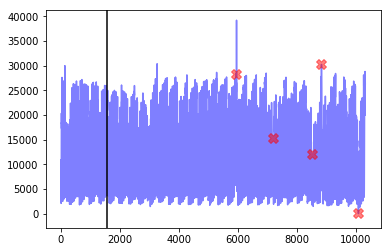




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


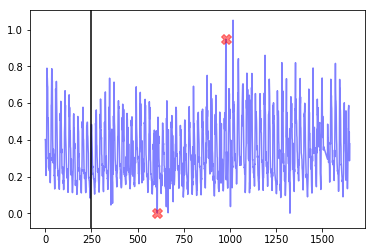




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


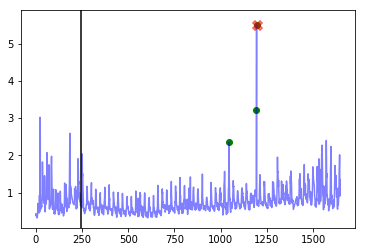




--- all_data_gift_certificates ---
Corresponding window precision:  0.18181818181818182
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 3042, 3785, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 8157, 8324]


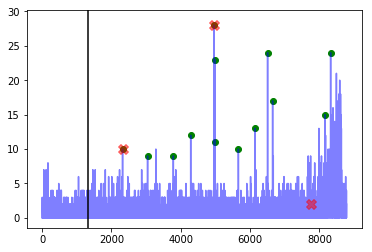




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


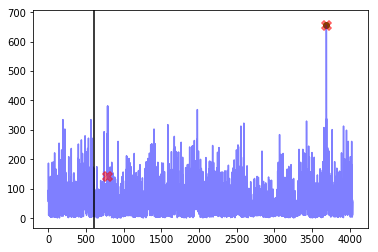




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


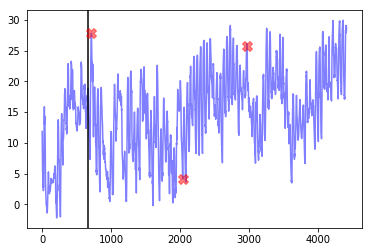




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


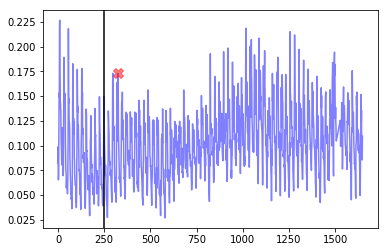




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 467, 1018, 1041]


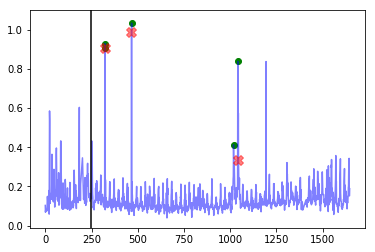




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


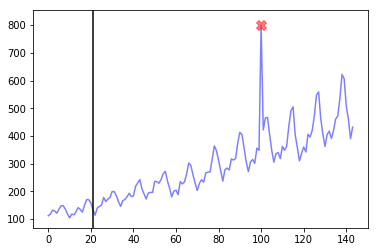




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1858, 1859, 1860, 1861, 1863, 1866, 6743, 6744, 6745, 6746, 6747, 6748, 6749, 6750, 6751, 6752, 6753, 6754, 6755, 6767, 6769, 6770, 6771, 6772, 6773, 6774, 6775, 6776, 6777, 6778, 6779, 6780, 6781, 6782, 6783, 6784, 6785, 6786, 6787, 6788, 6789, 6790, 6791, 6792, 6793, 6794, 6795, 6796, 6797, 6798, 6799, 6800, 6801, 6802, 6803, 6804, 6805, 6806, 6807, 6808, 6809, 6810, 6811, 6812, 6813, 6814, 6815, 6816, 6817, 6818, 6819, 6820, 6821, 6822, 6823, 6824, 6825, 6826, 6827]


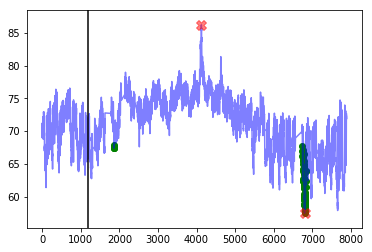

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  24.9
Best window threshold:  1.0
Corresponding window overall precision:  0.4
Corresponding window overall recall:  0.34782608695652173
Corresponding window overall F score:  0.37209302325581395



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


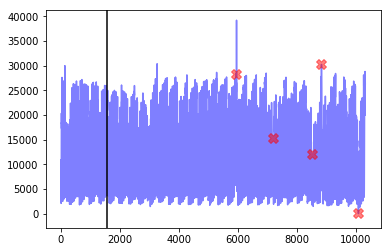




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


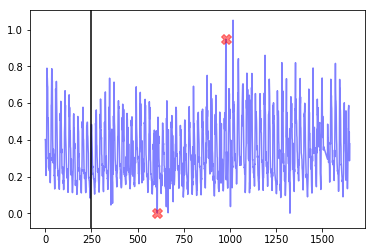




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


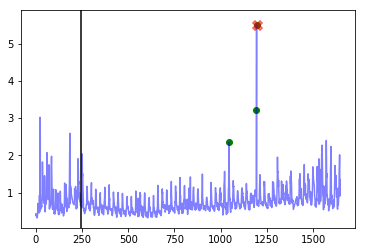




--- all_data_gift_certificates ---
Corresponding window precision:  0.18181818181818182
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 3042, 3785, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 8157, 8324]


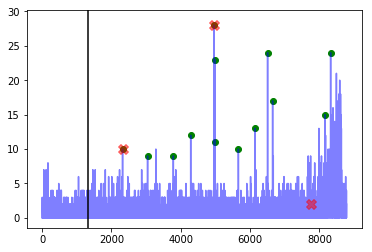




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


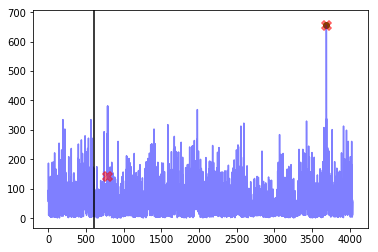




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


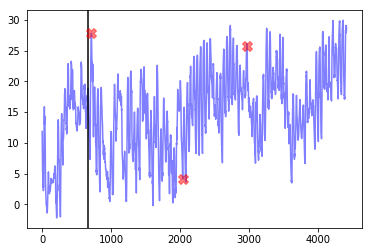




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


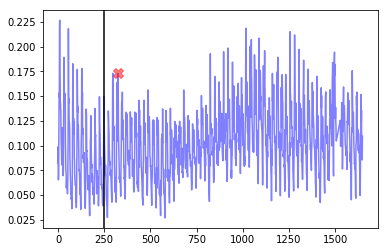




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 467, 1018, 1041]


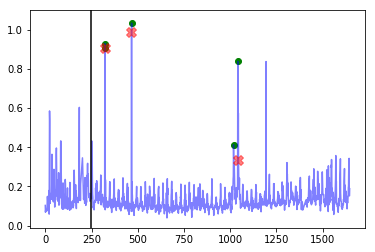




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


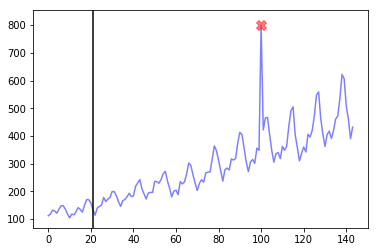




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1858, 1859, 1860, 1861, 1863, 1866, 6743, 6744, 6745, 6746, 6747, 6748, 6749, 6750, 6751, 6752, 6753, 6754, 6755, 6767, 6769, 6770, 6771, 6772, 6773, 6774, 6775, 6776, 6777, 6778, 6779, 6780, 6781, 6782, 6783, 6784, 6785, 6786, 6787, 6788, 6789, 6790, 6791, 6792, 6793, 6794, 6795, 6796, 6797, 6798, 6799, 6800, 6801, 6802, 6803, 6804, 6805, 6806, 6807, 6808, 6809, 6810, 6811, 6812, 6813, 6814, 6815, 6816, 6817, 6818, 6819, 6820, 6821, 6822, 6823, 6824, 6825, 6826, 6827]


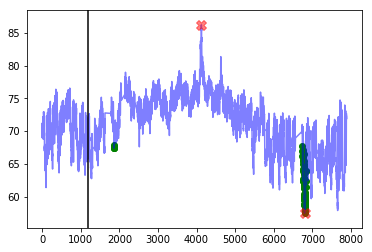

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  26.0
Best window threshold:  1.0
Corresponding window overall precision:  0.4
Corresponding window overall recall:  0.34782608695652173
Corresponding window overall F score:  0.37209302325581395



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


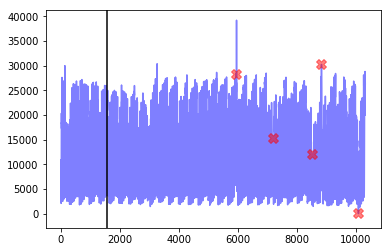




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


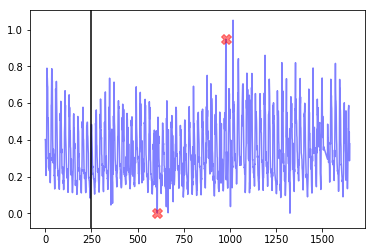




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


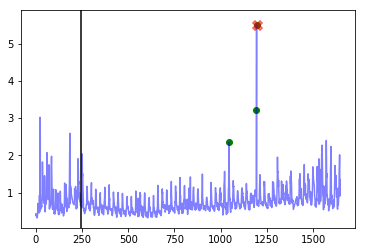




--- all_data_gift_certificates ---
Corresponding window precision:  0.18181818181818182
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 3042, 3785, 4286, 4963, 4986, 4992, 5662, 6137, 6505, 6650, 8157, 8324]


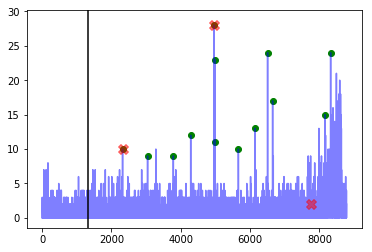




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


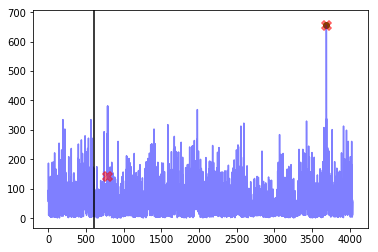




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


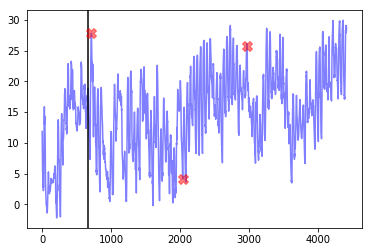




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


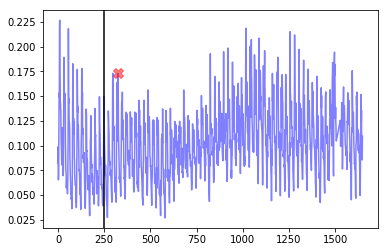




--- exchange-3_cpc_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 467, 1018, 1041]


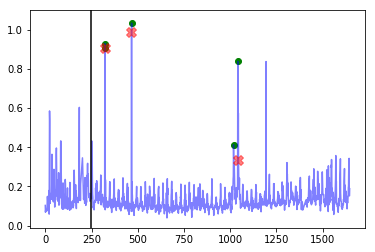




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


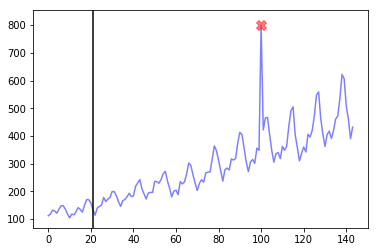




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.5
Corresponding window recall:  0.5
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1858, 1859, 1860, 1861, 1863, 1866, 6743, 6744, 6745, 6746, 6747, 6748, 6749, 6750, 6751, 6752, 6753, 6754, 6755, 6767, 6769, 6770, 6771, 6772, 6773, 6774, 6775, 6776, 6777, 6778, 6779, 6780, 6781, 6782, 6783, 6784, 6785, 6786, 6787, 6788, 6789, 6790, 6791, 6792, 6793, 6794, 6795, 6796, 6797, 6798, 6799, 6800, 6801, 6802, 6803, 6804, 6805, 6806, 6807, 6808, 6809, 6810, 6811, 6812, 6813, 6814, 6815, 6816, 6817, 6818, 6819, 6820, 6821, 6822, 6823, 6824, 6825, 6826, 6827]


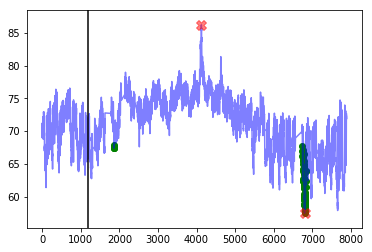

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 14.000000000000004
	 Best window threshold : 0.9997
	 Corresponding window overall precision : 0.15151515151515152
	 Corresponding window overall recall : 0.6521739130434783
	 Corresponding window overall F score : 0.2459016393442623
False Positive Weight:  0.2
	 Minimum number of mistakes : 17.2
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.4
	 Corresponding window overall recall : 0.34782608695652173
	 Corresponding window overall F score : 0.37209302325581395
False Positive Weight:  0.3
	 Minimum number of mistakes : 18.3
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.4
	 Corresponding window overall recall : 0.34782608695652173
	 Corresponding window overall F score : 0.37209302325581395
False Positive Weight:  0.4
	 Minimum number of mistakes : 19.4
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.4
	 Corresponding window overal

In [33]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# HOTSAX Results

In [65]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_htm = joblib.load("anomaly_scores" + window_size + "/hotsax/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_htm["Anomaly Scores"]

In [66]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.1, 'recall': 0.5},
 0.2: {'precision': 0.1, 'recall': 0.5},
 0.3: {'precision': 0.1, 'recall': 0.5},
 0.4: {'precision': 0.1, 'recall': 0.5},
 0.5: {'precision': 0.1, 'recall': 0.5},
 0.6: {'precision': 0.1, 'recall': 0.5},
 0.7: {'precision': 0.1, 'recall': 0.5},
 0.8: {'precision': 0.1, 'recall': 0.5},
 0.9: {'precision': 0.1, 'recall': 0.5},
 1.0: {'precision': 0.1, 'recall': 0.5}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  13.9
Best window threshold:  0.0001
Corresponding window overall precision:  0.16363636363636364
Corresponding window overall recall:  0.391304347826087
Corresponding window overall F score:  0.23076923076923078



--- nyc_taxi ---
Corresponding window precision:  0.45454545454545453
Corresponding window recall:  1.0
Corresponding window false positives:  6
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2931, 3937, 4961, 5910, 7122, 7172, 7919, 8464, 8640, 8692, 8769, 8827, 9664, 10024, 10099]


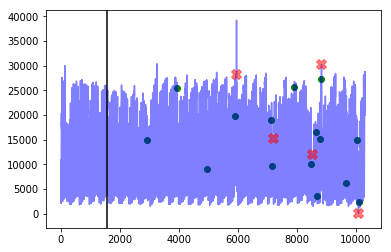




--- exchange-2_cpm_results ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [655, 942, 1493]


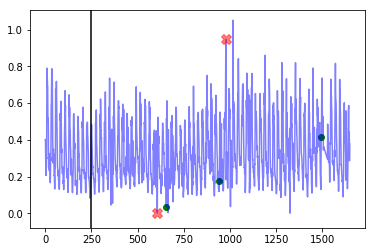




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193]


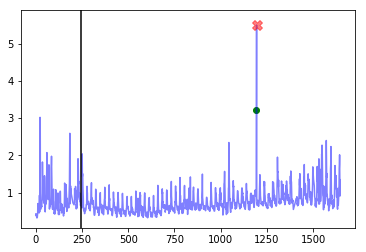




--- all_data_gift_certificates ---
Corresponding window precision:  0.09090909090909091
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  10
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1576, 1636, 1845, 2609, 3046, 3954, 4157, 4236, 4651, 4870, 5414, 5493, 5749, 6255]


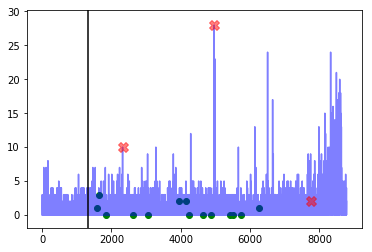




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [680, 1890, 1989, 3328, 3536, 3847, 3949]


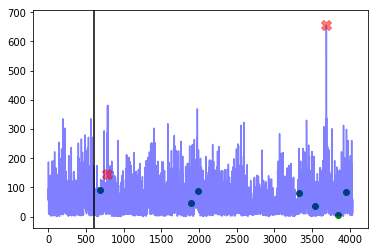




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [724, 1102, 1448, 1956, 2448, 3557]


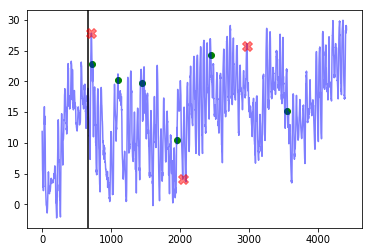




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [612, 863, 1475]


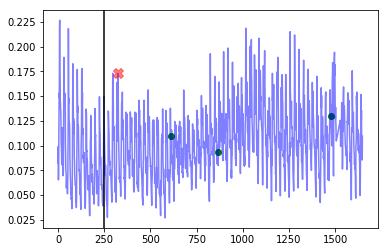




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [966, 1487]


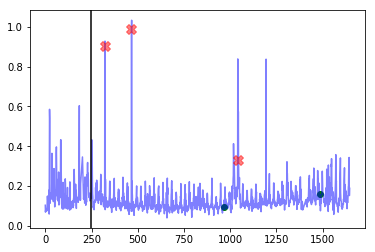




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


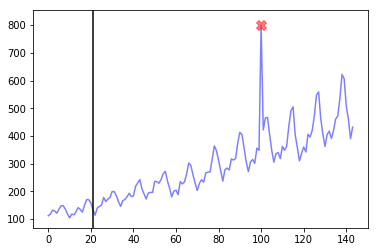




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.1
Corresponding window recall:  0.5
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1403, 1745, 2047, 2196, 2469, 2797, 3004, 3077, 3363, 3557, 3807, 4315, 6693, 7783]


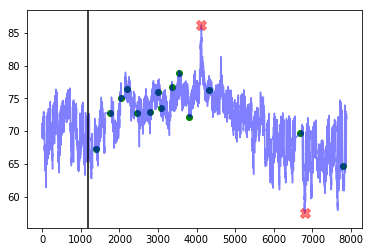

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  17.8
Best window threshold:  0.0001
Corresponding window overall precision:  0.16363636363636364
Corresponding window overall recall:  0.391304347826087
Corresponding window overall F score:  0.23076923076923078



--- nyc_taxi ---
Corresponding window precision:  0.45454545454545453
Corresponding window recall:  1.0
Corresponding window false positives:  6
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2931, 3937, 4961, 5910, 7122, 7172, 7919, 8464, 8640, 8692, 8769, 8827, 9664, 10024, 10099]


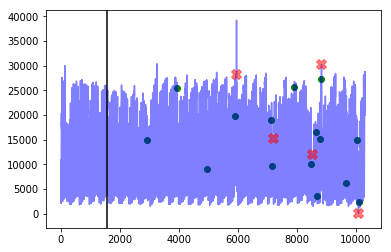




--- exchange-2_cpm_results ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [655, 942, 1493]


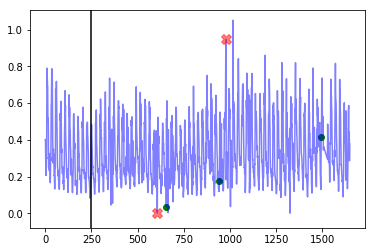




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193]


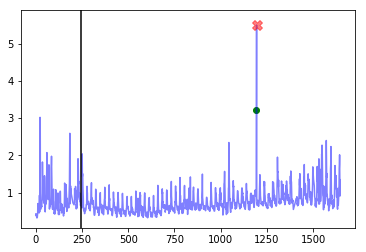




--- all_data_gift_certificates ---
Corresponding window precision:  0.09090909090909091
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  10
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1576, 1636, 1845, 2609, 3046, 3954, 4157, 4236, 4651, 4870, 5414, 5493, 5749, 6255]


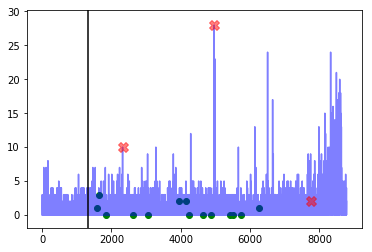




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [680, 1890, 1989, 3328, 3536, 3847, 3949]


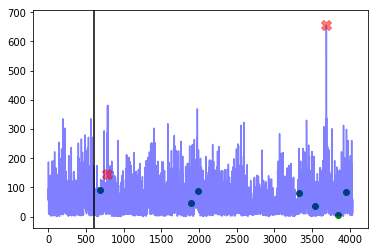




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [724, 1102, 1448, 1956, 2448, 3557]


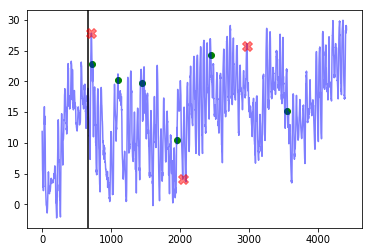




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [612, 863, 1475]


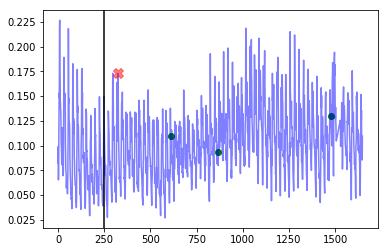




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [966, 1487]


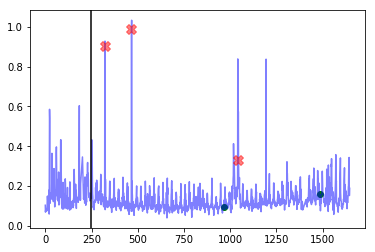




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


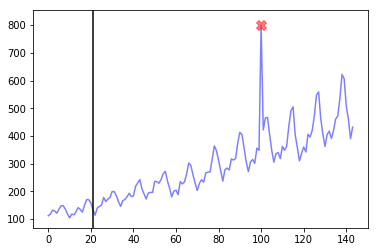




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.1
Corresponding window recall:  0.5
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1403, 1745, 2047, 2196, 2469, 2797, 3004, 3077, 3363, 3557, 3807, 4315, 6693, 7783]


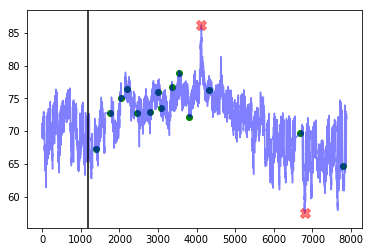

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.7
Best window threshold:  0.0001
Corresponding window overall precision:  0.16363636363636364
Corresponding window overall recall:  0.391304347826087
Corresponding window overall F score:  0.23076923076923078



--- nyc_taxi ---
Corresponding window precision:  0.45454545454545453
Corresponding window recall:  1.0
Corresponding window false positives:  6
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2931, 3937, 4961, 5910, 7122, 7172, 7919, 8464, 8640, 8692, 8769, 8827, 9664, 10024, 10099]


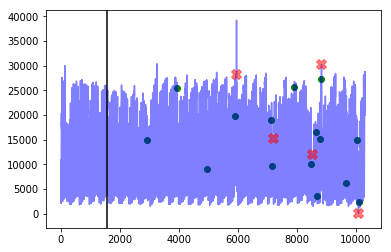




--- exchange-2_cpm_results ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [655, 942, 1493]


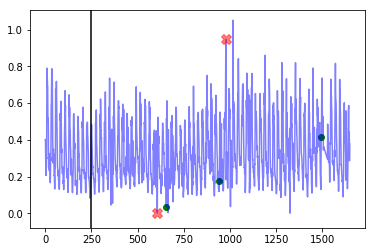




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193]


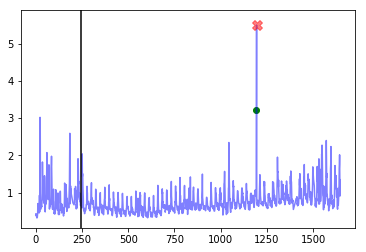




--- all_data_gift_certificates ---
Corresponding window precision:  0.09090909090909091
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  10
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1576, 1636, 1845, 2609, 3046, 3954, 4157, 4236, 4651, 4870, 5414, 5493, 5749, 6255]


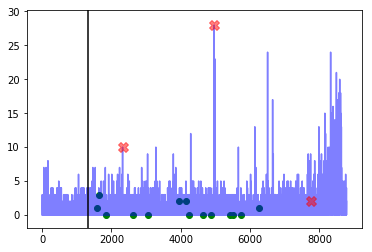




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [680, 1890, 1989, 3328, 3536, 3847, 3949]


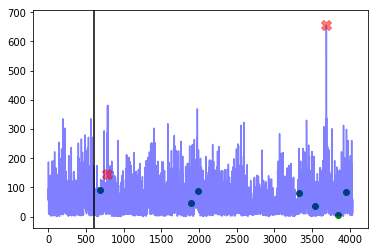




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [724, 1102, 1448, 1956, 2448, 3557]


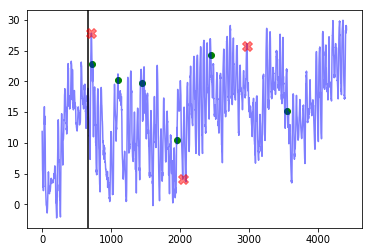




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [612, 863, 1475]


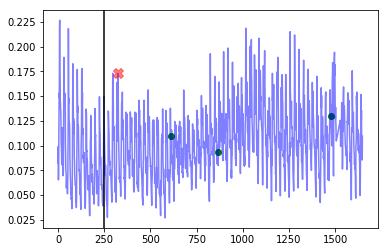




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [966, 1487]


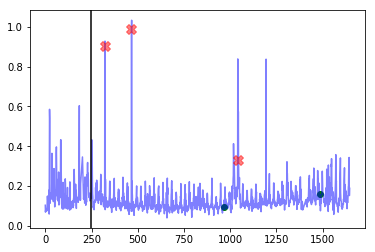




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


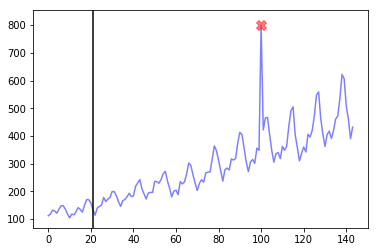




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.1
Corresponding window recall:  0.5
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1403, 1745, 2047, 2196, 2469, 2797, 3004, 3077, 3363, 3557, 3807, 4315, 6693, 7783]


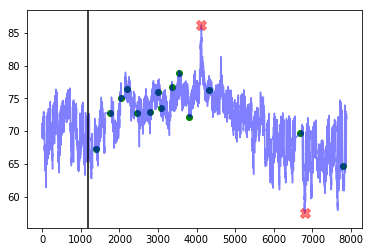

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  25.6
Best window threshold:  0.0001
Corresponding window overall precision:  0.16363636363636364
Corresponding window overall recall:  0.391304347826087
Corresponding window overall F score:  0.23076923076923078



--- nyc_taxi ---
Corresponding window precision:  0.45454545454545453
Corresponding window recall:  1.0
Corresponding window false positives:  6
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2931, 3937, 4961, 5910, 7122, 7172, 7919, 8464, 8640, 8692, 8769, 8827, 9664, 10024, 10099]


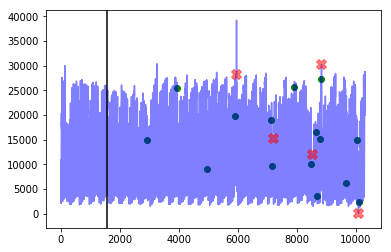




--- exchange-2_cpm_results ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [655, 942, 1493]


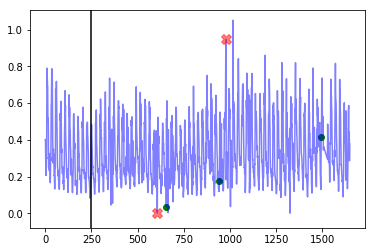




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193]


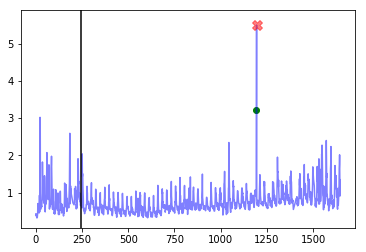




--- all_data_gift_certificates ---
Corresponding window precision:  0.09090909090909091
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  10
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1576, 1636, 1845, 2609, 3046, 3954, 4157, 4236, 4651, 4870, 5414, 5493, 5749, 6255]


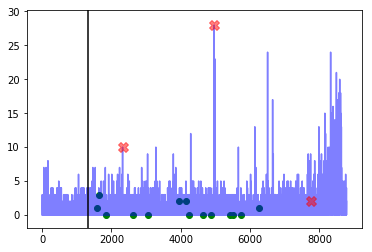




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [680, 1890, 1989, 3328, 3536, 3847, 3949]


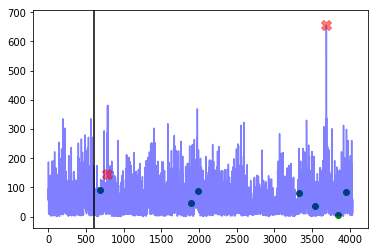




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [724, 1102, 1448, 1956, 2448, 3557]


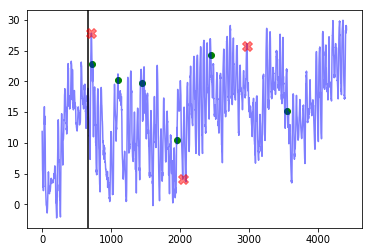




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [612, 863, 1475]


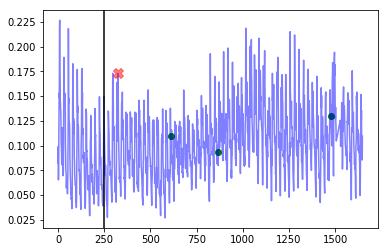




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [966, 1487]


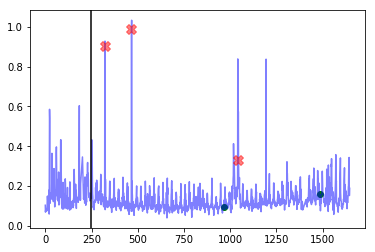




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


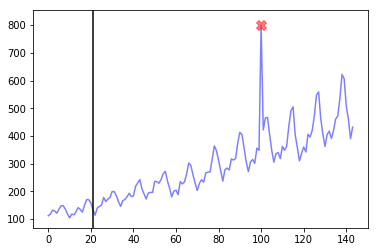




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.1
Corresponding window recall:  0.5
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1403, 1745, 2047, 2196, 2469, 2797, 3004, 3077, 3363, 3557, 3807, 4315, 6693, 7783]


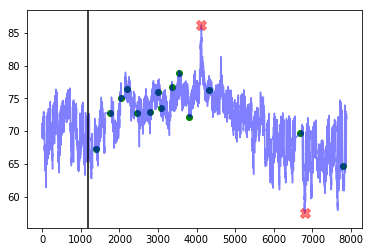

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  29.5
Best window threshold:  0.0001
Corresponding window overall precision:  0.16363636363636364
Corresponding window overall recall:  0.391304347826087
Corresponding window overall F score:  0.23076923076923078



--- nyc_taxi ---
Corresponding window precision:  0.45454545454545453
Corresponding window recall:  1.0
Corresponding window false positives:  6
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2931, 3937, 4961, 5910, 7122, 7172, 7919, 8464, 8640, 8692, 8769, 8827, 9664, 10024, 10099]


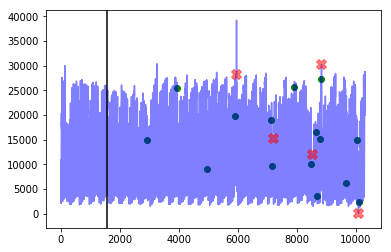




--- exchange-2_cpm_results ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [655, 942, 1493]


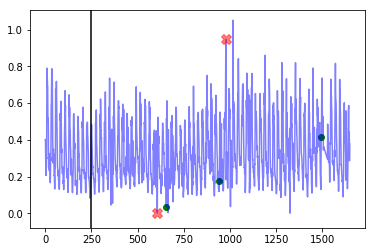




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193]


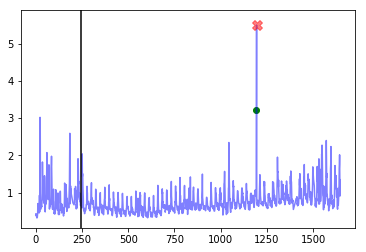




--- all_data_gift_certificates ---
Corresponding window precision:  0.09090909090909091
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  10
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1576, 1636, 1845, 2609, 3046, 3954, 4157, 4236, 4651, 4870, 5414, 5493, 5749, 6255]


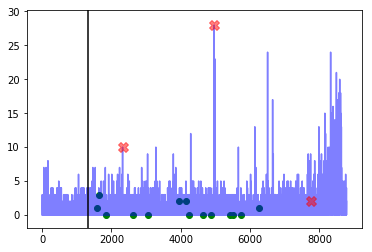




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [680, 1890, 1989, 3328, 3536, 3847, 3949]


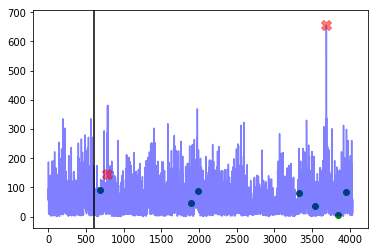




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [724, 1102, 1448, 1956, 2448, 3557]


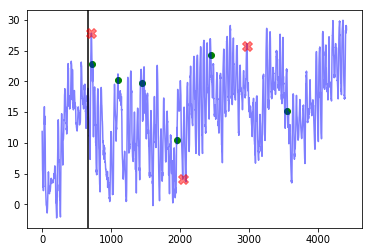




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [612, 863, 1475]


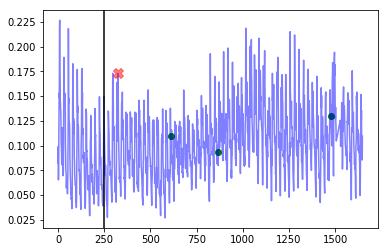




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [966, 1487]


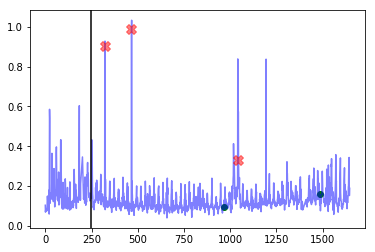




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


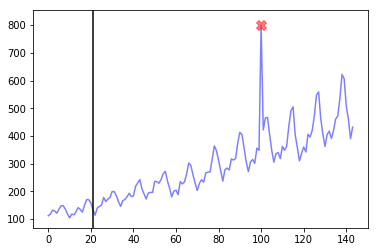




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.1
Corresponding window recall:  0.5
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1403, 1745, 2047, 2196, 2469, 2797, 3004, 3077, 3363, 3557, 3807, 4315, 6693, 7783]


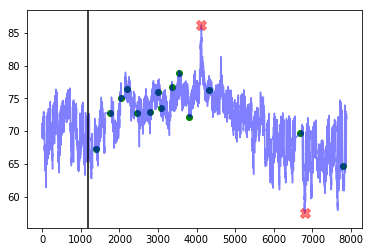

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  33.4
Best window threshold:  0.0001
Corresponding window overall precision:  0.16363636363636364
Corresponding window overall recall:  0.391304347826087
Corresponding window overall F score:  0.23076923076923078



--- nyc_taxi ---
Corresponding window precision:  0.45454545454545453
Corresponding window recall:  1.0
Corresponding window false positives:  6
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2931, 3937, 4961, 5910, 7122, 7172, 7919, 8464, 8640, 8692, 8769, 8827, 9664, 10024, 10099]


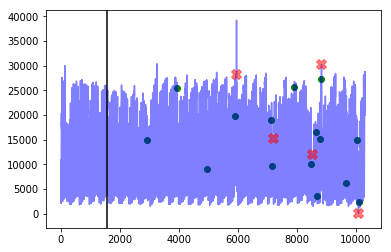




--- exchange-2_cpm_results ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [655, 942, 1493]


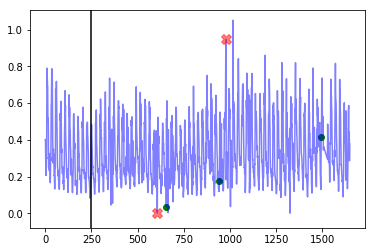




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193]


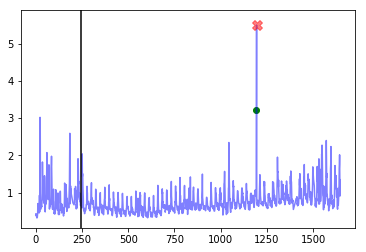




--- all_data_gift_certificates ---
Corresponding window precision:  0.09090909090909091
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  10
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1576, 1636, 1845, 2609, 3046, 3954, 4157, 4236, 4651, 4870, 5414, 5493, 5749, 6255]


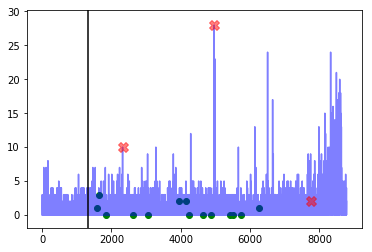




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [680, 1890, 1989, 3328, 3536, 3847, 3949]


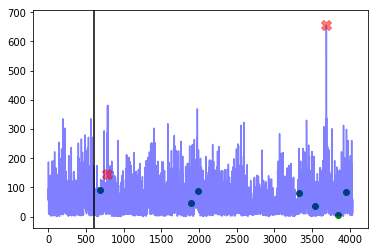




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [724, 1102, 1448, 1956, 2448, 3557]


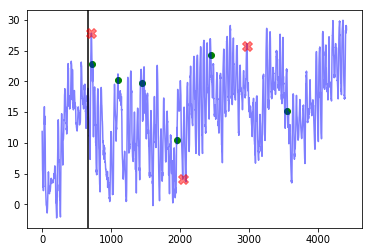




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [612, 863, 1475]


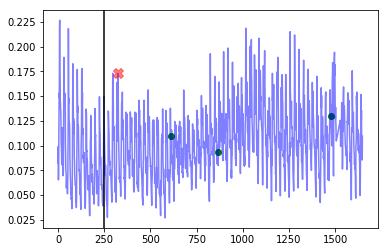




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [966, 1487]


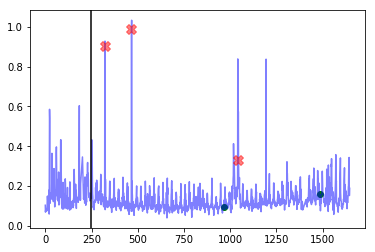




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


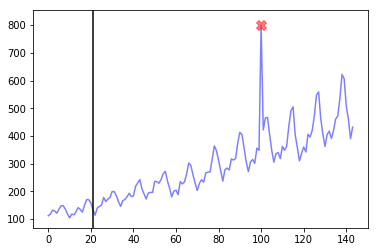




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.1
Corresponding window recall:  0.5
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1403, 1745, 2047, 2196, 2469, 2797, 3004, 3077, 3363, 3557, 3807, 4315, 6693, 7783]


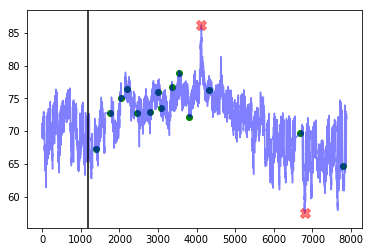

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  37.3
Best window threshold:  0.0001
Corresponding window overall precision:  0.16363636363636364
Corresponding window overall recall:  0.391304347826087
Corresponding window overall F score:  0.23076923076923078



--- nyc_taxi ---
Corresponding window precision:  0.45454545454545453
Corresponding window recall:  1.0
Corresponding window false positives:  6
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2931, 3937, 4961, 5910, 7122, 7172, 7919, 8464, 8640, 8692, 8769, 8827, 9664, 10024, 10099]


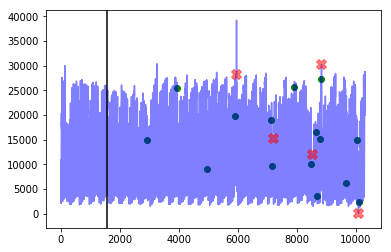




--- exchange-2_cpm_results ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [655, 942, 1493]


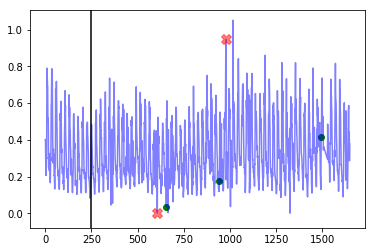




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193]


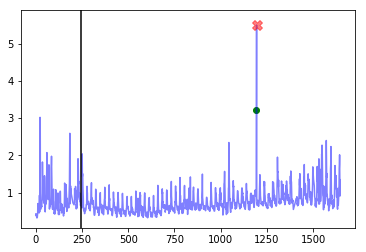




--- all_data_gift_certificates ---
Corresponding window precision:  0.09090909090909091
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  10
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1576, 1636, 1845, 2609, 3046, 3954, 4157, 4236, 4651, 4870, 5414, 5493, 5749, 6255]


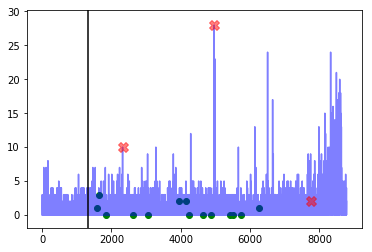




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [680, 1890, 1989, 3328, 3536, 3847, 3949]


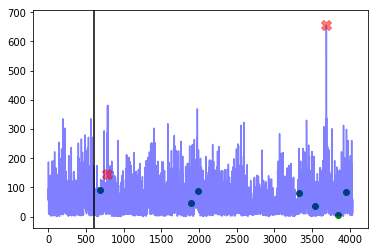




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [724, 1102, 1448, 1956, 2448, 3557]


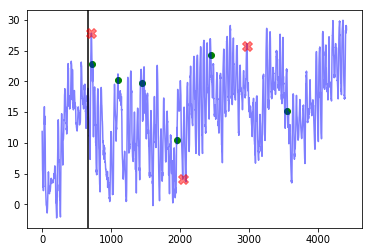




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [612, 863, 1475]


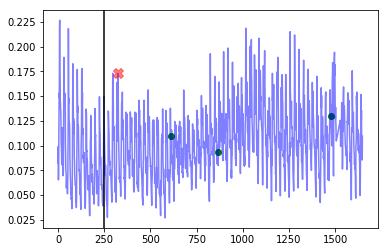




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [966, 1487]


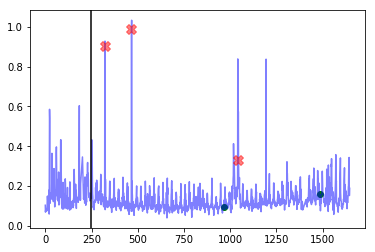




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


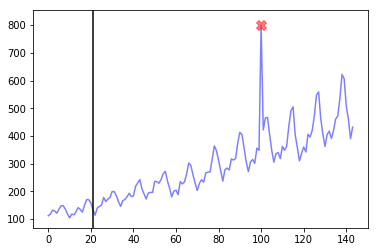




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.1
Corresponding window recall:  0.5
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1403, 1745, 2047, 2196, 2469, 2797, 3004, 3077, 3363, 3557, 3807, 4315, 6693, 7783]


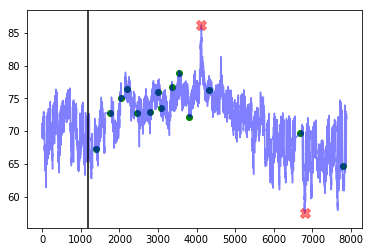

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  41.2
Best window threshold:  0.0001
Corresponding window overall precision:  0.16363636363636364
Corresponding window overall recall:  0.391304347826087
Corresponding window overall F score:  0.23076923076923078



--- nyc_taxi ---
Corresponding window precision:  0.45454545454545453
Corresponding window recall:  1.0
Corresponding window false positives:  6
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2931, 3937, 4961, 5910, 7122, 7172, 7919, 8464, 8640, 8692, 8769, 8827, 9664, 10024, 10099]


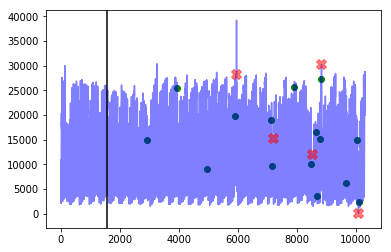




--- exchange-2_cpm_results ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [655, 942, 1493]


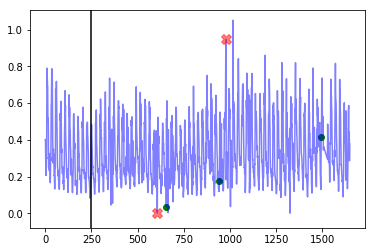




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193]


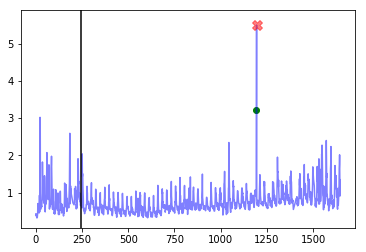




--- all_data_gift_certificates ---
Corresponding window precision:  0.09090909090909091
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  10
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1576, 1636, 1845, 2609, 3046, 3954, 4157, 4236, 4651, 4870, 5414, 5493, 5749, 6255]


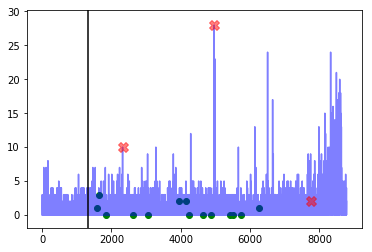




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [680, 1890, 1989, 3328, 3536, 3847, 3949]


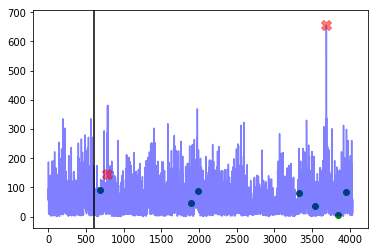




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [724, 1102, 1448, 1956, 2448, 3557]


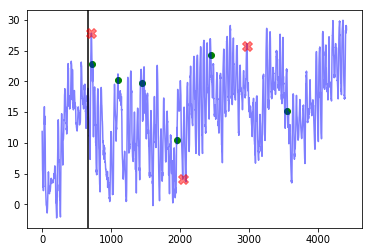




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [612, 863, 1475]


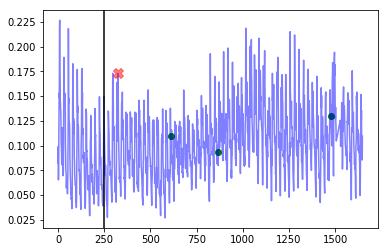




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [966, 1487]


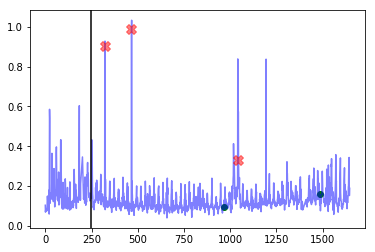




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


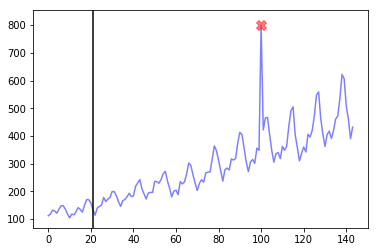




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.1
Corresponding window recall:  0.5
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1403, 1745, 2047, 2196, 2469, 2797, 3004, 3077, 3363, 3557, 3807, 4315, 6693, 7783]


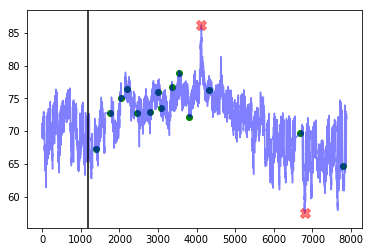

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  45.1
Best window threshold:  0.0001
Corresponding window overall precision:  0.16363636363636364
Corresponding window overall recall:  0.391304347826087
Corresponding window overall F score:  0.23076923076923078



--- nyc_taxi ---
Corresponding window precision:  0.45454545454545453
Corresponding window recall:  1.0
Corresponding window false positives:  6
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2931, 3937, 4961, 5910, 7122, 7172, 7919, 8464, 8640, 8692, 8769, 8827, 9664, 10024, 10099]


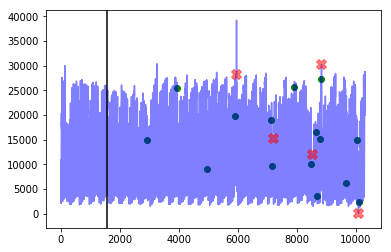




--- exchange-2_cpm_results ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [655, 942, 1493]


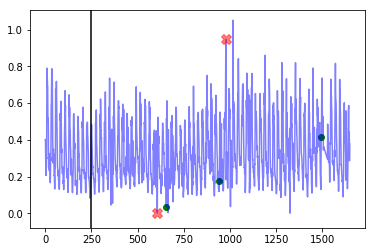




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193]


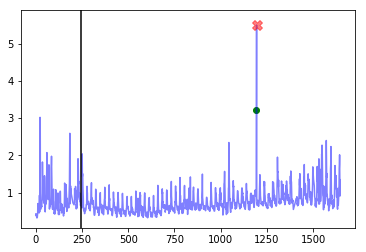




--- all_data_gift_certificates ---
Corresponding window precision:  0.09090909090909091
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  10
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1576, 1636, 1845, 2609, 3046, 3954, 4157, 4236, 4651, 4870, 5414, 5493, 5749, 6255]


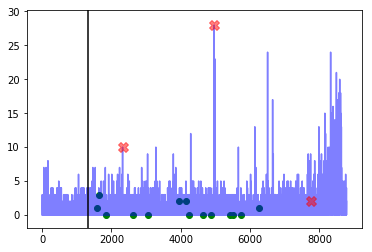




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [680, 1890, 1989, 3328, 3536, 3847, 3949]


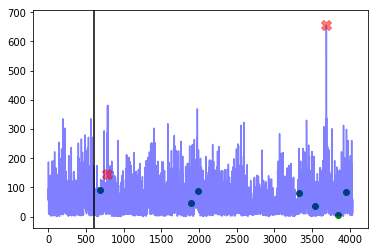




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [724, 1102, 1448, 1956, 2448, 3557]


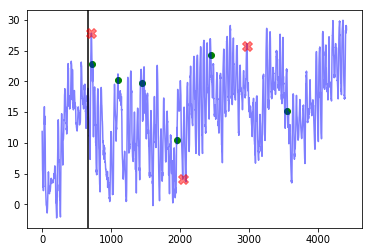




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [612, 863, 1475]


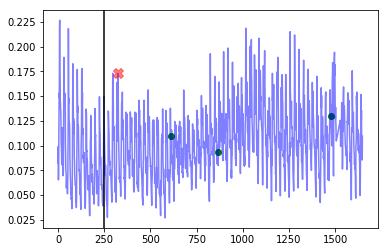




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [966, 1487]


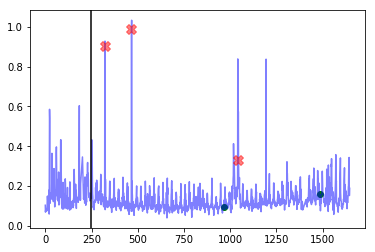




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


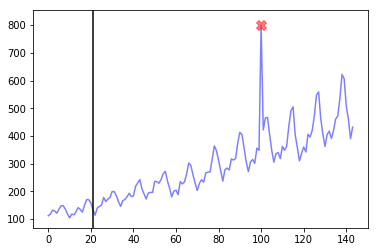




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.1
Corresponding window recall:  0.5
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1403, 1745, 2047, 2196, 2469, 2797, 3004, 3077, 3363, 3557, 3807, 4315, 6693, 7783]


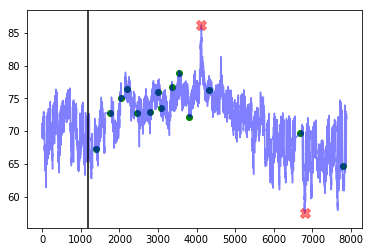

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  49.0
Best window threshold:  0.0001
Corresponding window overall precision:  0.16363636363636364
Corresponding window overall recall:  0.391304347826087
Corresponding window overall F score:  0.23076923076923078



--- nyc_taxi ---
Corresponding window precision:  0.45454545454545453
Corresponding window recall:  1.0
Corresponding window false positives:  6
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2931, 3937, 4961, 5910, 7122, 7172, 7919, 8464, 8640, 8692, 8769, 8827, 9664, 10024, 10099]


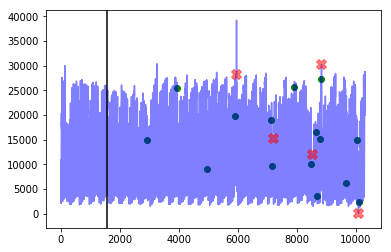




--- exchange-2_cpm_results ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [655, 942, 1493]


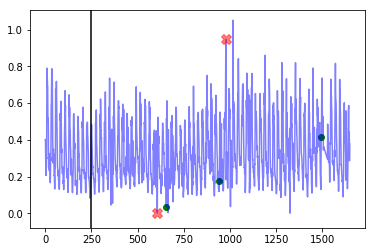




--- exchange-3_cpm_results ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1193]


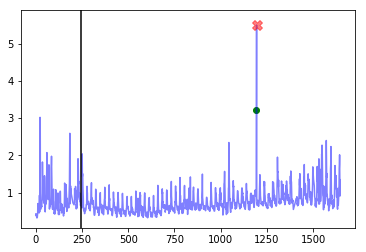




--- all_data_gift_certificates ---
Corresponding window precision:  0.09090909090909091
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  10
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1576, 1636, 1845, 2609, 3046, 3954, 4157, 4236, 4651, 4870, 5414, 5493, 5749, 6255]


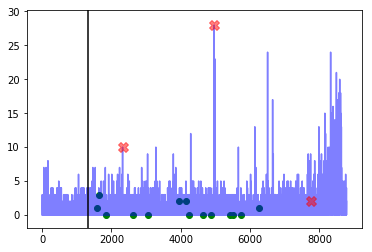




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.2
Corresponding window recall:  0.5
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [680, 1890, 1989, 3328, 3536, 3847, 3949]


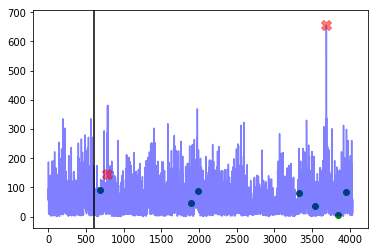




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  4
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [724, 1102, 1448, 1956, 2448, 3557]


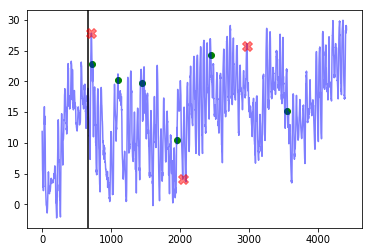




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [612, 863, 1475]


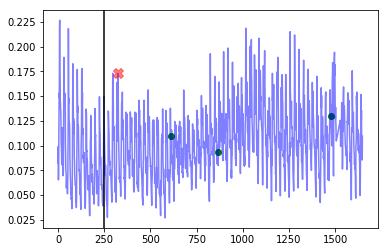




--- exchange-3_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [966, 1487]


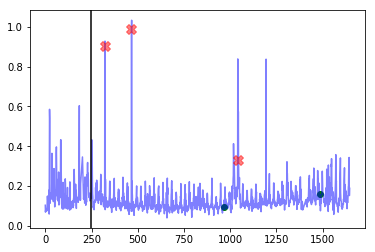




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


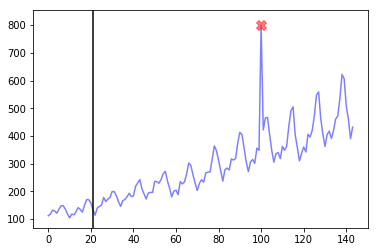




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.1
Corresponding window recall:  0.5
Corresponding window false positives:  9
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1403, 1745, 2047, 2196, 2469, 2797, 3004, 3077, 3363, 3557, 3807, 4315, 6693, 7783]


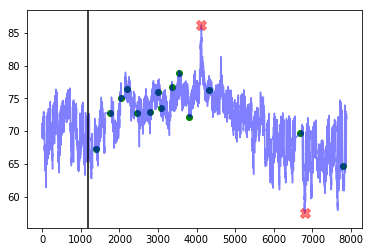

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 13.9
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.16363636363636364
	 Corresponding window overall recall : 0.391304347826087
	 Corresponding window overall F score : 0.23076923076923078
False Positive Weight:  0.2
	 Minimum number of mistakes : 17.8
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.16363636363636364
	 Corresponding window overall recall : 0.391304347826087
	 Corresponding window overall F score : 0.23076923076923078
False Positive Weight:  0.3
	 Minimum number of mistakes : 21.7
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.16363636363636364
	 Corresponding window overall recall : 0.391304347826087
	 Corresponding window overall F score : 0.23076923076923078
False Positive Weight:  0.4
	 Minimum number of mistakes : 25.6
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.16363636

In [67]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# GLM

In [40]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_glm = joblib.load("anomaly_scores" + window_size + "/GLM/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_glm["Anomaly Scores"]

In [41]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.2: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.3: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.4: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.5: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.6: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.7: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.8: {'precision': 0.1111111111111111, 'recall': 1.0},
 0.9: {'precision': 0.1111111111111111, 'recall': 1.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  9.5
Best window threshold:  0.9999
Corresponding window overall precision:  0.17094017094017094
Corresponding window overall recall:  0.8695652173913043
Corresponding window overall F score:  0.28571428571428575



--- nyc_taxi ---
Corresponding window precision:  0.19230769230769232
Corresponding window recall:  1.0
Corresponding window false positives:  21
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1550, 1552, 1874, 1876, 1886, 1888, 2210, 2212, 2222, 2224, 2558, 2560, 2894, 2896, 2897, 3554, 3566, 3902, 4222, 4224, 4226, 4228, 4238, 4240, 4574, 4575, 4576, 4898, 4900, 4910, 4912, 5234, 5246, 5248, 5582, 5584, 5906, 5907, 5908, 5909, 5910, 5918, 5920, 5954, 5955, 6244, 6254, 6255, 6256, 6578, 6580, 6590, 6591, 6592, 6914, 6926, 6927, 6928, 7166, 7168, 7262, 7264, 7586, 7598, 7600, 7922, 7924, 7934, 7936, 8258, 8270, 8271, 

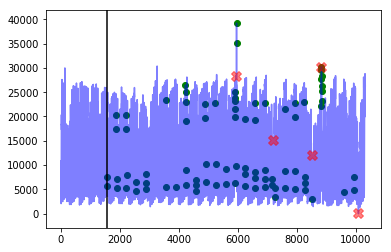




--- exchange-2_cpm_results ---
Corresponding window precision:  0.15384615384615385
Corresponding window recall:  1.0
Corresponding window false positives:  11
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [325, 348, 355, 360, 601, 655, 664, 665, 802, 899, 976, 977, 1016, 1104, 1280, 1325, 1450, 1520, 1521]


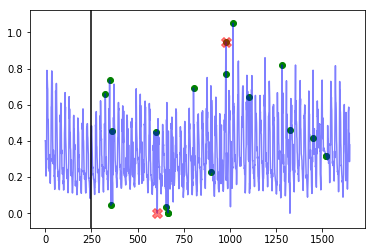




--- exchange-3_cpm_results ---
Corresponding window precision:  0.16666666666666666
Corresponding window recall:  1.0
Corresponding window false positives:  5
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [553, 660, 683, 733, 836, 1018, 1021, 1044, 1193, 1194, 1531, 1536, 1571]


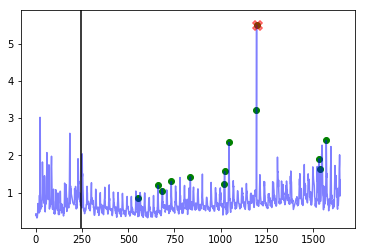




--- all_data_gift_certificates ---
Corresponding window precision:  0.12
Corresponding window recall:  1.0
Corresponding window false positives:  22
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1438, 1462, 1531, 1702, 1770, 1820, 1822, 1918, 2009, 2059, 2157, 2176, 2233, 2304, 2320, 2469, 2471, 2514, 2667, 2871, 3042, 3260, 3281, 3389, 3620, 3664, 3688, 3785, 3810, 3855, 4149, 4286, 4516, 4578, 4720, 4796, 4946, 4961, 4963, 4986, 5155, 5206, 5250, 5453, 5474, 5632, 5637, 5662, 5799, 5905, 5924, 6014, 6137, 6167, 6353, 6375, 6406, 6471, 6505, 6650, 6669, 6836, 6954, 6960, 6978, 7100, 7317, 7318, 7366, 7396, 7654, 7655, 7656, 7677, 7679, 7680, 7696, 7720, 7746, 7838, 7864, 7963, 7985, 7989, 8157, 8177, 8323, 8324, 8491]


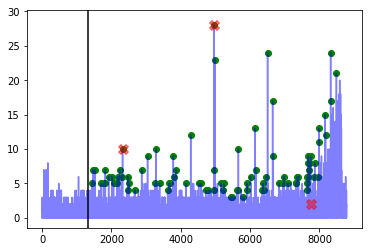




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.18181818181818182
Corresponding window recall:  1.0
Corresponding window false positives:  9
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [741, 783, 786, 791, 926, 1038, 1586, 1978, 2556, 2595, 2836, 3052, 3069, 3087, 3116, 3327, 3378, 3427, 3658, 3690, 3918, 3957]


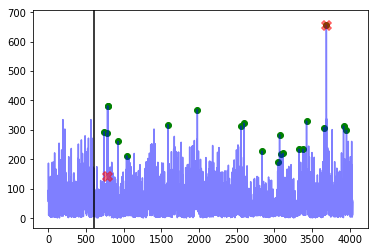




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1965, 1966, 2488, 2489, 2490, 2491, 2492, 2493, 3008, 3010]


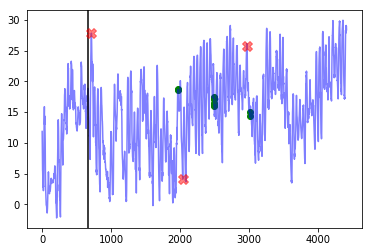




--- exchange-2_cpc_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  2
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [317, 325, 824, 1484, 1485, 1486, 1487]


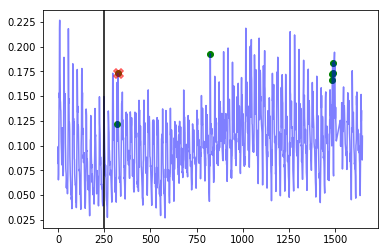




--- exchange-3_cpc_results ---
Corresponding window precision:  0.3333333333333333
Corresponding window recall:  1.0
Corresponding window false positives:  6
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 323, 466, 467, 757, 836, 901, 973, 1011, 1014, 1016, 1017, 1018, 1041, 1044, 1193, 1194, 1531, 1536]


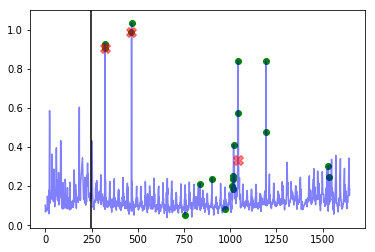




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


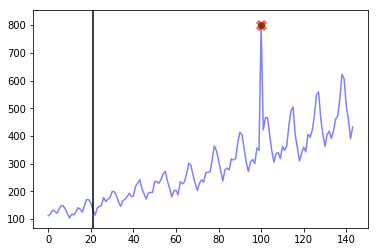




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.2
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [2518, 3070, 3933, 3936, 3938, 4100, 4101, 4102, 4104, 4105, 4628, 4629, 5439, 5440, 5441, 5442, 5443, 5444, 5658, 5771, 5774, 6144, 6145, 6749, 7624, 7626]


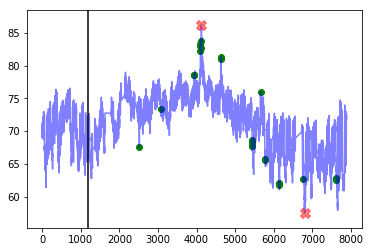

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  16.8
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.34782608695652173
Corresponding window overall F score:  0.39999999999999997



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


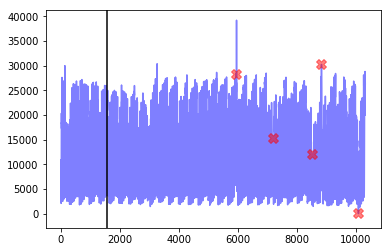




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


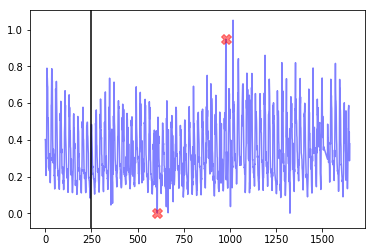




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


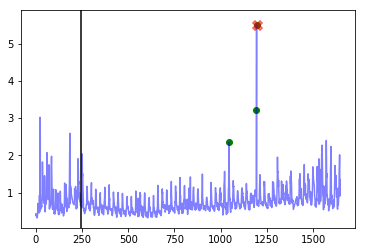




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 3281, 4286, 4963, 4986, 5662, 6137, 6505, 6650, 7985]


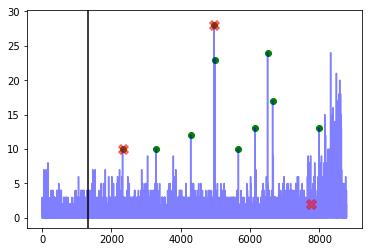




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


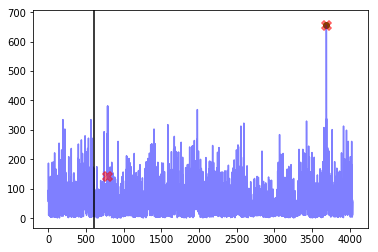




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


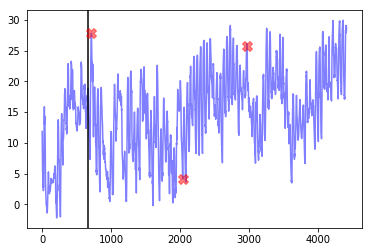




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


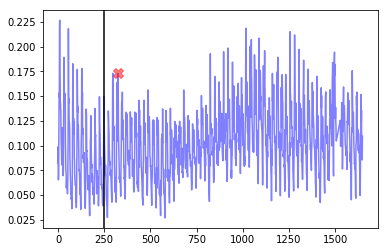




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 467, 1018, 1041, 1193, 1194]


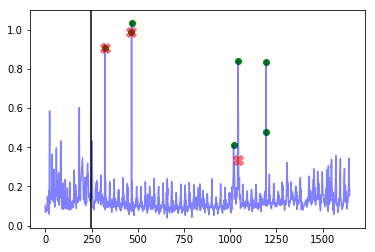




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


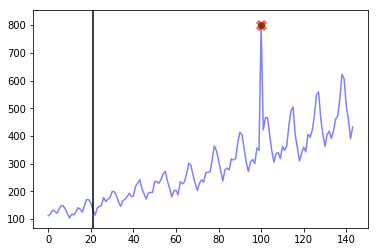




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


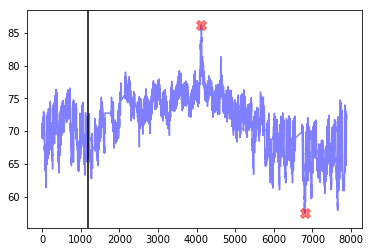

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  17.700000000000003
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.34782608695652173
Corresponding window overall F score:  0.39999999999999997



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


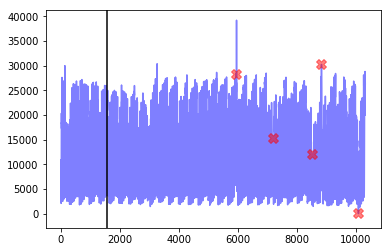




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


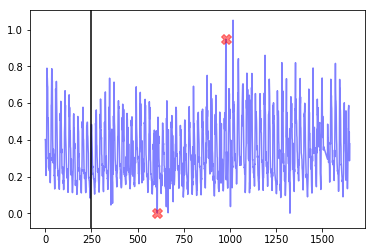




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


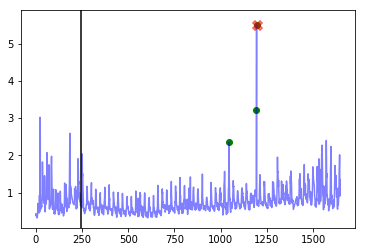




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 3281, 4286, 4963, 4986, 5662, 6137, 6505, 6650, 7985]


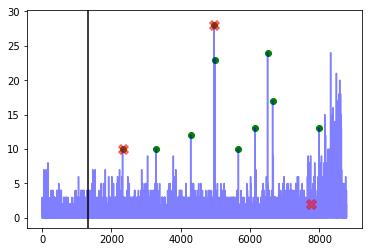




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


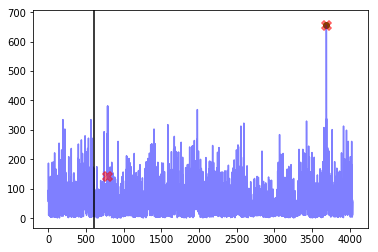




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


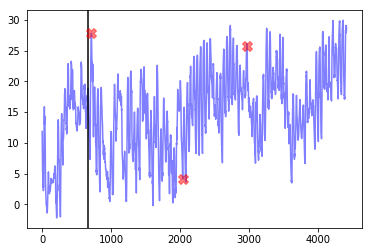




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


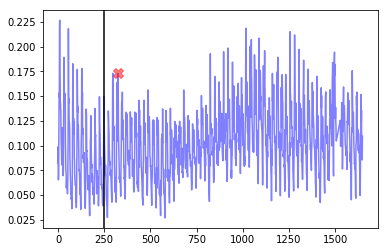




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 467, 1018, 1041, 1193, 1194]


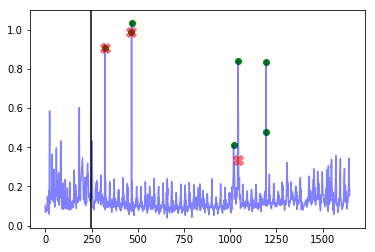




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


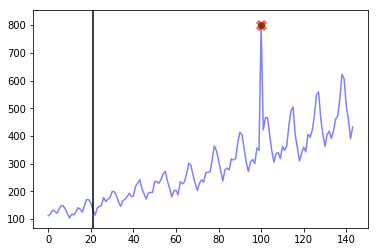




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


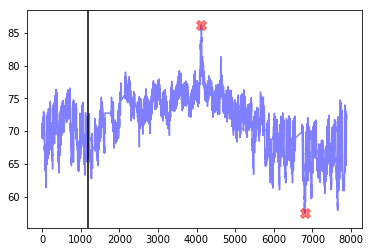

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  18.6
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.34782608695652173
Corresponding window overall F score:  0.39999999999999997



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


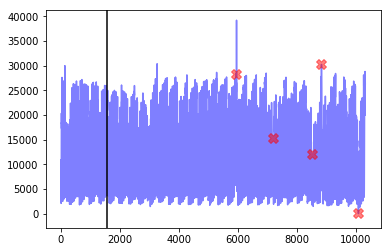




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


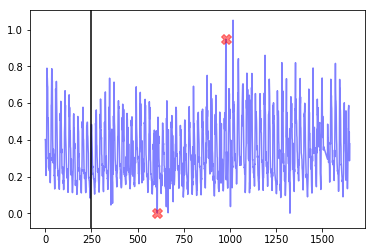




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


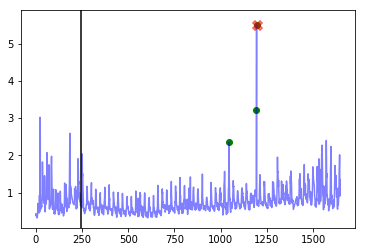




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 3281, 4286, 4963, 4986, 5662, 6137, 6505, 6650, 7985]


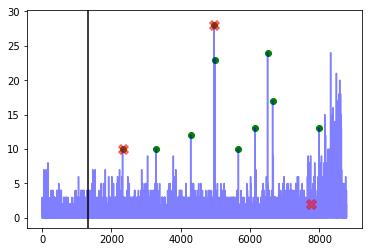




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


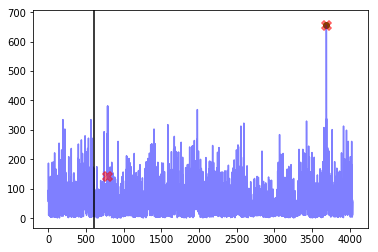




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


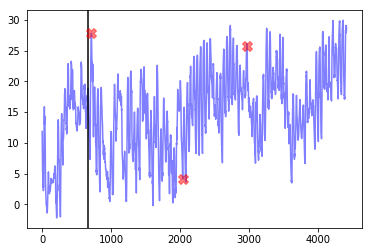




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


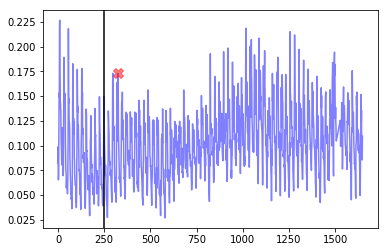




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 467, 1018, 1041, 1193, 1194]


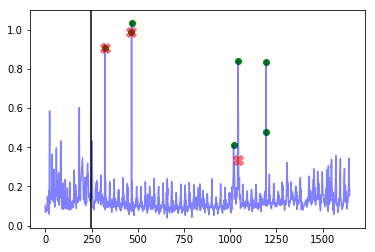




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


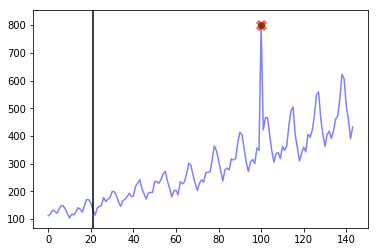




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


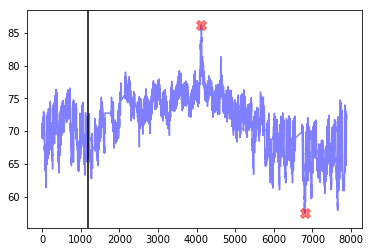

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.5
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.34782608695652173
Corresponding window overall F score:  0.39999999999999997



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


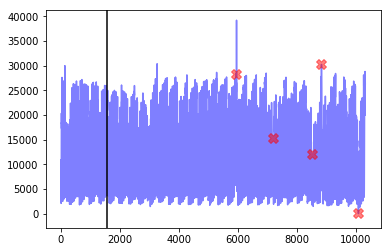




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


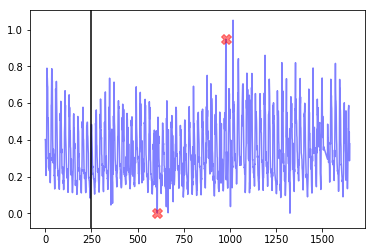




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


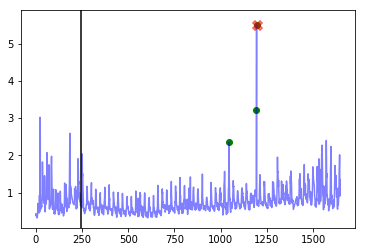




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 3281, 4286, 4963, 4986, 5662, 6137, 6505, 6650, 7985]


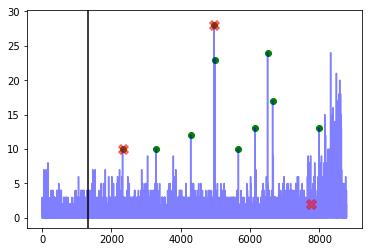




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


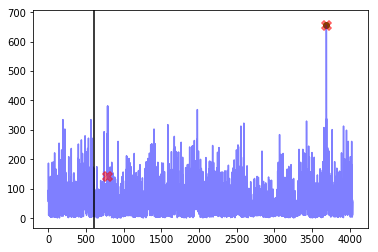




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


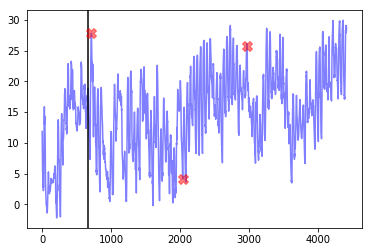




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


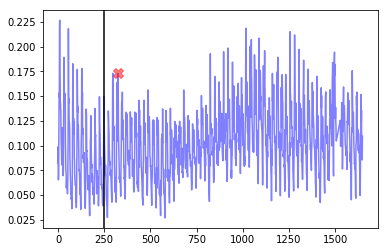




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 467, 1018, 1041, 1193, 1194]


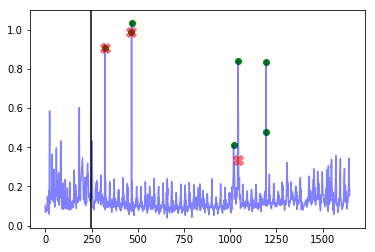




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


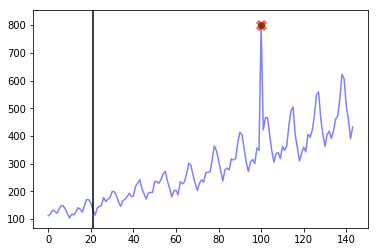




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


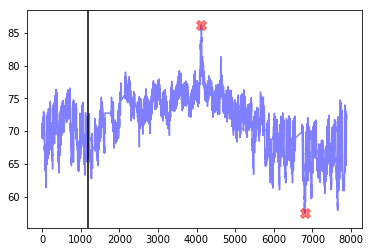

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  20.400000000000002
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.34782608695652173
Corresponding window overall F score:  0.39999999999999997



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


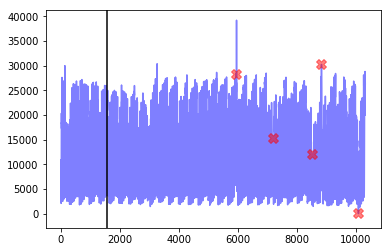




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


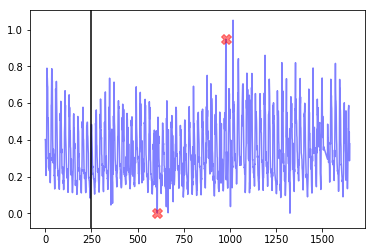




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


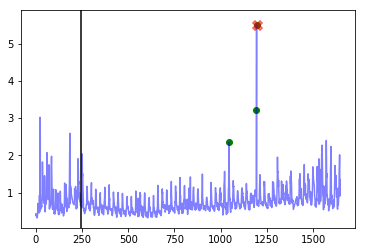




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 3281, 4286, 4963, 4986, 5662, 6137, 6505, 6650, 7985]


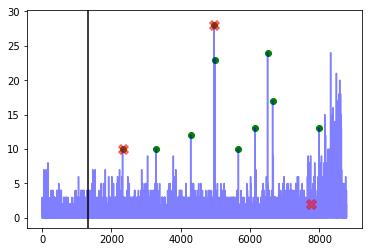




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


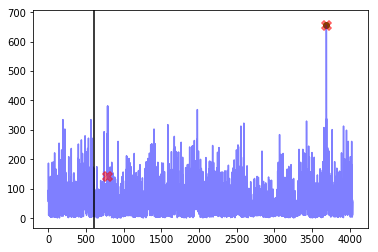




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


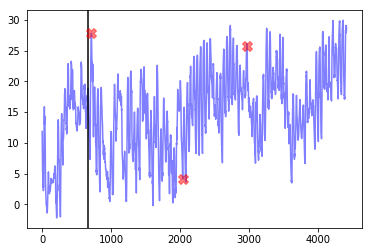




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


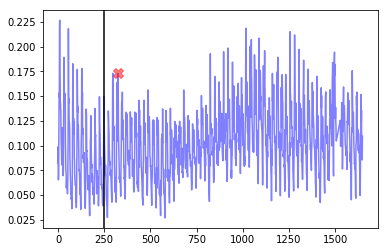




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 467, 1018, 1041, 1193, 1194]


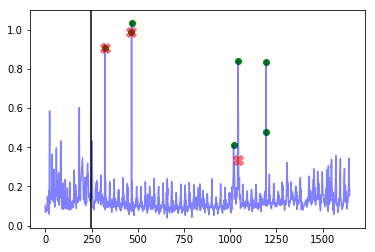




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


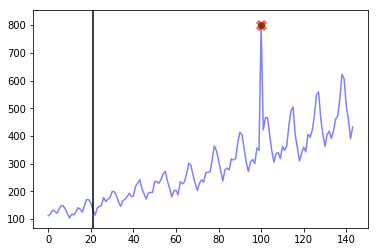




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


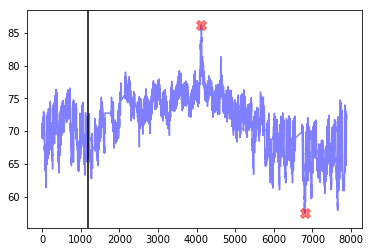

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.3
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.34782608695652173
Corresponding window overall F score:  0.39999999999999997



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


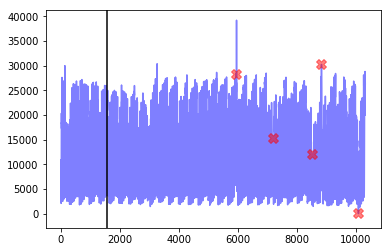




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


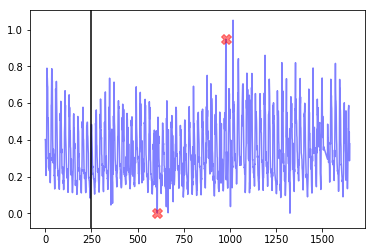




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


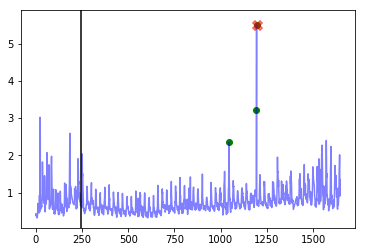




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 3281, 4286, 4963, 4986, 5662, 6137, 6505, 6650, 7985]


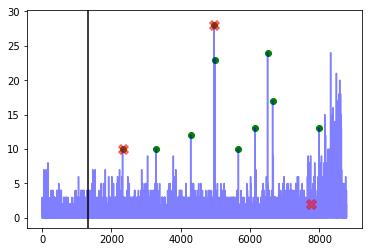




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


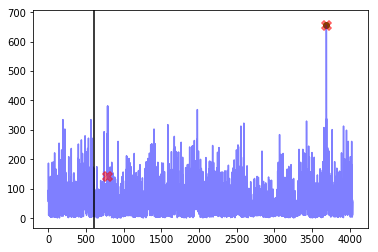




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


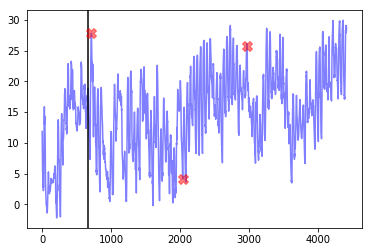




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


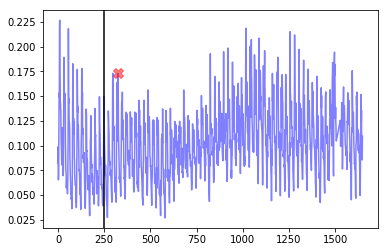




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 467, 1018, 1041, 1193, 1194]


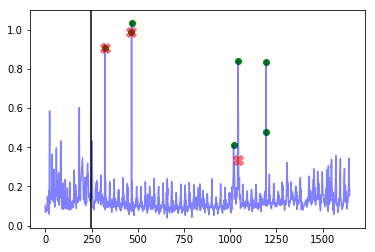




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


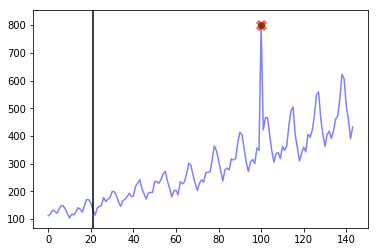




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


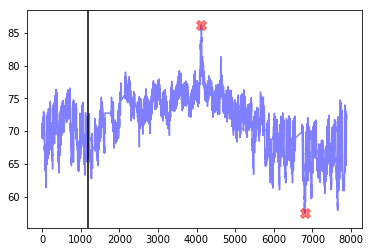

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  22.2
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.34782608695652173
Corresponding window overall F score:  0.39999999999999997



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


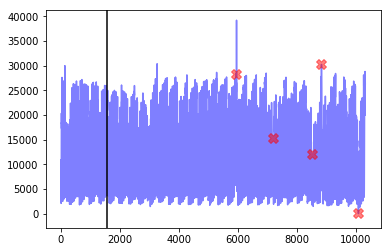




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


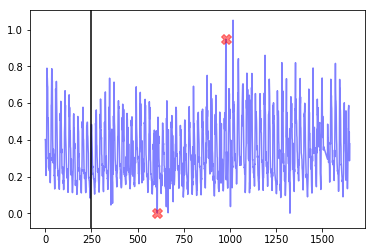




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


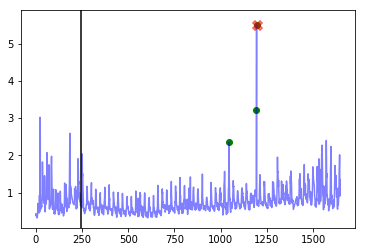




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 3281, 4286, 4963, 4986, 5662, 6137, 6505, 6650, 7985]


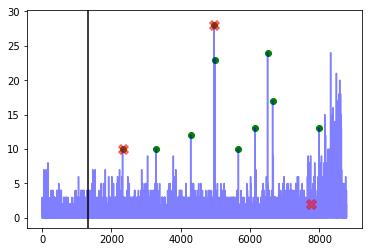




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


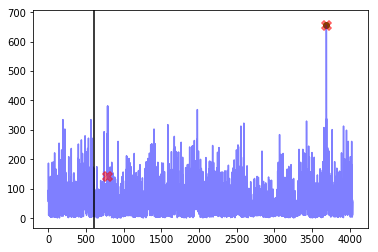




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


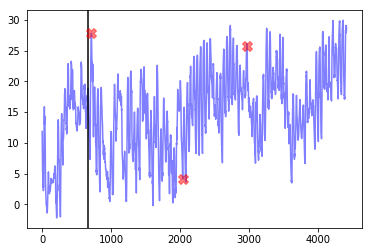




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


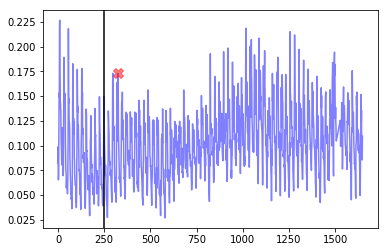




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 467, 1018, 1041, 1193, 1194]


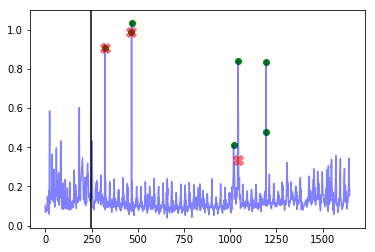




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


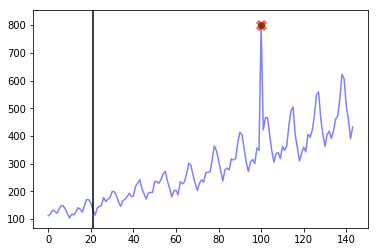




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


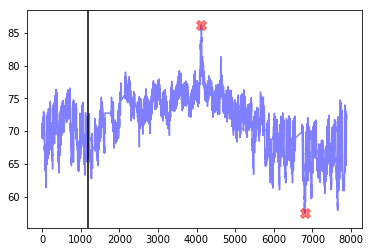

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  23.099999999999998
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.34782608695652173
Corresponding window overall F score:  0.39999999999999997



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


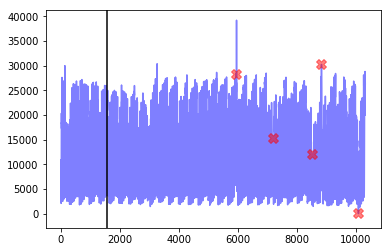




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


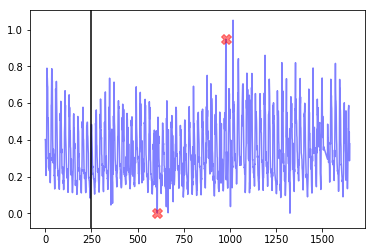




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


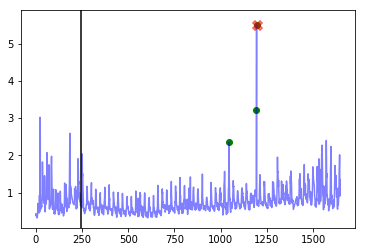




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 3281, 4286, 4963, 4986, 5662, 6137, 6505, 6650, 7985]


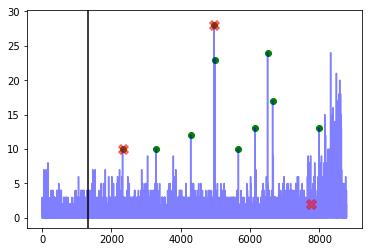




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


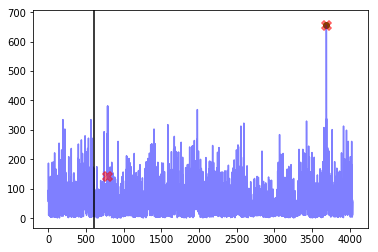




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


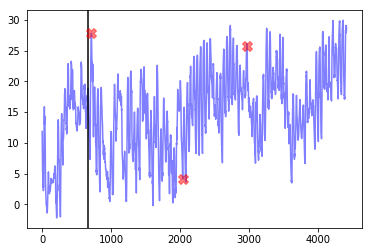




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


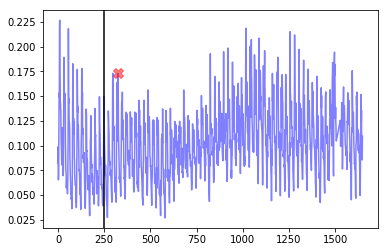




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 467, 1018, 1041, 1193, 1194]


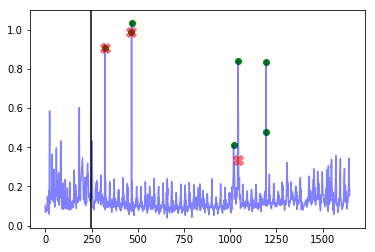




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


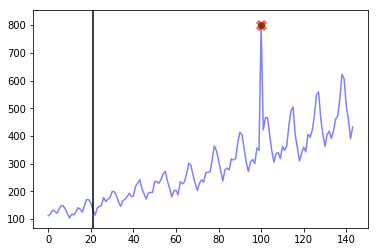




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


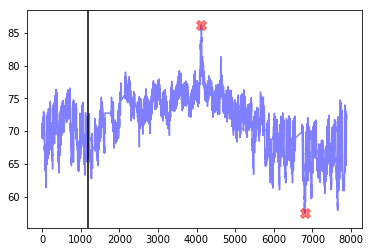

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  24.0
Best window threshold:  1.0
Corresponding window overall precision:  0.47058823529411764
Corresponding window overall recall:  0.34782608695652173
Corresponding window overall F score:  0.39999999999999997



--- nyc_taxi ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  5


Outlier indices as determined by best window threshold:  []


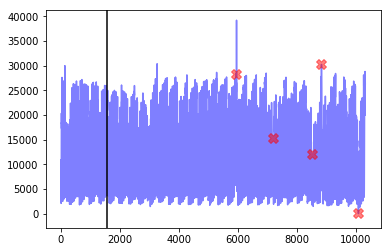




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


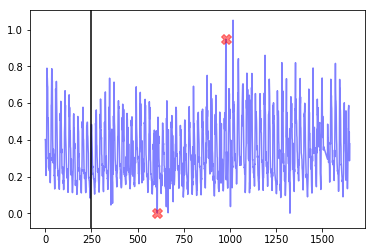




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1044, 1193, 1194]


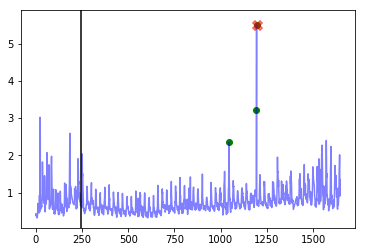




--- all_data_gift_certificates ---
Corresponding window precision:  0.2222222222222222
Corresponding window recall:  0.6666666666666666
Corresponding window false positives:  7
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [2320, 3281, 4286, 4963, 4986, 5662, 6137, 6505, 6650, 7985]


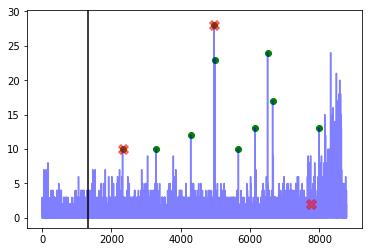




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  0.5
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [3690]


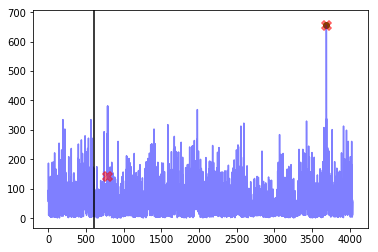




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  []


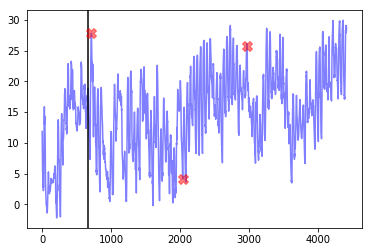




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


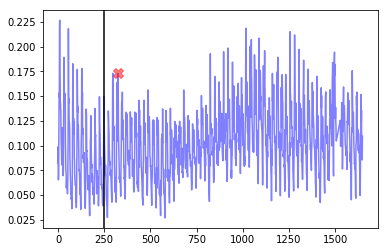




--- exchange-3_cpc_results ---
Corresponding window precision:  0.75
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [322, 466, 467, 1018, 1041, 1193, 1194]


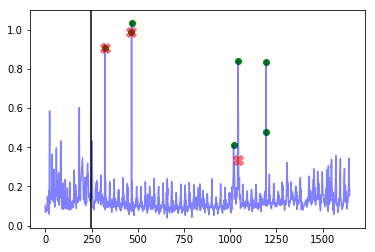




--- international-airline-passengers ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [100]


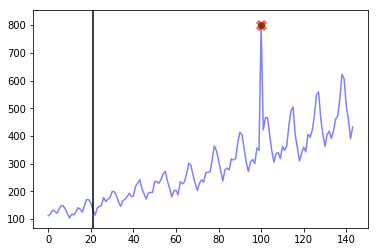




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  []


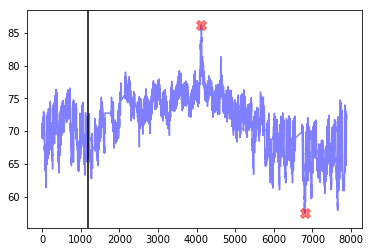

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 9.5
	 Best window threshold : 0.9999
	 Corresponding window overall precision : 0.17094017094017094
	 Corresponding window overall recall : 0.8695652173913043
	 Corresponding window overall F score : 0.28571428571428575
False Positive Weight:  0.2
	 Minimum number of mistakes : 16.8
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.47058823529411764
	 Corresponding window overall recall : 0.34782608695652173
	 Corresponding window overall F score : 0.39999999999999997
False Positive Weight:  0.3
	 Minimum number of mistakes : 17.700000000000003
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0.47058823529411764
	 Corresponding window overall recall : 0.34782608695652173
	 Corresponding window overall F score : 0.39999999999999997
False Positive Weight:  0.4
	 Minimum number of mistakes : 18.6
	 Best window threshold : 1.0
	 Corresponding window overall precision : 0

In [42]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# Anomalous

In [19]:
anomaly_scores_dict = {}

for dataset_name in dataset_name_list:
    output_dict_anomalous = joblib.load("anomaly_scores" + window_size + "/anomalous/" + dataset_name)
    anomaly_scores_dict[dataset_name] = output_dict_anomalous["Anomaly Scores"]

In [20]:
adclasses.precision_recall_curve_info(anomaly_scores_dict, true_outlier_indices_dict)

{0.1: {'precision': 0.0, 'recall': 0.0},
 0.2: {'precision': 0.0, 'recall': 0.0},
 0.3: {'precision': 0.0, 'recall': 0.0},
 0.4: {'precision': 0.0, 'recall': 0.0},
 0.5: {'precision': 0.0, 'recall': 0.0},
 0.6: {'precision': 0.0, 'recall': 0.0},
 0.7: {'precision': 0.0, 'recall': 0.0},
 0.8: {'precision': 0.0, 'recall': 0.0},
 0.9: {'precision': 0.0, 'recall': 0.0},
 1.0: {'precision': 0.0, 'recall': 0.0}}

---------weight_fp=0.1, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  17.800000000000004
Best window threshold:  0.0
Corresponding window overall precision:  0.11330049261083744
Corresponding window overall recall:  1.0
Corresponding window overall F score:  0.20353982300884957



--- nyc_taxi ---
Corresponding window precision:  0.11627906976744186
Corresponding window recall:  1.0
Corresponding window false positives:  38
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1548, 1549, 1550, 1551, 1552, 1553, 1554, 1555, 1556, 1557, 1558, 1559, 1560, 1561, 1562, 1563, 1564, 1565, 1566, 1567, 1568, 1569, 1570, 1571, 1572, 1573, 1574, 1575, 1576, 1577, 1578, 1579, 1580, 1581, 1582, 1583, 1584, 1585, 1586, 1587, 1588, 1589, 1590, 1591, 1592, 1593, 1594, 1595, 1596, 1597, 1598, 1599, 1600, 1601, 1602, 1603, 1604, 1605, 1606, 1607, 1608, 1609, 1610, 1611, 1612, 1613, 1614, 1615, 1616, 1617, 1618, 1619, 162

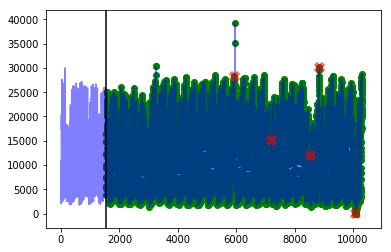




--- exchange-2_cpm_results ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  16
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 39

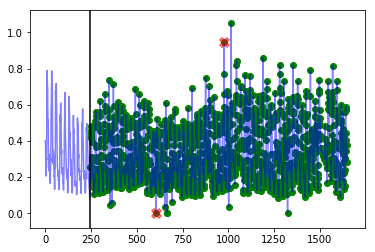




--- exchange-3_cpm_results ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394

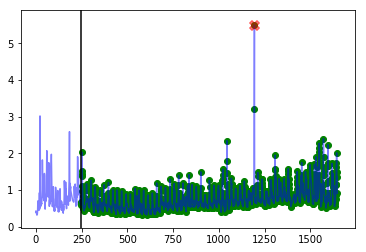




--- all_data_gift_certificates ---
Corresponding window precision:  0.11538461538461539
Corresponding window recall:  1.0
Corresponding window false positives:  23
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1317, 1318, 1319, 1320, 1321, 1322, 1323, 1324, 1325, 1326, 1327, 1328, 1329, 1330, 1331, 1332, 1333, 1334, 1335, 1336, 1337, 1338, 1339, 1340, 1341, 1342, 1343, 1344, 1345, 1346, 1347, 1348, 1349, 1350, 1351, 1352, 1353, 1354, 1355, 1356, 1357, 1358, 1359, 1360, 1361, 1362, 1363, 1364, 1365, 1366, 1367, 1368, 1369, 1370, 1371, 1372, 1373, 1374, 1375, 1376, 1377, 1378, 1379, 1380, 1381, 1382, 1383, 1384, 1385, 1386, 1387, 1388, 1389, 1390, 1391, 1392, 1393, 1394, 1395, 1396, 1397, 1398, 1399, 1400, 1401, 1402, 1403, 1404, 1405, 1406, 1407, 1408, 1409, 1410, 1411, 1412, 1413, 1414, 1415, 1416, 1417, 1418, 1419, 1420, 1421, 1422, 1423, 1424, 1425, 1426, 1427, 1428, 1429, 1430, 1431, 1432, 1433, 1434, 1435, 1436, 1437, 1438, 

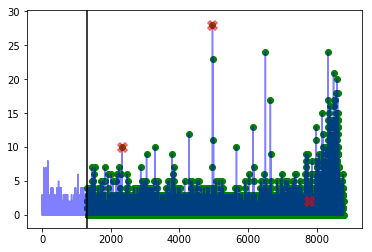




--- elb_request_count_8c0756 ---
Corresponding window precision:  0.11764705882352941
Corresponding window recall:  1.0
Corresponding window false positives:  15
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [606, 607, 608, 609, 610, 611, 612, 613, 614, 615, 616, 617, 618, 619, 620, 621, 622, 623, 624, 625, 626, 627, 628, 629, 630, 631, 632, 633, 634, 635, 636, 637, 638, 639, 640, 641, 642, 643, 644, 645, 646, 647, 648, 649, 650, 651, 652, 653, 654, 655, 656, 657, 658, 659, 660, 661, 662, 663, 664, 665, 666, 667, 668, 669, 670, 671, 672, 673, 674, 675, 676, 677, 678, 679, 680, 681, 682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752,

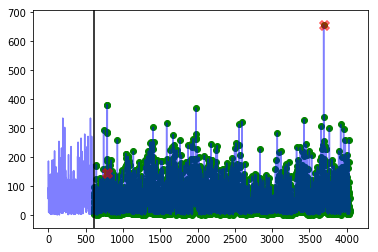




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.11538461538461539
Corresponding window recall:  1.0
Corresponding window false positives:  23
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [662, 663, 664, 665, 666, 667, 668, 669, 670, 671, 672, 673, 674, 675, 676, 677, 678, 679, 680, 681, 682, 683, 684, 685, 686, 687, 688, 689, 690, 691, 692, 693, 694, 695, 696, 697, 698, 699, 700, 701, 702, 703, 704, 705, 706, 707, 708, 709, 710, 711, 712, 713, 714, 715, 716, 717, 718, 719, 720, 721, 722, 723, 724, 725, 726, 727, 728, 729, 730, 731, 732, 733, 734, 735, 736, 737, 738, 739, 740, 741, 742, 743, 744, 745, 746, 747, 748, 749, 750, 751, 752, 753, 754, 755, 756, 757, 758, 759, 760, 761, 762, 763, 764, 765, 766, 767, 768, 769, 770, 771, 772, 773, 774, 775, 776, 777, 778, 779, 780, 781, 782, 783, 784, 785, 786, 787, 788, 789, 790, 791, 792, 793, 794, 795, 796, 797, 798, 799, 800, 801, 802, 803, 804, 805, 806, 807,

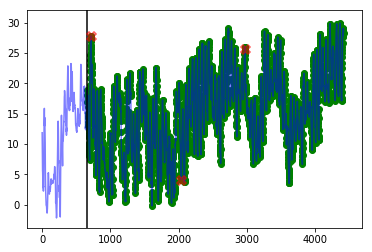




--- exchange-2_cpc_results ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394

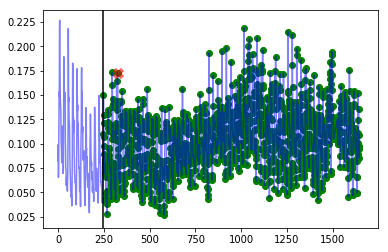




--- exchange-3_cpc_results ---
Corresponding window precision:  0.11538461538461539
Corresponding window recall:  1.0
Corresponding window false positives:  23
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 3

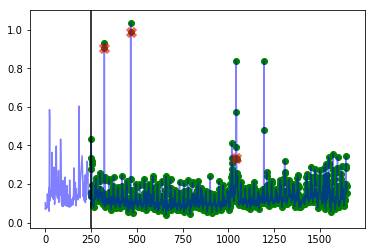




--- international-airline-passengers ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  8
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143]


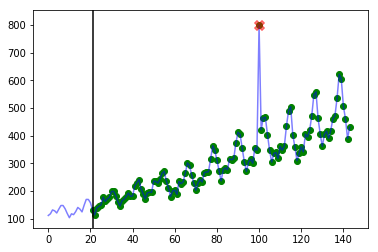




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.1111111111111111
Corresponding window recall:  1.0
Corresponding window false positives:  16
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1183, 1184, 1185, 1186, 1187, 1188, 1189, 1190, 1191, 1192, 1193, 1194, 1195, 1196, 1197, 1198, 1199, 1200, 1201, 1202, 1203, 1204, 1205, 1206, 1207, 1208, 1209, 1210, 1211, 1212, 1213, 1214, 1215, 1216, 1217, 1218, 1219, 1220, 1221, 1222, 1223, 1224, 1225, 1226, 1227, 1228, 1229, 1230, 1231, 1232, 1233, 1234, 1235, 1236, 1237, 1238, 1239, 1240, 1241, 1242, 1243, 1244, 1245, 1246, 1247, 1248, 1249, 1250, 1251, 1252, 1253, 1254, 1255, 1256, 1257, 1258, 1259, 1260, 1261, 1262, 1263, 1264, 1265, 1266, 1267, 1268, 1269, 1270, 1271, 1272, 1273, 1274, 1275, 1276, 1277, 1278, 1279, 1280, 1281, 1282, 1283, 1284, 1285, 1286, 1287, 1288, 1289, 1290, 1291, 1292, 1293, 1294, 1295, 1296, 1297, 1298, 1299, 1300, 1301, 1302, 1303,

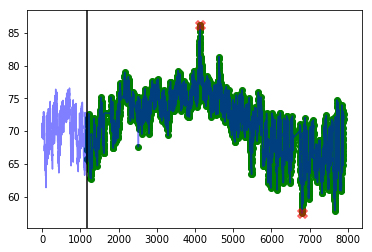

---------weight_fp=0.2, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  19.8
Best window threshold:  0.0001
Corresponding window overall precision:  0.28
Corresponding window overall recall:  0.30434782608695654
Corresponding window overall F score:  0.2916666666666667



--- nyc_taxi ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  0.4
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [5862, 5863, 5865, 5868, 5869, 5870, 5891, 5906, 5922, 5923, 5931, 5932, 5946, 5950, 5952, 8461, 8462, 8463, 8464, 8474]


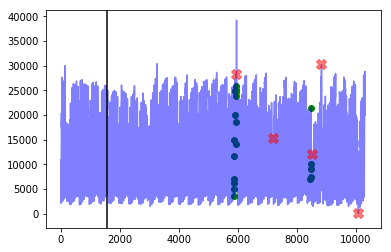




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1425, 1448, 1449]


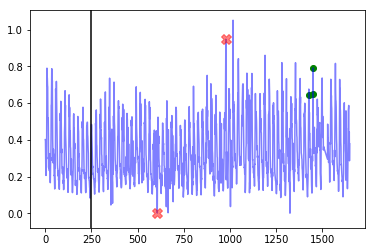




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1095, 1098, 1195]


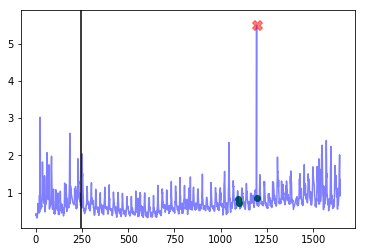




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4987, 6165, 8520, 8521, 8522, 8605, 8606, 8607, 8608, 8611, 8613, 8614, 8616, 8617, 8618, 8634, 8635]


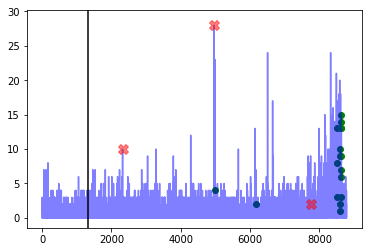




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [688, 689, 690, 691, 780, 788, 3690, 3691]


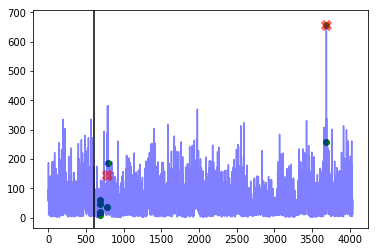




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1336, 1446, 1447, 4077, 4078, 4113]


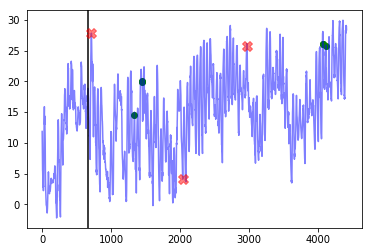




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1493, 1494, 1497]


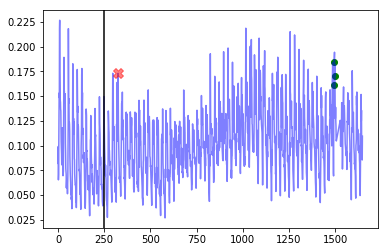




--- exchange-3_cpc_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1042, 1095]


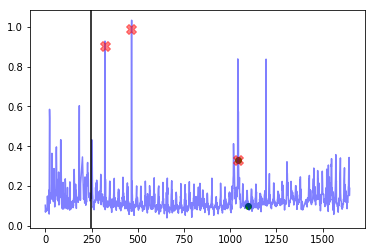




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


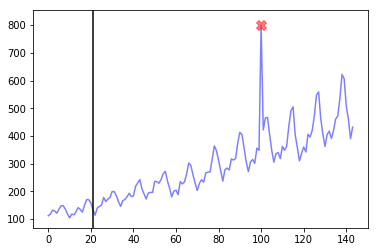




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1616, 1627, 1628, 1691, 1692, 1693, 1694, 1697, 1698, 2054, 2420, 6549, 6552, 6651, 6654]


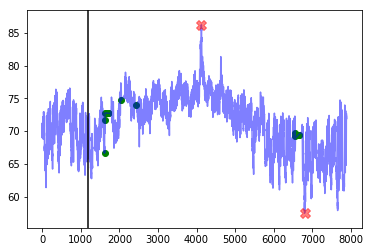

---------weight_fp=0.3, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  21.2
Best window threshold:  0.0001
Corresponding window overall precision:  0.28
Corresponding window overall recall:  0.30434782608695654
Corresponding window overall F score:  0.2916666666666667



--- nyc_taxi ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  0.4
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [5862, 5863, 5865, 5868, 5869, 5870, 5891, 5906, 5922, 5923, 5931, 5932, 5946, 5950, 5952, 8461, 8462, 8463, 8464, 8474]


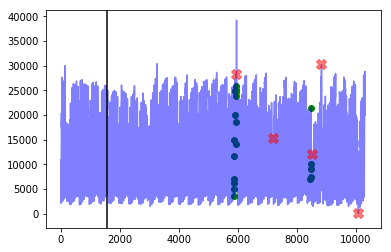




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1425, 1448, 1449]


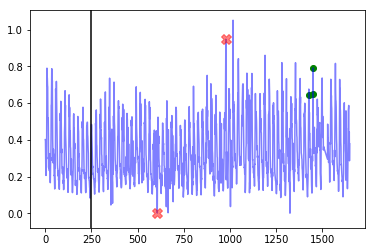




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1095, 1098, 1195]


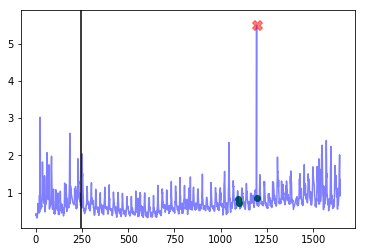




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4987, 6165, 8520, 8521, 8522, 8605, 8606, 8607, 8608, 8611, 8613, 8614, 8616, 8617, 8618, 8634, 8635]


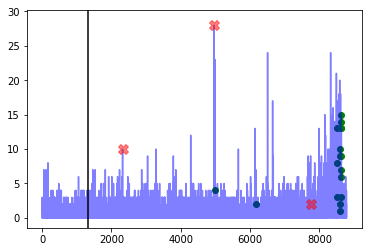




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [688, 689, 690, 691, 780, 788, 3690, 3691]


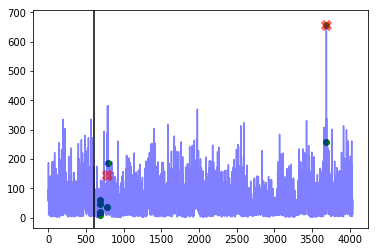




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1336, 1446, 1447, 4077, 4078, 4113]


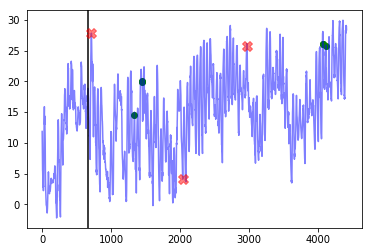




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1493, 1494, 1497]


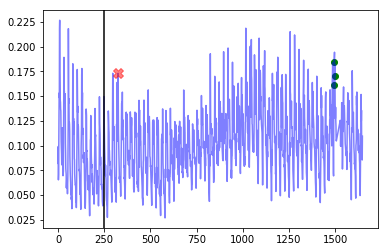




--- exchange-3_cpc_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1042, 1095]


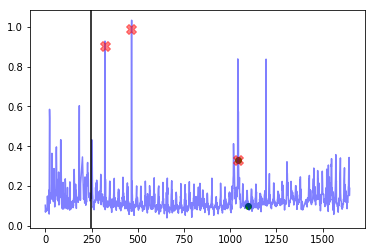




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


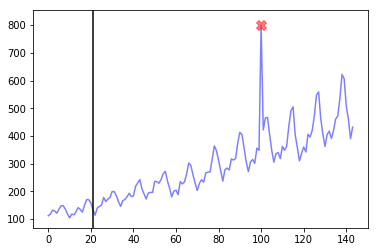




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1616, 1627, 1628, 1691, 1692, 1693, 1694, 1697, 1698, 2054, 2420, 6549, 6552, 6651, 6654]


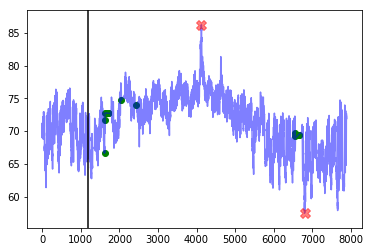

---------weight_fp=0.4, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  22.6
Best window threshold:  0.0001
Corresponding window overall precision:  0.28
Corresponding window overall recall:  0.30434782608695654
Corresponding window overall F score:  0.2916666666666667



--- nyc_taxi ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  0.4
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [5862, 5863, 5865, 5868, 5869, 5870, 5891, 5906, 5922, 5923, 5931, 5932, 5946, 5950, 5952, 8461, 8462, 8463, 8464, 8474]


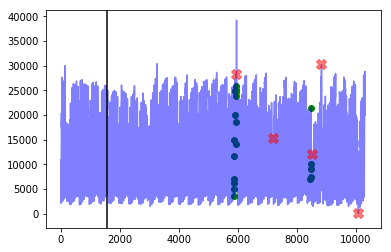




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1425, 1448, 1449]


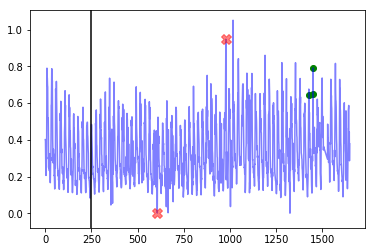




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1095, 1098, 1195]


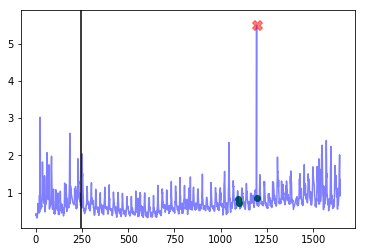




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4987, 6165, 8520, 8521, 8522, 8605, 8606, 8607, 8608, 8611, 8613, 8614, 8616, 8617, 8618, 8634, 8635]


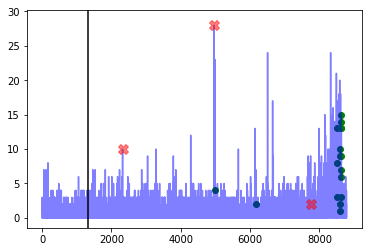




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [688, 689, 690, 691, 780, 788, 3690, 3691]


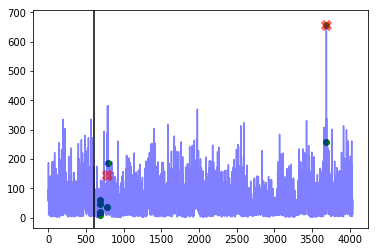




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1336, 1446, 1447, 4077, 4078, 4113]


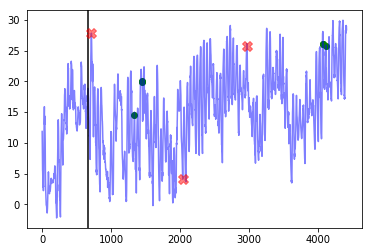




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1493, 1494, 1497]


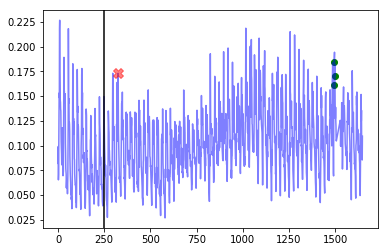




--- exchange-3_cpc_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1042, 1095]


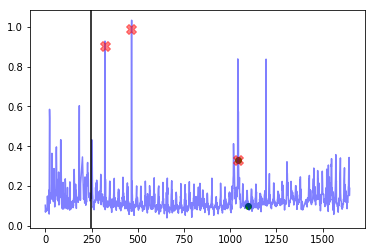




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


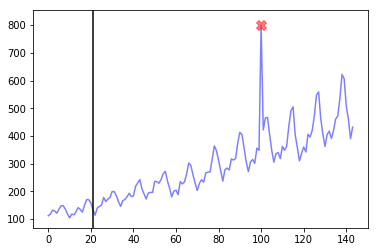




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1616, 1627, 1628, 1691, 1692, 1693, 1694, 1697, 1698, 2054, 2420, 6549, 6552, 6651, 6654]


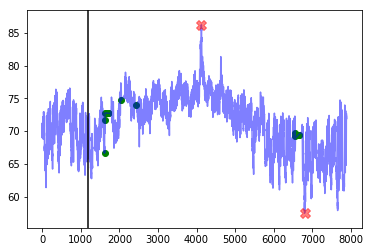

---------weight_fp=0.5, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  24.0
Best window threshold:  0.0001
Corresponding window overall precision:  0.28
Corresponding window overall recall:  0.30434782608695654
Corresponding window overall F score:  0.2916666666666667



--- nyc_taxi ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  0.4
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [5862, 5863, 5865, 5868, 5869, 5870, 5891, 5906, 5922, 5923, 5931, 5932, 5946, 5950, 5952, 8461, 8462, 8463, 8464, 8474]


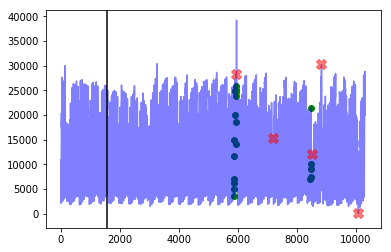




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1425, 1448, 1449]


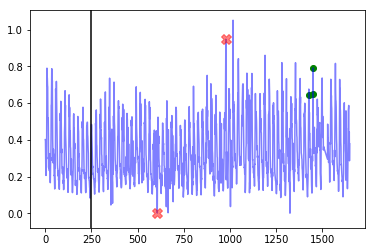




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1095, 1098, 1195]


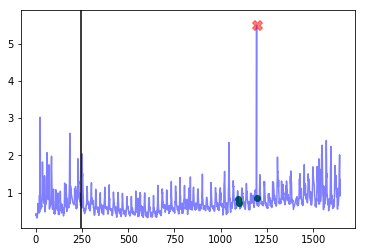




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4987, 6165, 8520, 8521, 8522, 8605, 8606, 8607, 8608, 8611, 8613, 8614, 8616, 8617, 8618, 8634, 8635]


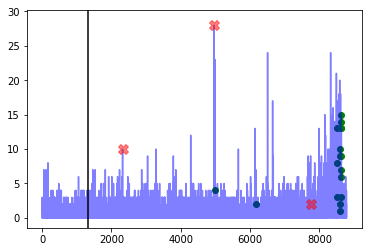




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [688, 689, 690, 691, 780, 788, 3690, 3691]


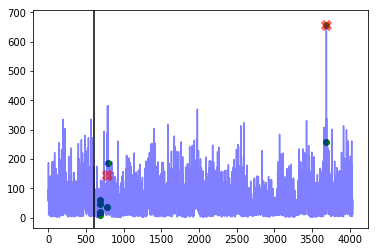




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1336, 1446, 1447, 4077, 4078, 4113]


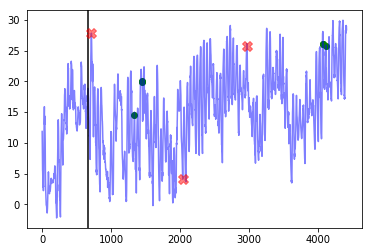




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1493, 1494, 1497]


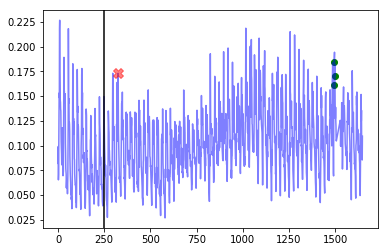




--- exchange-3_cpc_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1042, 1095]


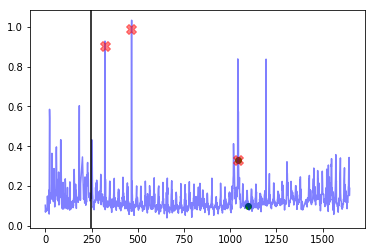




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


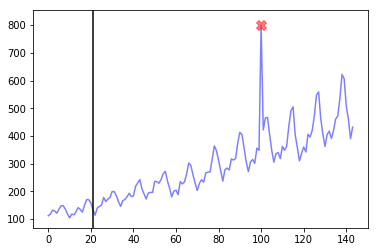




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1616, 1627, 1628, 1691, 1692, 1693, 1694, 1697, 1698, 2054, 2420, 6549, 6552, 6651, 6654]


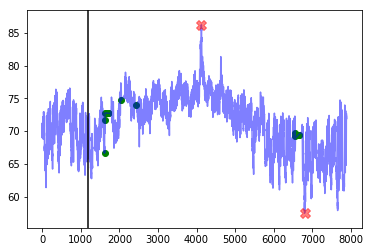

---------weight_fp=0.6, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  25.400000000000006
Best window threshold:  0.0001
Corresponding window overall precision:  0.28
Corresponding window overall recall:  0.30434782608695654
Corresponding window overall F score:  0.2916666666666667



--- nyc_taxi ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  0.4
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [5862, 5863, 5865, 5868, 5869, 5870, 5891, 5906, 5922, 5923, 5931, 5932, 5946, 5950, 5952, 8461, 8462, 8463, 8464, 8474]


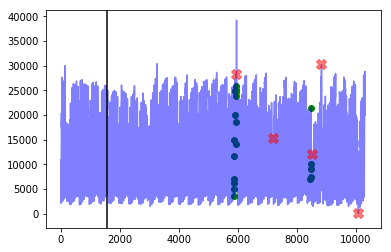




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1425, 1448, 1449]


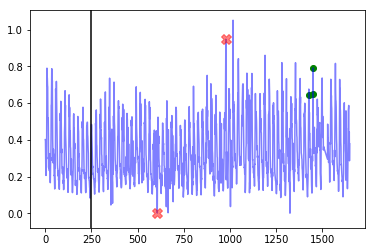




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1095, 1098, 1195]


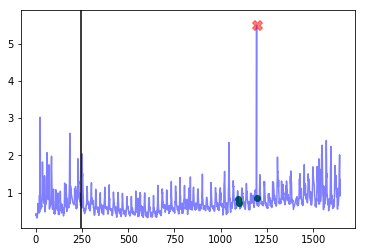




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4987, 6165, 8520, 8521, 8522, 8605, 8606, 8607, 8608, 8611, 8613, 8614, 8616, 8617, 8618, 8634, 8635]


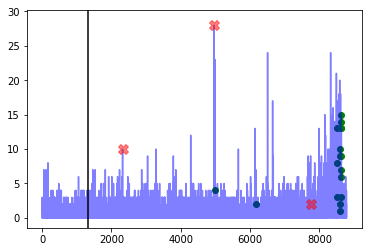




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [688, 689, 690, 691, 780, 788, 3690, 3691]


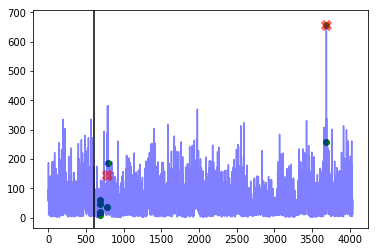




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1336, 1446, 1447, 4077, 4078, 4113]


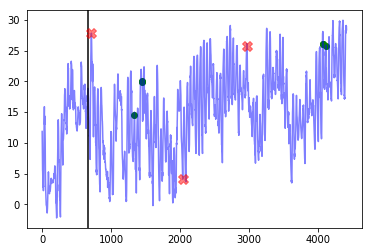




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1493, 1494, 1497]


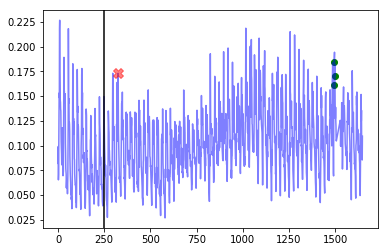




--- exchange-3_cpc_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1042, 1095]


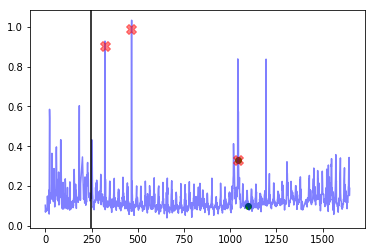




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


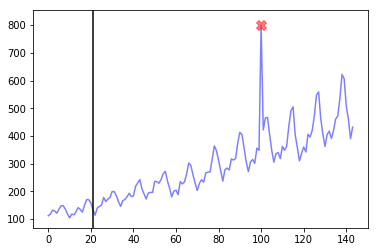




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1616, 1627, 1628, 1691, 1692, 1693, 1694, 1697, 1698, 2054, 2420, 6549, 6552, 6651, 6654]


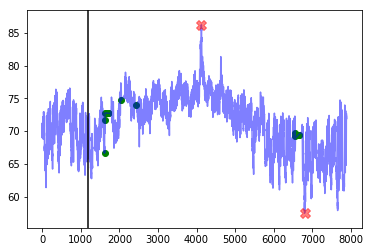

---------weight_fp=0.7, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  26.8
Best window threshold:  0.0001
Corresponding window overall precision:  0.28
Corresponding window overall recall:  0.30434782608695654
Corresponding window overall F score:  0.2916666666666667



--- nyc_taxi ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  0.4
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [5862, 5863, 5865, 5868, 5869, 5870, 5891, 5906, 5922, 5923, 5931, 5932, 5946, 5950, 5952, 8461, 8462, 8463, 8464, 8474]


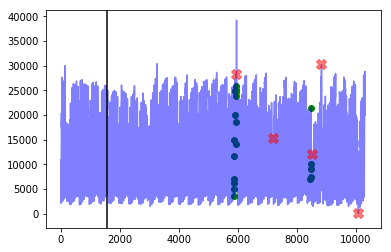




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1425, 1448, 1449]


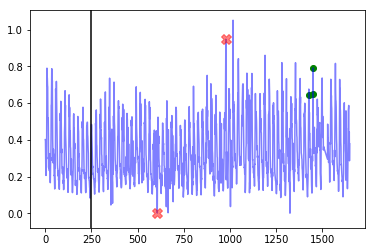




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1095, 1098, 1195]


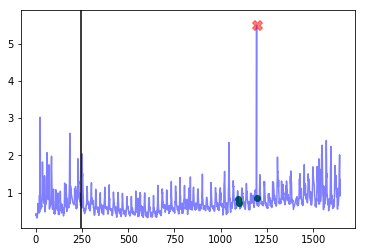




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4987, 6165, 8520, 8521, 8522, 8605, 8606, 8607, 8608, 8611, 8613, 8614, 8616, 8617, 8618, 8634, 8635]


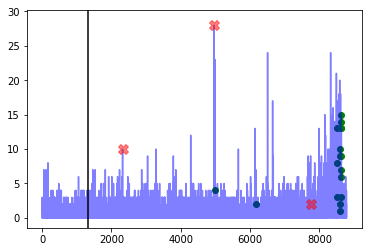




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [688, 689, 690, 691, 780, 788, 3690, 3691]


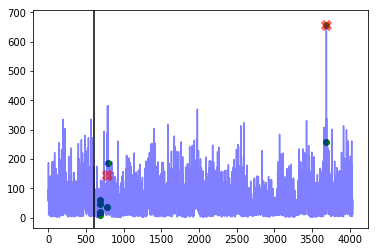




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1336, 1446, 1447, 4077, 4078, 4113]


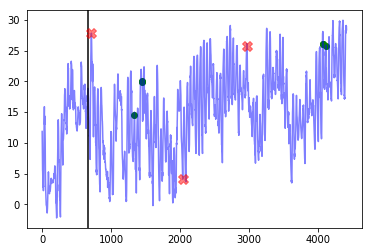




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1493, 1494, 1497]


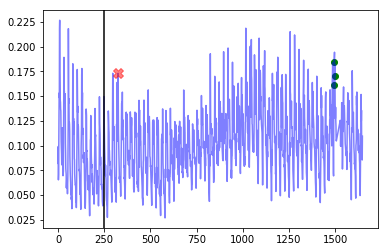




--- exchange-3_cpc_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1042, 1095]


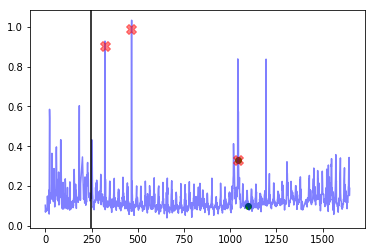




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


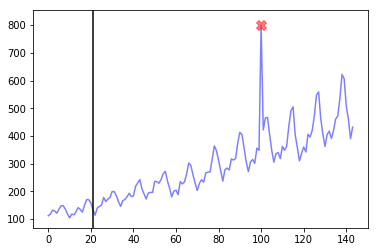




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1616, 1627, 1628, 1691, 1692, 1693, 1694, 1697, 1698, 2054, 2420, 6549, 6552, 6651, 6654]


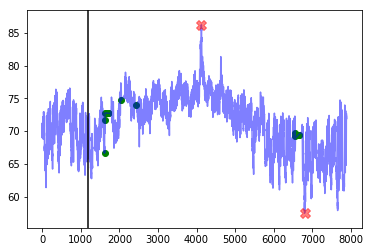

---------weight_fp=0.8, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  28.2
Best window threshold:  0.0001
Corresponding window overall precision:  0.28
Corresponding window overall recall:  0.30434782608695654
Corresponding window overall F score:  0.2916666666666667



--- nyc_taxi ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  0.4
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [5862, 5863, 5865, 5868, 5869, 5870, 5891, 5906, 5922, 5923, 5931, 5932, 5946, 5950, 5952, 8461, 8462, 8463, 8464, 8474]


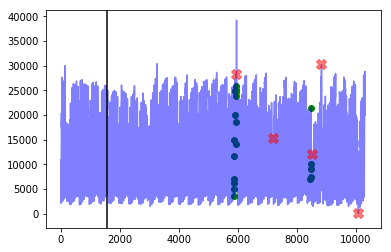




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1425, 1448, 1449]


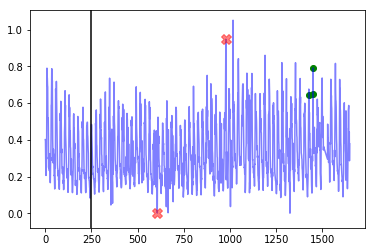




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1095, 1098, 1195]


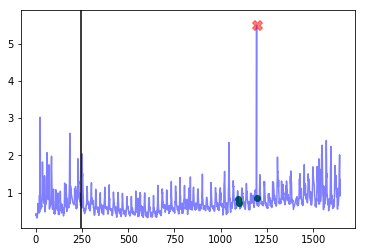




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4987, 6165, 8520, 8521, 8522, 8605, 8606, 8607, 8608, 8611, 8613, 8614, 8616, 8617, 8618, 8634, 8635]


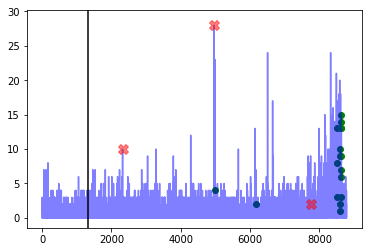




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [688, 689, 690, 691, 780, 788, 3690, 3691]


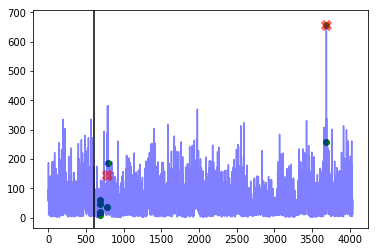




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1336, 1446, 1447, 4077, 4078, 4113]


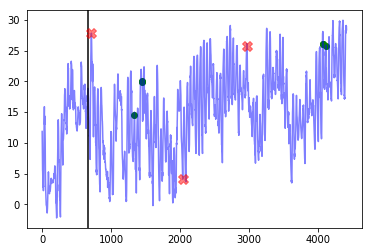




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1493, 1494, 1497]


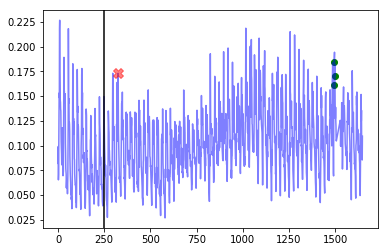




--- exchange-3_cpc_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1042, 1095]


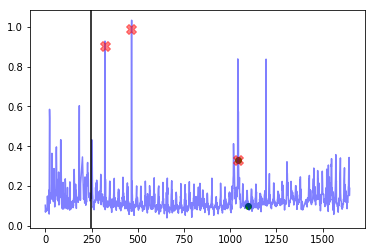




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


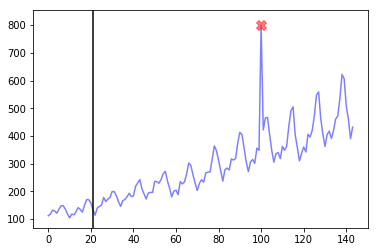




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1616, 1627, 1628, 1691, 1692, 1693, 1694, 1697, 1698, 2054, 2420, 6549, 6552, 6651, 6654]


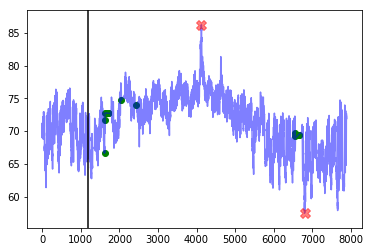

---------weight_fp=0.9, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  29.599999999999994
Best window threshold:  0.0001
Corresponding window overall precision:  0.28
Corresponding window overall recall:  0.30434782608695654
Corresponding window overall F score:  0.2916666666666667



--- nyc_taxi ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  0.4
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [5862, 5863, 5865, 5868, 5869, 5870, 5891, 5906, 5922, 5923, 5931, 5932, 5946, 5950, 5952, 8461, 8462, 8463, 8464, 8474]


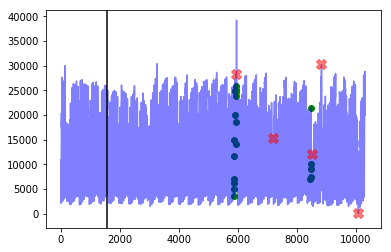




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1425, 1448, 1449]


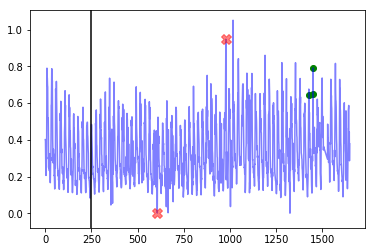




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1095, 1098, 1195]


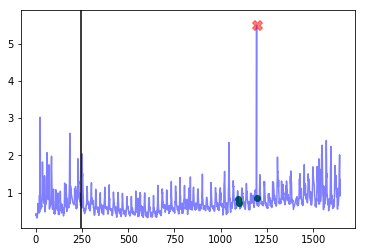




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4987, 6165, 8520, 8521, 8522, 8605, 8606, 8607, 8608, 8611, 8613, 8614, 8616, 8617, 8618, 8634, 8635]


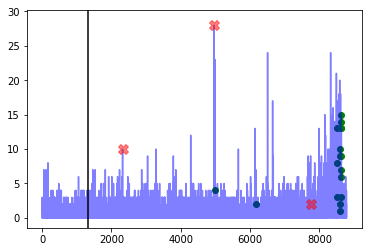




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [688, 689, 690, 691, 780, 788, 3690, 3691]


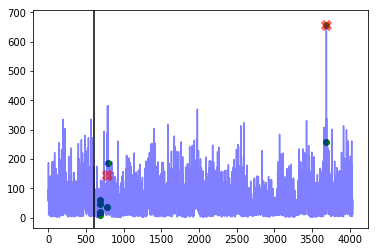




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1336, 1446, 1447, 4077, 4078, 4113]


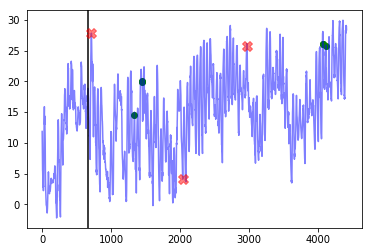




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1493, 1494, 1497]


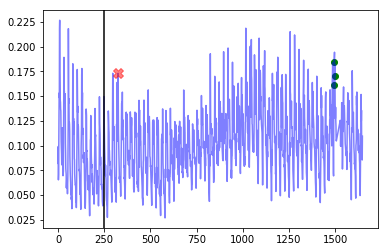




--- exchange-3_cpc_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1042, 1095]


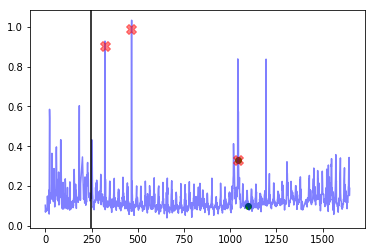




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


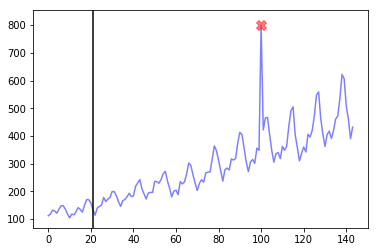




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1616, 1627, 1628, 1691, 1692, 1693, 1694, 1697, 1698, 2054, 2420, 6549, 6552, 6651, 6654]


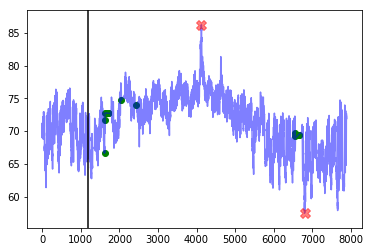

---------weight_fp=1.0, weight_fn=1----------


----Window-Based Results----
Minimum number of mistakes:  31.0
Best window threshold:  0.0001
Corresponding window overall precision:  0.28
Corresponding window overall recall:  0.30434782608695654
Corresponding window overall F score:  0.2916666666666667



--- nyc_taxi ---
Corresponding window precision:  0.6666666666666666
Corresponding window recall:  0.4
Corresponding window false positives:  1
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [5862, 5863, 5865, 5868, 5869, 5870, 5891, 5906, 5922, 5923, 5931, 5932, 5946, 5950, 5952, 8461, 8462, 8463, 8464, 8474]


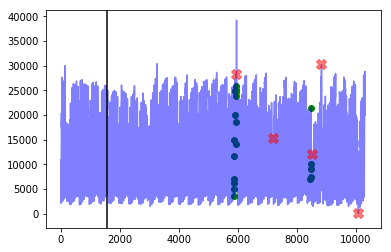




--- exchange-2_cpm_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1425, 1448, 1449]


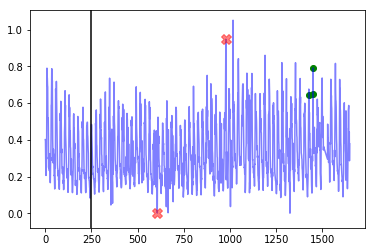




--- exchange-3_cpm_results ---
Corresponding window precision:  0.5
Corresponding window recall:  1.0
Corresponding window false positives:  1
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [1095, 1098, 1195]


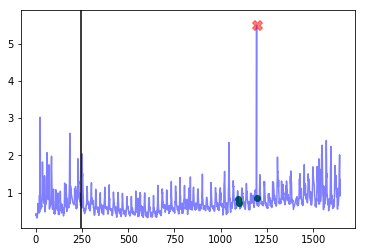




--- all_data_gift_certificates ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  3
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [4987, 6165, 8520, 8521, 8522, 8605, 8606, 8607, 8608, 8611, 8613, 8614, 8616, 8617, 8618, 8634, 8635]


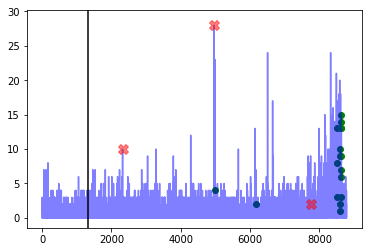




--- elb_request_count_8c0756 ---
Corresponding window precision:  1.0
Corresponding window recall:  1.0
Corresponding window false positives:  0
Corresponding window false negatives:  0


Outlier indices as determined by best window threshold:  [688, 689, 690, 691, 780, 788, 3690, 3691]


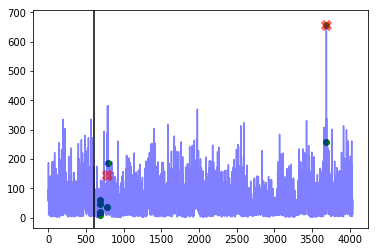




--- FARM_Bowling-Green-5-S_Warren ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  2
Corresponding window false negatives:  3


Outlier indices as determined by best window threshold:  [1336, 1446, 1447, 4077, 4078, 4113]


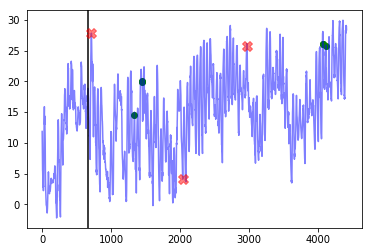




--- exchange-2_cpc_results ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  1
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  [1493, 1494, 1497]


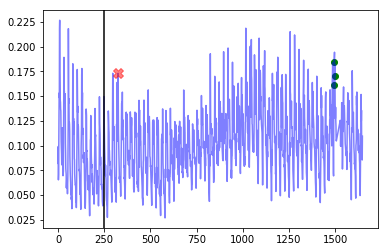




--- exchange-3_cpc_results ---
Corresponding window precision:  0.5
Corresponding window recall:  0.3333333333333333
Corresponding window false positives:  1
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1042, 1095]


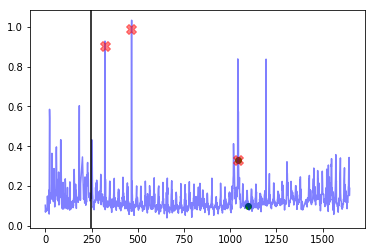




--- international-airline-passengers ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  0
Corresponding window false negatives:  1


Outlier indices as determined by best window threshold:  []


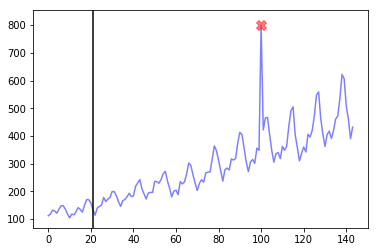




--- ambient_temperature_system_failure ---
Corresponding window precision:  0.0
Corresponding window recall:  0.0
Corresponding window false positives:  4
Corresponding window false negatives:  2


Outlier indices as determined by best window threshold:  [1616, 1627, 1628, 1691, 1692, 1693, 1694, 1697, 1698, 2054, 2420, 6549, 6552, 6651, 6654]


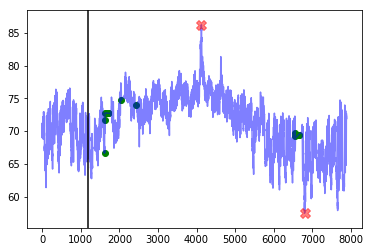

------------
False Positive Weight:  0.1
	 Minimum number of mistakes : 17.800000000000004
	 Best window threshold : 0.0
	 Corresponding window overall precision : 0.11330049261083744
	 Corresponding window overall recall : 1.0
	 Corresponding window overall F score : 0.20353982300884957
False Positive Weight:  0.2
	 Minimum number of mistakes : 19.8
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.28
	 Corresponding window overall recall : 0.30434782608695654
	 Corresponding window overall F score : 0.2916666666666667
False Positive Weight:  0.3
	 Minimum number of mistakes : 21.2
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.28
	 Corresponding window overall recall : 0.30434782608695654
	 Corresponding window overall F score : 0.2916666666666667
False Positive Weight:  0.4
	 Minimum number of mistakes : 22.6
	 Best window threshold : 0.0001
	 Corresponding window overall precision : 0.28
	 Corresponding window overall recal

In [21]:
end_results = {}
for weight_fp in weight_fp_list:  
    print("---------weight_fp=" + str(weight_fp) + ", weight_fn=1----------")
    weight_result = adclasses.pretty_print_results(ad_dict, anomaly_scores_dict, true_outlier_indices_dict, weight_fp=weight_fp, weight_fn=1)
    end_results[weight_fp] = weight_result

print("------------")
adclasses.pretty_print_end_results(end_results)

# NAB Score

    1. make a python 2.7 virtual environment
    2. pip install pandas
    3. git clone NAB
    4. pip install . in NAB

To obtain NAB scores for every method on the seasonal datasets, we must do the following:

# Have a new dataset?

1. add the new dataset csv with timestamp, value in respective folder in data folder. no missing time steps allowed

2. add the point anomaly dates to combined_labels.json in labels folder

3. add the anomaly windows to combined_windows.json  (start and end dates)

4. in results/null, include null_datasetname.csv with timestamp, value, label, and anomaly_score (all .5). You can just use the adclasses.create_result_csv function and delete irrelevant columns and fill anomaly_score with all .5s

WARNING: Some datasets we use are already in NAB, but they have missing time steps. Replace the dataset csv in the data folder with a prefilled version as the anomaly scores we use assume no missing time steps. You can just use the adclasses.create_result_csv function and delete irrelevant columns

In [43]:
dataset_name = "FARM_Bowling-Green-5-S_Warren"
path = "data/" + dataset_name + ".csv"

data = pd.read_csv(path,header=0)
start_date = data["UTME"].values[0]
end_date = data["UTME"].values[-1]
print("Start date: ", start_date)
print("\nEnd date: ", end_date)
narrowed = []
for item in data["TAIR"].values:
    if not math.isnan(item):
        narrowed.append(item)
print("\nMedian:  ",np.median(narrowed), "\n")
print(data["TAIR"].describe())
display(data.head())

data["UTME"] = pd.to_datetime(data["UTME"],format="%Y-%m-%d %H:%M:%S UTC")
del data["NET"]
del data["STID"]
tair_data = pd.DataFrame({"UTME":data["UTME"],"TAIR":data["TAIR"]})
tair_data.set_index("UTME",inplace=True)
missing = tair_data[tair_data['TAIR'].isnull()].index
print("\n # of missing time steps using old granularity: ",len(missing))
tair_data = tair_data.interpolate()

resampled_tair_data = tair_data.resample('30Min', how={'TAIR': np.mean})

def round_2(num):
    return round(num,2)

resampled_tair_data["TAIR"]=resampled_tair_data["TAIR"].apply(round_2)

renamed_resampled_tair_data = pd.DataFrame({"timestamp": resampled_tair_data.index, "value":resampled_tair_data["TAIR"]})

data = renamed_resampled_tair_data

start_date = data["timestamp"].values[0]
end_date = data["timestamp"].values[-1]
print("Start date: ", start_date)
print("End date: ", end_date)


data["timestamp"] = pd.to_datetime(data["timestamp"], 
                                   format="%Y-%m-%d %H:%M:%S")

print("Missing time stamps: \n", adclasses.find_missing_time_steps(start_date, end_date, 
                                                                   '30min', data))

# if you want to use a method that cannot take missing time steps
# into account, you need to fill in the missing time steps yourself
# this function also removes duplicates
print("Fill Missing Time Steps with Interpolation")
data = adclasses.fill_missing_time_steps(start_date, end_date, '30min', data, method="linear")

ad = adclasses.UnivariateAnomalyDetection(dataframe=data, 
                                          timestep="30min", 
                                          dateformat="%Y-%m-%d %H:%M:%S", 
                                          name=dataset_name)
print("Length: ", ad.get_length())
print("Time step size: ", ad.get_timestep())
print("Start Date: ", start_date)
print("End Date: ", end_date)
print("Date Format: ", ad.get_dateformat())
true_outlier_dates = ["2016-03-15 21:00:00",
                      "2016-04-12 11:30:00",
                      "2016-05-01 21:30:00"]

d = timedelta(minutes=30)
for outlier_date in true_outlier_dates:
    print(adclasses.get_window_ends(outlier_date, 
                                    ad.get_length(), 
                                    len(true_outlier_dates), 
                                    ad.get_dateformat(), d))

Start date:  2016-03-01 00:00:00 UTC

End date:  2016-05-31 23:55:00 UTC

Median:   15.455 

count    26465.000000
mean        14.830008
std          6.676933
min         -2.490000
25%         10.198000
50%         15.455000
75%         19.325000
max         30.304000
Name: TAIR, dtype: float64


,NET,STID,UTME,TAIR,RELH,TDPT,WSPD,WDIR,WSMX,WDMX,SRAD,PRCP
0,KYMN,FARM,2016-03-01 00:00:00 UTC,12.886,40.8,-0.14,1.15,183.9,1.31,180.0,0.33,0.0
1,KYMN,FARM,2016-03-01 00:05:00 UTC,13.217,40.8,0.18,1.02,196.8,1.11,192.3,0.17,0.0
2,KYMN,FARM,2016-03-01 00:10:00 UTC,12.901,41.5,0.10,0.82,211.2,0.92,202.8,0.17,0.0
3,KYMN,FARM,2016-03-01 00:15:00 UTC,11.200,48.2,0.63,0.73,220.5,0.92,220.4,0.00,0.0
4,KYMN,FARM,2016-03-01 00:20:00 UTC,10.414,49.8,0.37,0.44,220.5,0.69,220.5,0.00,0.0



 # of missing time steps using old granularity:  19
Start date:  2016-03-01T00:00:00.000000000
End date:  2016-05-31T23:30:00.000000000
Missing time stamps: 
 DatetimeIndex([], dtype='datetime64[ns]', freq='30T')
Fill Missing Time Steps with Interpolation
Length:  4416
Time step size:  30min
Start Date:  2016-03-01T00:00:00.000000000
End Date:  2016-05-31T23:30:00.000000000
Date Format:  %Y-%m-%d %H:%M:%S
(Timestamp('2016-03-14 08:30:00'), Timestamp('2016-03-17 09:30:00'))
(Timestamp('2016-04-10 23:00:00'), Timestamp('2016-04-14 00:00:00'))
(Timestamp('2016-04-30 09:00:00'), Timestamp('2016-05-03 10:00:00'))


# For every anomaly detection method "method_name" and dataset "dataset_name", do the following:

0. clear up previous NAB/results/

1. $ python scripts/create_new_detector.py --detector method_name

this creates the method_name folder in results folder with a bunch of datasets folders that are empty. delete the irrelevant ones

2. for every characteristic relevant dataset, create csvs with columns like so: timestamp, value, anomaly_score, label. place in appropriate locations in results/method_name/

3. replace datasets with prefill

4. $ python run.py -d method_name --optimize --score --normalize

WARNING: HAVE TO MAKE CHANGE TO NAB function convertAnomalyScoresToDetections in util.py bc it will think values are strings

In [47]:
prepath="/home/cfreeman/Documents/NextIT/test_python_2/NAB/results_seasonality" + window_size + "/"

# STL Resid

Final score for 'stl' detector on 'reward_low_FP_rate' profile = 31.54

Final score for 'stl' detector on 'reward_low_FN_rate' profile = 46.30

Final score for 'stl' detector on 'standard' profile = 32.32


In [5]:
folder="selfCreate"
method_name = "stl"
dataset_name = "FARM_Bowling-Green-5-S_Warren"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "30min"
true_outlier_dates = ["2016-03-15 21:00:00",
                      "2016-04-12 11:30:00",
                      "2016-05-01 21:30:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "stl"
dataset_name = "nyc_taxi"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "30min"
true_outlier_dates = ["2014-11-01 19:00:00",
                      "2014-11-27 15:30:00",
                      "2014-12-25 15:00:00",
                      "2015-01-01 01:00:00",
                      "2015-01-27 00:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "stl"
dataset_name = "exchange-2_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-26 06:00:01",
                      "2011-08-10 17:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "stl"
dataset_name = "exchange-3_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-08-19 18:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "stl"
dataset_name = "all_data_gift_certificates"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2016-04-06 16:00:00",
                      "2016-07-25 19:00:00",
                      "2016-11-19 20:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "stl"
dataset_name = "elb_request_count_8c0756"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-12 17:24:00",
                      "2014-04-22 19:34:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "stl"
dataset_name = "exchange-2_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 13:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "stl"
dataset_name = "exchange-3_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 10:15:01",
                      "2011-07-20 10:15:01",
                      "2011-08-13 10:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "stl"
dataset_name = "international-airline-passengers"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1MS"
true_outlier_dates = ["1957-05"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "stl"
dataset_name = "ambient_temperature_system_failure"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2013-12-22 20:00:00",
                      "2014-04-13 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.408490
2011-08-24 12:00:01  0.461745
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.40849
Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.131250
2011-08-24 12:00:01  0.119453
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.13125


# SARIMA

Final score for 'SARIMA' detector on 'auto_reward_low_FP_rate' profile = 39.52

Final score for 'SARIMA' detector on 'auto_reward_low_FN_rate' profile = 56.98

Final score for 'SARIMA' detector on 'auto_standard' profile = 41.96



In [16]:
folder="selfCreate"
method_name = "SARIMA_auto"
dataset_name = "FARM_Bowling-Green-5-S_Warren"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "30min"
true_outlier_dates = ["2016-03-15 21:00:00",
                      "2016-04-12 11:30:00",
                      "2016-05-01 21:30:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "SARIMA_auto"
dataset_name = "nyc_taxi"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "30min"
true_outlier_dates = ["2014-11-01 19:00:00",
                      "2014-11-27 15:30:00",
                      "2014-12-25 15:00:00",
                      "2015-01-01 01:00:00",
                      "2015-01-27 00:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "SARIMA_auto"
dataset_name = "exchange-2_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-26 06:00:01",
                      "2011-08-10 17:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "SARIMA_auto"
dataset_name = "exchange-3_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-08-19 18:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "SARIMA_auto"
dataset_name = "all_data_gift_certificates"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2016-04-06 16:00:00",
                      "2016-07-25 19:00:00",
                      "2016-11-19 20:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "SARIMA_auto"
dataset_name = "elb_request_count_8c0756"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-12 17:24:00",
                      "2014-04-22 19:34:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "SARIMA_auto"
dataset_name = "exchange-2_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 13:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "SARIMA_auto"
dataset_name = "exchange-3_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 10:15:01",
                      "2011-07-20 10:15:01",
                      "2011-08-13 10:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "SARIMA_auto"
dataset_name = "international-airline-passengers"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1MS"
true_outlier_dates = ["1957-05"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "SARIMA_auto"
dataset_name = "ambient_temperature_system_failure"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2013-12-22 20:00:00",
                      "2014-04-13 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.408490
2011-08-24 12:00:01  0.461745
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.40849
Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.131250
2011-08-24 12:00:01  0.119453
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.13125


# Prophet

Final score for 'Prophet' detector on 'reward_low_FP_rate' profile = 36.83

Final score for 'Prophet' detector on 'reward_low_FN_rate' profile = 56.01

Final score for 'Prophet' detector on 'standard' profile = 40.34


In [7]:
folder="selfCreate"
method_name = "Prophet"
dataset_name = "FARM_Bowling-Green-5-S_Warren"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "30min"
true_outlier_dates = ["2016-03-15 21:00:00",
                      "2016-04-12 11:30:00",
                      "2016-05-01 21:30:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "Prophet"
dataset_name = "nyc_taxi"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "30min"
true_outlier_dates = ["2014-11-01 19:00:00",
                      "2014-11-27 15:30:00",
                      "2014-12-25 15:00:00",
                      "2015-01-01 01:00:00",
                      "2015-01-27 00:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "Prophet"
dataset_name = "exchange-2_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-26 06:00:01",
                      "2011-08-10 17:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "Prophet"
dataset_name = "exchange-3_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-08-19 18:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "Prophet"
dataset_name = "all_data_gift_certificates"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2016-04-06 16:00:00",
                      "2016-07-25 19:00:00",
                      "2016-11-19 20:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "Prophet"
dataset_name = "elb_request_count_8c0756"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-12 17:24:00",
                      "2014-04-22 19:34:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "Prophet"
dataset_name = "exchange-2_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 13:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "Prophet"
dataset_name = "exchange-3_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 10:15:01",
                      "2011-07-20 10:15:01",
                      "2011-08-13 10:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "Prophet"
dataset_name = "international-airline-passengers"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1MS"
true_outlier_dates = ["1957-05"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "Prophet"
dataset_name = "ambient_temperature_system_failure"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2013-12-22 20:00:00",
                      "2014-04-13 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.408490
2011-08-24 12:00:01  0.461745
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.40849
Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.131250
2011-08-24 12:00:01  0.119453
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.13125


# HTM

Final score for 'HTM' detector on 'reward_low_FP_rate' profile = 41.37

Final score for 'HTM' detector on 'reward_low_FN_rate' profile = 57.96

Final score for 'HTM' detector on 'standard' profile = 42.74


In [8]:
folder="selfCreate"
method_name = "HTM"
dataset_name = "FARM_Bowling-Green-5-S_Warren"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "30min"
true_outlier_dates = ["2016-03-15 21:00:00",
                      "2016-04-12 11:30:00",
                      "2016-05-01 21:30:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "HTM"
dataset_name = "nyc_taxi"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "30min"
true_outlier_dates = ["2014-11-01 19:00:00",
                      "2014-11-27 15:30:00",
                      "2014-12-25 15:00:00",
                      "2015-01-01 01:00:00",
                      "2015-01-27 00:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "HTM"
dataset_name = "exchange-2_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-26 06:00:01",
                      "2011-08-10 17:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "HTM"
dataset_name = "exchange-3_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-08-19 18:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "HTM"
dataset_name = "all_data_gift_certificates"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2016-04-06 16:00:00",
                      "2016-07-25 19:00:00",
                      "2016-11-19 20:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "HTM"
dataset_name = "elb_request_count_8c0756"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-12 17:24:00",
                      "2014-04-22 19:34:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "HTM"
dataset_name = "exchange-2_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 13:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "HTM"
dataset_name = "exchange-3_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 10:15:01",
                      "2011-07-20 10:15:01",
                      "2011-08-13 10:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "HTM"
dataset_name = "ambient_temperature_system_failure"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2013-12-22 20:00:00",
                      "2014-04-13 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.408490
2011-08-24 12:00:01  0.461745
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.40849
Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.131250
2011-08-24 12:00:01  0.119453
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.13125


# Windowed Gaussian

Final score for 'windowed' detector on 'gaussian_reward_low_FP_rate' profile = 29.43

Final score for 'windowed' detector on 'gaussian_reward_low_FN_rate' profile = 51.05

Final score for 'windowed' detector on 'gaussian_standard' profile = 35.31


In [9]:
folder="selfCreate"
method_name = "windowed_gaussian"
dataset_name = "FARM_Bowling-Green-5-S_Warren"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "30min"
true_outlier_dates = ["2016-03-15 21:00:00",
                      "2016-04-12 11:30:00",
                      "2016-05-01 21:30:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "windowed_gaussian"
dataset_name = "nyc_taxi"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "30min"
true_outlier_dates = ["2014-11-01 19:00:00",
                      "2014-11-27 15:30:00",
                      "2014-12-25 15:00:00",
                      "2015-01-01 01:00:00",
                      "2015-01-27 00:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "windowed_gaussian"
dataset_name = "exchange-2_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-26 06:00:01",
                      "2011-08-10 17:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "windowed_gaussian"
dataset_name = "exchange-3_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-08-19 18:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "windowed_gaussian"
dataset_name = "all_data_gift_certificates"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2016-04-06 16:00:00",
                      "2016-07-25 19:00:00",
                      "2016-11-19 20:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "windowed_gaussian"
dataset_name = "elb_request_count_8c0756"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-12 17:24:00",
                      "2014-04-22 19:34:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "windowed_gaussian"
dataset_name = "exchange-2_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 13:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "windowed_gaussian"
dataset_name = "exchange-3_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 10:15:01",
                      "2011-07-20 10:15:01",
                      "2011-08-13 10:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "windowed_gaussian"
dataset_name = "international-airline-passengers"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1MS"
true_outlier_dates = ["1957-05"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "windowed_gaussian"
dataset_name = "ambient_temperature_system_failure"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2013-12-22 20:00:00",
                      "2014-04-13 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.408490
2011-08-24 12:00:01  0.461745
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.40849
Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.131250
2011-08-24 12:00:01  0.119453
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.13125


# HOTSAX


Final score for 'hotsax' detector on 'reward_low_FP_rate' profile = 35.96

Final score for 'hotsax' detector on 'reward_low_FN_rate' profile = 52.82

Final score for 'hotsax' detector on 'standard' profile = 37.97


In [23]:
folder="selfCreate"
method_name = "hotsax"
dataset_name = "FARM_Bowling-Green-5-S_Warren"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "30min"
true_outlier_dates = ["2016-03-15 21:00:00",
                      "2016-04-12 11:30:00",
                      "2016-05-01 21:30:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "hotsax"
dataset_name = "nyc_taxi"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "30min"
true_outlier_dates = ["2014-11-01 19:00:00",
                      "2014-11-27 15:30:00",
                      "2014-12-25 15:00:00",
                      "2015-01-01 01:00:00",
                      "2015-01-27 00:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "hotsax"
dataset_name = "exchange-2_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-26 06:00:01",
                      "2011-08-10 17:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "hotsax"
dataset_name = "exchange-3_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-08-19 18:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "hotsax"
dataset_name = "all_data_gift_certificates"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2016-04-06 16:00:00",
                      "2016-07-25 19:00:00",
                      "2016-11-19 20:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "hotsax"
dataset_name = "elb_request_count_8c0756"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-12 17:24:00",
                      "2014-04-22 19:34:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "hotsax"
dataset_name = "exchange-2_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 13:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "hotsax"
dataset_name = "exchange-3_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 10:15:01",
                      "2011-07-20 10:15:01",
                      "2011-08-13 10:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "hotsax"
dataset_name = "international-airline-passengers"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1MS"
true_outlier_dates = ["1957-05"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "hotsax"
dataset_name = "ambient_temperature_system_failure"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2013-12-22 20:00:00",
                      "2014-04-13 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.408490
2011-08-24 12:00:01  0.461745
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.40849
Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.131250
2011-08-24 12:00:01  0.119453
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.13125


# Twitter

Final score for 'Twitter' detector on 'reward_low_FP_rate' profile = 38.33

Final score for 'Twitter' detector on 'reward_low_FN_rate' profile = 53.57

Final score for 'Twitter' detector on 'standard' profile = 39.03


In [24]:
folder="selfCreate"
method_name = "Twitter"
dataset_name = "FARM_Bowling-Green-5-S_Warren"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "30min"
true_outlier_dates = ["2016-03-15 21:00:00",
                      "2016-04-12 11:30:00",
                      "2016-05-01 21:30:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "Twitter"
dataset_name = "nyc_taxi"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "30min"
true_outlier_dates = ["2014-11-01 19:00:00",
                      "2014-11-27 15:30:00",
                      "2014-12-25 15:00:00",
                      "2015-01-01 01:00:00",
                      "2015-01-27 00:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "Twitter"
dataset_name = "exchange-2_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-26 06:00:01",
                      "2011-08-10 17:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "Twitter"
dataset_name = "exchange-3_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-08-19 18:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "Twitter"
dataset_name = "all_data_gift_certificates"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2016-04-06 16:00:00",
                      "2016-07-25 19:00:00",
                      "2016-11-19 20:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "Twitter"
dataset_name = "elb_request_count_8c0756"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-12 17:24:00",
                      "2014-04-22 19:34:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "Twitter"
dataset_name = "exchange-2_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 13:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "Twitter"
dataset_name = "exchange-3_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 10:15:01",
                      "2011-07-20 10:15:01",
                      "2011-08-13 10:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "Twitter"
dataset_name = "international-airline-passengers"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1MS"
true_outlier_dates = ["1957-05"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "Twitter"
dataset_name = "ambient_temperature_system_failure"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2013-12-22 20:00:00",
                      "2014-04-13 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.408490
2011-08-24 12:00:01  0.461745
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.40849
Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.131250
2011-08-24 12:00:01  0.119453
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.13125


# Anomalous

Final score for 'anomalous' detector on 'reward_low_FP_rate' profile = 35.27

Final score for 'anomalous' detector on 'reward_low_FN_rate' profile = 51.57

Final score for 'anomalous' detector on 'standard' profile = 36.91


In [25]:
folder="selfCreate"
method_name = "anomalous"
dataset_name = "FARM_Bowling-Green-5-S_Warren"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "30min"
true_outlier_dates = ["2016-03-15 21:00:00",
                      "2016-04-12 11:30:00",
                      "2016-05-01 21:30:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "anomalous"
dataset_name = "nyc_taxi"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "30min"
true_outlier_dates = ["2014-11-01 19:00:00",
                      "2014-11-27 15:30:00",
                      "2014-12-25 15:00:00",
                      "2015-01-01 01:00:00",
                      "2015-01-27 00:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "anomalous"
dataset_name = "exchange-2_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-26 06:00:01",
                      "2011-08-10 17:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "anomalous"
dataset_name = "exchange-3_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-08-19 18:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "anomalous"
dataset_name = "all_data_gift_certificates"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2016-04-06 16:00:00",
                      "2016-07-25 19:00:00",
                      "2016-11-19 20:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "anomalous"
dataset_name = "elb_request_count_8c0756"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-12 17:24:00",
                      "2014-04-22 19:34:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "anomalous"
dataset_name = "exchange-2_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 13:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "anomalous"
dataset_name = "exchange-3_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 10:15:01",
                      "2011-07-20 10:15:01",
                      "2011-08-13 10:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "anomalous"
dataset_name = "international-airline-passengers"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1MS"
true_outlier_dates = ["1957-05"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "anomalous"
dataset_name = "ambient_temperature_system_failure"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2013-12-22 20:00:00",
                      "2014-04-13 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.408490
2011-08-24 12:00:01  0.461745
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.40849
Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.131250
2011-08-24 12:00:01  0.119453
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.13125


# GLM


Final score for 'GLM' detector on 'reward_low_FP_rate' profile = 33.42

Final score for 'GLM' detector on 'reward_low_FN_rate' profile = 57.27

Final score for 'GLM' detector on 'standard' profile = 40.34


In [48]:
folder="selfCreate"
method_name = "GLM"
dataset_name = "FARM_Bowling-Green-5-S_Warren"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "30min"
true_outlier_dates = ["2016-03-15 21:00:00",
                      "2016-04-12 11:30:00",
                      "2016-05-01 21:30:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "GLM"
dataset_name = "nyc_taxi"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "30min"
true_outlier_dates = ["2014-11-01 19:00:00",
                      "2014-11-27 15:30:00",
                      "2014-12-25 15:00:00",
                      "2015-01-01 01:00:00",
                      "2015-01-27 00:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "GLM"
dataset_name = "exchange-2_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-26 06:00:01",
                      "2011-08-10 17:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "GLM"
dataset_name = "exchange-3_cpm_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-08-19 18:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "GLM"
dataset_name = "all_data_gift_certificates"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2016-04-06 16:00:00",
                      "2016-07-25 19:00:00",
                      "2016-11-19 20:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAWSCloudwatch"
method_name = "GLM"
dataset_name = "elb_request_count_8c0756"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "5min"
true_outlier_dates = ["2014-04-12 17:24:00",
                      "2014-04-22 19:34:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "GLM"
dataset_name = "exchange-2_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 13:00:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realAdExchange"
method_name = "GLM"
dataset_name = "exchange-3_cpc_results"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2011-07-14 10:15:01",
                      "2011-07-20 10:15:01",
                      "2011-08-13 10:15:01"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="selfCreate"
method_name = "GLM"
dataset_name = "international-airline-passengers"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1MS"
true_outlier_dates = ["1957-05"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###
folder="realKnownCause"
method_name = "GLM"
dataset_name = "ambient_temperature_system_failure"
date_format = "%Y-%m-%d %H:%M:%S"
timestep = "1H"
true_outlier_dates = ["2013-12-22 20:00:00",
                      "2014-04-13 09:00:00"]

adclasses.create_result_csv(window_size,prepath, folder, method_name, dataset_name, date_format, timestep, true_outlier_dates)
###

Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.408490
2011-08-24 12:00:01  0.461745
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.40849
Duplicate records found: 
                        value
timestamp                    
2011-08-24 12:00:01  0.131250
2011-08-24 12:00:01  0.119453
Removing duplicates and keeping:  
                       value
timestamp                   
2011-08-24 12:00:01  0.13125
